# 1.0 Importação de bibliotecas

In [1]:
#Manipulação de dados
import pandas as pd
import numpy as np

#Visualização de dados
import seaborn as sns
import matplotlib.pyplot as plt

#Manipulação datas
from datetime import datetime

# Prototipação
from lazypredict.Supervised import LazyClassifier


#Pipeline e pré-process
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


#Models
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.neural_network import MLPClassifier 
from sklearn.ensemble import RandomForestClassifier

#Model Tunning
from sklearn.model_selection import GridSearchCV

#Model evaluation
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

C:\Users\HP ZBook 15\AppData\Roaming\Python\Python38\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


# 2.0 Leitura dos arquivos

## Leitura de Noticias

In [2]:
dicionario_mes = {'Jan':'01', 'Fev':'02', 'Mar':'03','Abr':'04', 'Mai':'05', 'Jun':'06','Jul':'07', 'Ago':'08', 'Set':'09','Out':'10', 'Nov':'11', 'Dec':'12'}

In [3]:
df = pd.DataFrame()

for i in dicionario_mes.keys():
    arquivo = dicionario_mes[i] + "_GoogleNews_Petr_" + i + "_21.csv"
    df_leitura = pd.read_csv(arquivo, sep='|')
    df = df.append(df_leitura,ignore_index=True)

In [4]:
df.head()

,title,media,date,desc
0,A construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,01/01/2021,Dentre os principais pontos do plano estratégi...
1,"Refinaria Abreu e Lima da Petrobras, a RNEST p...",CPG Click Petroleo e Gas,01/01/2021,Petrobras informou em fato relevante na última...
2,5 Dicas de Tony Robbins para Ficar Rico Invest...,The Capital Advisor,01/01/2021,O QUE LER AGORA... ibovespa-sobe-021-apos-demi...
3,Acadêmicos de engenharia Mecânica criam projet...,CPG Click Petroleo e Gas,01/01/2021,Petrobras cancela a venda da fábrica de fertil...
4,Multinacional dinamarquesa European Energy faz...,CPG Click Petroleo e Gas,01/01/2021,Petrobras encerra sociedade com a Sete Brasil ...


In [5]:
#Transformando coluna data para datetime:
df['date'] = pd.to_datetime(df['date'])
df.dtypes

title            object
media            object
date     datetime64[ns]
desc             object
dtype: object

## Leitura dos pregões

In [6]:
df_petro = pd.read_csv('Hist_Preço_Petr_2021_.csv', sep='|')
df_petro.head()

,Date,Adj Close,Volume,Var%
0,2021-01-04,19.27,74719700,0.02
1,2021-01-05,20.03,95181100,0.04
2,2021-01-06,20.07,96562500,0.00
3,2021-01-07,20.67,56171300,0.03
4,2021-01-08,20.75,67136300,0.00


In [7]:
#Transformando a coluna Date para datetime
df_petro['Date'] = pd.to_datetime(df_petro['Date'])
df_petro.dtypes

Date         datetime64[ns]
Adj Close           float64
Volume                int64
Var%                float64
dtype: object

# 3.0 EDA
**H1:** Há uma média razoável de noticias diárias   - **VERDADEIRO**  
**H2:** Há poucos dias sem noticias na base de dados  - **VERDADEIRO**   
**H3:** Há dias em que o pregão da bolsa não funciona (Finais de Semana) **VERDADEIRO**  
**H4:**  
**H5:**  

## 3.1 H1: Há uma média razoável de noticias diárias

In [8]:
df.date.value_counts()

2021-08-05    10
2021-03-10    10
2021-05-21    10
2021-11-06    10
2021-03-03    10
              ..
2021-03-22     2
2021-04-04     2
2021-02-14     2
2021-08-15     2
2021-07-25     1
Name: date, Length: 327, dtype: int64

In [9]:
# Coletando as datas e as frequencias de noticias:
datas = df.date.value_counts()  
data_df = datas.reset_index()
data_df

,index,date
0,2021-08-05,10
1,2021-03-10,10
2,2021-05-21,10
3,2021-11-06,10
4,2021-03-03,10
...,...,...
322,2021-03-22,2
323,2021-04-04,2
324,2021-02-14,2
325,2021-08-15,2


In [10]:
#Visualizando os tipos dos dados
data_df.dtypes

index    datetime64[ns]
date              int64
dtype: object

In [11]:
#Alterando para o formato datetime
data_df['index'] = pd.to_datetime(data_df['index'])
data_df

,index,date
0,2021-08-05,10
1,2021-03-10,10
2,2021-05-21,10
3,2021-11-06,10
4,2021-03-03,10
...,...,...
322,2021-03-22,2
323,2021-04-04,2
324,2021-02-14,2
325,2021-08-15,2


In [12]:
# Organizando o dataframe em ordem cronologica
data_df.sort_values(by = 'index', ascending = True, inplace = True) 
data_df.tail()

,index,date
243,2021-12-27,10
100,2021-12-28,10
38,2021-12-29,10
193,2021-12-30,10
58,2021-12-31,10


In [13]:
data_df.describe()

,date
count,327.00
mean,9.25
std,1.77
min,1.00
25%,10.00
50%,10.00
75%,10.00
max,10.00


Há uma média de 9.25 (+- 2) noticias por dia

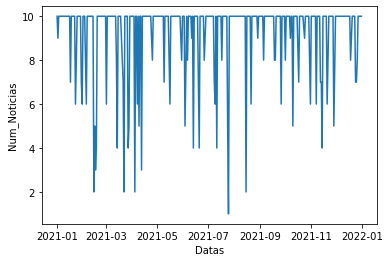

In [14]:
#Visualizando data vs quantidade de notícias
data_df.columns = ['Datas', 'Num_Noticias']
sns.lineplot(x = 'Datas', y = 'Num_Noticias', data = data_df)

In [15]:
# inserindo coluna de mês
data_df['Mes'] = data_df['Datas'].dt.month

# Calculando media de noticias por mês
df_noticia_mes = data_df.groupby('Mes').agg({'Num_Noticias':np.mean})
df_noticia_mes

,Num_Noticias
Mes,
1,9.44
2,8.89
3,8.67
4,9.00
5,9.64
6,9.19
7,8.88
8,9.54
9,9.64


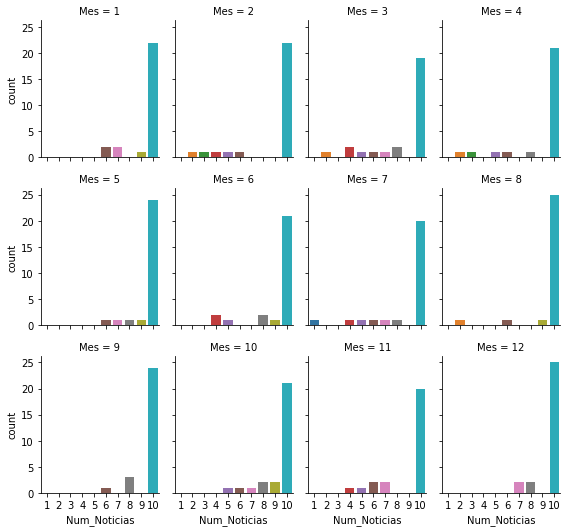

In [16]:
# Visualizando distribuição da quantidade de noticias ao longo dos meses
sns.catplot(x="Num_Noticias", col="Mes", col_wrap=4,
                data=data_df,
                kind="count", height=2.5, aspect=.8)

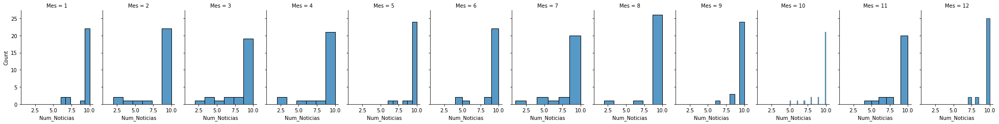

In [17]:
# Visualizando distribuição da quantidade de noticias ao longo dos meses
g = sns.FacetGrid(data_df, col="Mes", height=3.5, aspect=.65)
g.map(sns.histplot, "Num_Noticias")

Há poucas ocorrências de baixo numero de noticias por dia, a maior ocorrência da quantidade de noticias por dia é de 10.
Dessa forma, a média de noticias por mês varia de 8.6 á 9.65.

## 3.2 Há poucos dias sem noticias na base de dados

In [18]:
## Gerando uma lista com todos os dias de 2021:
start_date = '01/01/2021'
end_date = '31/12/2021'

#Transformando para o padrão inglês
start_date = datetime.strptime(start_date, '%d/%m/%Y').strftime('%m-%d-%Y')
end_date = datetime.strptime(end_date, '%d/%m/%Y').strftime('%m-%d-%Y')

#Gerando a lista com todas as datas
todas_datas = pd.date_range(start=start_date, end=end_date, freq = '1D')
todas_datas = [i.strftime("%d/%m/%Y") for i in todas_datas ]

In [19]:
#Gerando lista com todas as datas com noticias
datas_com_noticias = [i.strftime("%d/%m/%Y") for i in data_df['Datas'] ]

In [20]:
#Gerando lista com todas as datas sem noticias em 2021
datas_sem_noticias = [i for i in todas_datas if i not in datas_com_noticias]
print("Há %s dias sem notícias em 2021!" % len(datas_sem_noticias))

Há 38 dias sem notícias em 2021!


Em apenas 38 dias de 2021 não houve retorno de noticias diárias da Petrobras

## 3.3 Há dias em que o pregão da bolsa não funciona (Finais de Semana)

In [21]:
datas_com_pregao = [i.strftime("%d/%m/%Y") for i in df_petro['Date'] ]

In [22]:
datas_sem_pregao = [i for i in todas_datas if i not in datas_com_pregao]

In [23]:
print("Há %s dias sem pregão em 2021!" % len(datas_sem_pregao))

Há 118 dias sem pregão em 2021!


# 4.0 Pré-Processamento

## 4.1 Padronização das palavras contidas nos títulos das noticias para minúsculo

In [24]:
df.head()

,title,media,date,desc
0,A construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,2021-01-01,Dentre os principais pontos do plano estratégi...
1,"Refinaria Abreu e Lima da Petrobras, a RNEST p...",CPG Click Petroleo e Gas,2021-01-01,Petrobras informou em fato relevante na última...
2,5 Dicas de Tony Robbins para Ficar Rico Invest...,The Capital Advisor,2021-01-01,O QUE LER AGORA... ibovespa-sobe-021-apos-demi...
3,Acadêmicos de engenharia Mecânica criam projet...,CPG Click Petroleo e Gas,2021-01-01,Petrobras cancela a venda da fábrica de fertil...
4,Multinacional dinamarquesa European Energy faz...,CPG Click Petroleo e Gas,2021-01-01,Petrobras encerra sociedade com a Sete Brasil ...


In [25]:
df['title'] = df['title'].apply(lambda x: x.lower())
df.head()

,title,media,date,desc
0,a construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,2021-01-01,Dentre os principais pontos do plano estratégi...
1,"refinaria abreu e lima da petrobras, a rnest p...",CPG Click Petroleo e Gas,2021-01-01,Petrobras informou em fato relevante na última...
2,5 dicas de tony robbins para ficar rico invest...,The Capital Advisor,2021-01-01,O QUE LER AGORA... ibovespa-sobe-021-apos-demi...
3,acadêmicos de engenharia mecânica criam projet...,CPG Click Petroleo e Gas,2021-01-01,Petrobras cancela a venda da fábrica de fertil...
4,multinacional dinamarquesa european energy faz...,CPG Click Petroleo e Gas,2021-01-01,Petrobras encerra sociedade com a Sete Brasil ...


## 4.2 Exclusão noticias que não contenham a palavra chave "Petrobras" no título
Embora tenha-se configurado A biblioteca GoogleNews() para baixar noticias pela palavra chave "Petrobras" pode ocorrer casos em que o termo não é citado no título e nem no corpo da noticia.

In [26]:
df.iloc[2][0]

'5 dicas de tony robbins para ficar rico investindo'

In [27]:
df.iloc[2][3]

'O QUE LER AGORA... ibovespa-sobe-021-apos-demissao-na-petrobras-prio3-.  Notícias. Ibovespa Sobe +0...'

Essa noticia "5 dicas de tony robbins para ficar rico investindo", por exemplo, não possui relação com a petrobras no título e nem no corpo do artigo ao checar direto na fonte em <https://comoinvestir.thecap.com.br/5-dicas-de-tony-robbins-para-ficar-rico-investindo>. A biblioteca GoogleNews() retornou essa noticia, pois, na pagina HTML há noticias recomendadas ao leitor que possuem a palavra chave "petrobras".

Noticias sem a palavra chave "petrobras" no título serão excluidas do dataset

In [28]:
df['title'] = df['title'].apply(lambda x: "" if "petrobras" not in x else x)
df

,title,media,date,desc
0,a construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,2021-01-01,Dentre os principais pontos do plano estratégi...
1,"refinaria abreu e lima da petrobras, a rnest p...",CPG Click Petroleo e Gas,2021-01-01,Petrobras informou em fato relevante na última...
2,,The Capital Advisor,2021-01-01,O QUE LER AGORA... ibovespa-sobe-021-apos-demi...
3,,CPG Click Petroleo e Gas,2021-01-01,Petrobras cancela a venda da fábrica de fertil...
4,,CPG Click Petroleo e Gas,2021-01-01,Petrobras encerra sociedade com a Sete Brasil ...
...,...,...,...,...
3021,quer trabalhar na petrobras? falta menos de um...,JC Online,2021-12-31,O processo seletivo público que oferece 757 va...
3022,,CNN Brasil,2021-12-31,"Para ele, a solução desta pressão não deve pas..."
3023,,PetroNotícias,2021-12-31,Isso porque a Petrobrás anunciou que registrou...
3024,unigel assina contratos para suprimento das fá...,CPG Click Petroleo e Gas,2021-12-31,No dia 27 de dezembro a Unigel fechou contrato...


In [29]:
df = df[(df['title'] != "")]
df

,title,media,date,desc
0,a construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,2021-01-01,Dentre os principais pontos do plano estratégi...
1,"refinaria abreu e lima da petrobras, a rnest p...",CPG Click Petroleo e Gas,2021-01-01,Petrobras informou em fato relevante na última...
26,petrobras é condenada em arbitragem iniciada p...,Forbes Brasil,2021-04-01,A Petrobras disse que a sentença determinou qu...
27,petrobras fez provisionamento para indenizar iesa,Valor Econômico,2021-04-01,Petrobras fez provisionamento para indenizar I...
28,"petrobras é condenada, nos eua, a indenizar a ...",Money Times,2021-04-01,A Petrobras (PETR3; PETR4) foi condenada por u...
...,...,...,...,...
3018,aumento do preço do gás encanado: justiça inti...,FDR,2021-12-31,"Na última quinta-feira, 30, a Petrobras recebe..."
3019,presidente da petrobras diz que eleições não v...,Jovem Pan,2021-12-31,"Para 2022, Joaquim Silva e Luna entende que a ..."
3020,"petrobras conclui venda de ativos do rn, em me...",Saiba Mais,2021-12-31,Após os trabalhadores aprovarem estado de grev...
3021,quer trabalhar na petrobras? falta menos de um...,JC Online,2021-12-31,O processo seletivo público que oferece 757 va...


1494 noticias não relacionadas ao termo "Petrobras" em seus títulos foram foram excluidas do dataset

## 4.4 Adição de classe "Fechamento" ao dataframe de Ações
Classe 1: Fechamento em alta  
Classe 0: Fechamento em queda  

In [30]:
df_petro

,Date,Adj Close,Volume,Var%
0,2021-01-04,19.27,74719700,0.02
1,2021-01-05,20.03,95181100,0.04
2,2021-01-06,20.07,96562500,0.00
3,2021-01-07,20.67,56171300,0.03
4,2021-01-08,20.75,67136300,0.00
...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01
243,2021-12-27,23.58,44227900,0.01
244,2021-12-28,23.61,30688100,0.00
245,2021-12-29,23.41,35508400,-0.01


In [31]:
df_petro['Fechamento'] = df_petro['Var%'].apply(lambda x: 0 if x<0 else 1)
df_petro

,Date,Adj Close,Volume,Var%,Fechamento
0,2021-01-04,19.27,74719700,0.02,1
1,2021-01-05,20.03,95181100,0.04,1
2,2021-01-06,20.07,96562500,0.00,1
3,2021-01-07,20.67,56171300,0.03,1
4,2021-01-08,20.75,67136300,0.00,1
...,...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01,1
243,2021-12-27,23.58,44227900,0.01,1
244,2021-12-28,23.61,30688100,0.00,1
245,2021-12-29,23.41,35508400,-0.01,0


In [32]:
df_petro.Fechamento.value_counts()

1    131
0    116
Name: Fechamento, dtype: int64

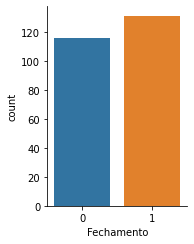

In [33]:
sns.catplot(x="Fechamento",
                data=df_petro,
                kind="count", height=3.5, aspect=.8)

Em 2021 houve 131 fechamentos com aumento nos valores de ações da Petrobras e 116 com fechamento em queda.

## 4.5 Concatenar noticias diárias

In [34]:
df_petro.head()

,Date,Adj Close,Volume,Var%,Fechamento
0,2021-01-04,19.27,74719700,0.02,1
1,2021-01-05,20.03,95181100,0.04,1
2,2021-01-06,20.07,96562500,0.00,1
3,2021-01-07,20.67,56171300,0.03,1
4,2021-01-08,20.75,67136300,0.00,1


In [35]:
df.head()

,title,media,date,desc
0,a construção naval brasileira tem chances de a...,CPG Click Petroleo e Gas,2021-01-01,Dentre os principais pontos do plano estratégi...
1,"refinaria abreu e lima da petrobras, a rnest p...",CPG Click Petroleo e Gas,2021-01-01,Petrobras informou em fato relevante na última...
26,petrobras é condenada em arbitragem iniciada p...,Forbes Brasil,2021-04-01,A Petrobras disse que a sentença determinou qu...
27,petrobras fez provisionamento para indenizar iesa,Valor Econômico,2021-04-01,Petrobras fez provisionamento para indenizar I...
28,"petrobras é condenada, nos eua, a indenizar a ...",Money Times,2021-04-01,A Petrobras (PETR3; PETR4) foi condenada por u...


In [36]:
lista_datas = []
lista_news = []

for i in df.date.unique():
    news = ""
    for row in df[(df['date']==i)].iterrows():
        news = news + " " + row[1][0]
    lista_news.append(news)
    lista_datas.append(i)

In [37]:
pd.set_option('display.max_rows', 50)

In [38]:
df_news_diaria = pd.DataFrame(list(zip(lista_datas,lista_news)),
               columns =['Date', 'Noticias'])
df_news_diaria.sort_values(by = 'Date', ascending = True, inplace = True)
df_news_diaria

,Date,Noticias
0,2021-01-01,a construção naval brasileira tem chances de ...
41,2021-01-03,petrobras reajusta preço da gasolina pela qui...
67,2021-01-04,tcu avalia barrar venda de refinaria da petro...
87,2021-01-05,petrobras (petr4) inicia contratação de nona ...
113,2021-01-06,valor de venda de refinaria da petrobras é qu...
...,...,...
294,2021-12-27,alerj vai à justiça contra a petrobras para b...
295,2021-12-28,distribuidoras de gás de 5 estados entram na ...
296,2021-12-29,petrobras vai recorrer de decisão que suspend...
297,2021-12-30,judicialização coloca mercado de gás em risco...


# 2 situações checar: 


1) Dias em que há pregão mas não há noticias, sendo que o dia anterior não tem pregão e tem noticias.  
2) Dias que há pregão e há noticias, sendo que no dia anterior não há pregão e há noticias.  

**Exemplo 1:** dia 29/11/2021 houve pregão mas não há noticias naquele dia, somente nos dias anteriores que nao houveram pregão e tiveram noticias 27/11/2021 e 28/11/2021.  
**Exemplo 2:** dia 18/01/2021 houve pregão e há noticias naquele dia, após concatenar as noticias do dia 18/01/2021 deverá incluir as noticias dos dias 16 e 17/01/2021 que não houve pregão;


In [39]:
## Itera sobre dias com pregao
for i in datas_com_pregao:
    
    ## Se o dia não tiver noticias retorna a data do dia anterior
    if i in datas_sem_noticias:
        dia_anterior = str(int(i[:2])-1) + i[2:10]
        
        # #Se o dia anterior não tiver pregão
        if dia_anterior in datas_sem_pregao:
                
            ## Se o dia anterior tiver noticias:
            if dia_anterior in datas_com_noticias:
                print(i)

29/11/2021


In [40]:
## 27/11/2021
noticia_dia_27 = df_news_diaria.iloc[267][1]
noticia_dia_27

' bolsonaro critica política de preços dos combustíveis da petrobras ibovespa: petrobras (petr4) e vale (vale3) têm maiores altas para itaú bba, pagamento de dividendos da petrobras (petr4) pode ser ainda maior usina termelétrica de camaçari: um dos principais investimentos da petrobras na bahia, foi arrendado ontem (26/11) para a petroquímica proquigel empreiteira de perfuração offshore seadrill conquista contratos de us$ 549 milhões com a petrobras, no campo de búzios'

In [41]:
## 28/11/2021
noticia_dia_28 = df_news_diaria.iloc[268][1]
noticia_dia_28

' por que a privatização da petrobras não é garantia de ... petrobras e mubadala assinam transferência final da rlam nos próximos dias petrobras deve começar a vender fatia na braskem no primeiro trimestre'

In [42]:
## 29/11/2021 -- NÂO EXISTE NOTICIA
noticia_dia_29 = ""

In [43]:
## 16/01/2021
noticia_dia_16 = df_news_diaria.iloc[11][1]
noticia_dia_16

' mais de 100 vagas de emprego no setor de petróleo e gás! ocyan inicia cadastro de currículo para contratos de manutenção da petrobras'

In [44]:
## 17/01/2021
noticia_dia_17 = df_news_diaria.iloc[12][1]
noticia_dia_17

' petrobras quer mudar gestão de plano de saúde'

In [45]:
## 18/01/2021
noticia_dia_18 = df_news_diaria.iloc[13][1]
noticia_dia_18

' a petrobras está represando preços de combustíveis? dados indicam que sim, mas analistas não veem motivo para pânico (ainda) petrobras anuncia aumento de mais de 8% na gasolina a partir desta terça-feira litro da gasolina sobe r$ 0,15 nas refinarias da petrobras petrobras avança na venda do maior campo de petróleo em ... ação da petrobras fecha em queda de 0,18% nesta segunda; veja valores petrobras (petr4) aprova abertura de novo plano de ... petrobras recebe em 15 dias propostas para construção de 2 plataformas no rio'

## 4.6 Concatenar noticias referentes a datas sem pregões.

- O próximo dia útil após o periodo sem pregões deverá consolidar as noticias acumuladas dos dias sem pregões.
- O dataset final deverá conter apenas as datas em que ocorreu o pregão

Dessa forma, iniciaremos o procedimento, concatenando as noticias de dias que não houveram pregões

In [46]:
## Iterar sobre as datas dos pregões (iniciando pelo segundo dia do pregão de 2021 df_petro.Date.iloc[1:])

## Calcular delta (diferença entre dias entre dois registros seguidos de pregões):
import datetime

df_news_sem_pregao = pd.DataFrame()
timedelta_1dia = datetime.timedelta(days=1)

lista_datas = []
lista_noticias_sem_pregao = []

for i, data in enumerate(df_petro.Date.iloc[1:]):
    data_anterior = df_petro['Date'].iloc[i]  
    delta = data - data_anterior

    
    # Se houver mais de 1 dia sem pregão:    
    if delta > timedelta_1dia:
            
            
        # Filtra as noticias entre as datas sem pregão:
        df_aux = df_news_diaria[ (df_news_diaria['Date']> data_anterior) & (df_news_diaria['Date']<= data)  ]
        
        ## Concatena as noticias das datas sem pregão
        news = ""
        for row in df_aux.iterrows():
            news = news + " " + row[1][1]


        ## Armazena as noticias e data do ultimo pregão valido em listas
        lista_noticias_sem_pregao.append(news)
        lista_datas.append(data)
        
        #Cria um dataframe auxiliar com a data do ultimo pregão e as noticias concatenadas dos dias sem pregões:
        df_aux2 = pd.DataFrame(list(zip(lista_datas,lista_noticias_sem_pregao)),
               columns =['Date', 'Noticias'])
    
        # Gera o dataframe com as noticias sem pregões + datas do ultimo pregão valido.
        df_news_sem_pregao = df_news_sem_pregao.append(df_aux2, ignore_index = True)
        
        #Resetando as listas para geração de novo DF
        lista_noticias_sem_pregao = []
        lista_datas = []
        
df_news_sem_pregao

,Date,Noticias
0,2021-01-11,silva e luna 'militariza' cúpula da petrobra...
1,2021-01-18,mais de 100 vagas de emprego no setor de pet...
2,2021-01-26,petrobras encerra 2020 com quadro de funcion...
3,2021-02-01,
4,2021-02-08,petrobras mira emissão no mercado internacio...
...,...,...
51,2021-11-29,bolsonaro critica política de preços dos com...
52,2021-12-06,petrobras aumenta exportação de óleo pelo po...
53,2021-12-13,petrobras fecha venda da six por 33 milhões ...
54,2021-12-20,petrobras abre o 1º concurso em 3 anos com s...


Obs: Note que nos dias 04/06/2021 e 01/02/2021 houveram pregão mas não houveram noticias referente a esses dias nem os dias que os precederam.
    
    # Situação OK!

# Checagem situação de 29/11/2021

In [47]:
noticias_concatenadas = " " + noticia_dia_27 + " " + noticia_dia_28 + " " + noticia_dia_29
noticias_concatenadas

'  bolsonaro critica política de preços dos combustíveis da petrobras ibovespa: petrobras (petr4) e vale (vale3) têm maiores altas para itaú bba, pagamento de dividendos da petrobras (petr4) pode ser ainda maior usina termelétrica de camaçari: um dos principais investimentos da petrobras na bahia, foi arrendado ontem (26/11) para a petroquímica proquigel empreiteira de perfuração offshore seadrill conquista contratos de us$ 549 milhões com a petrobras, no campo de búzios  por que a privatização da petrobras não é garantia de ... petrobras e mubadala assinam transferência final da rlam nos próximos dias petrobras deve começar a vender fatia na braskem no primeiro trimestre '

In [48]:
df_news_sem_pregao.iloc[51][1] + " "


'  bolsonaro critica política de preços dos combustíveis da petrobras ibovespa: petrobras (petr4) e vale (vale3) têm maiores altas para itaú bba, pagamento de dividendos da petrobras (petr4) pode ser ainda maior usina termelétrica de camaçari: um dos principais investimentos da petrobras na bahia, foi arrendado ontem (26/11) para a petroquímica proquigel empreiteira de perfuração offshore seadrill conquista contratos de us$ 549 milhões com a petrobras, no campo de búzios  por que a privatização da petrobras não é garantia de ... petrobras e mubadala assinam transferência final da rlam nos próximos dias petrobras deve começar a vender fatia na braskem no primeiro trimestre '

Codigo OK as noticias são iguais! 

# Checagem situação de 18/01/2021

In [49]:
noticias_concatenadas = " " + noticia_dia_16 + " " + noticia_dia_17 + " " + noticia_dia_18
noticias_concatenadas

'  mais de 100 vagas de emprego no setor de petróleo e gás! ocyan inicia cadastro de currículo para contratos de manutenção da petrobras  petrobras quer mudar gestão de plano de saúde  a petrobras está represando preços de combustíveis? dados indicam que sim, mas analistas não veem motivo para pânico (ainda) petrobras anuncia aumento de mais de 8% na gasolina a partir desta terça-feira litro da gasolina sobe r$ 0,15 nas refinarias da petrobras petrobras avança na venda do maior campo de petróleo em ... ação da petrobras fecha em queda de 0,18% nesta segunda; veja valores petrobras (petr4) aprova abertura de novo plano de ... petrobras recebe em 15 dias propostas para construção de 2 plataformas no rio'

In [50]:
df_news_sem_pregao.iloc[1][1] 

'  mais de 100 vagas de emprego no setor de petróleo e gás! ocyan inicia cadastro de currículo para contratos de manutenção da petrobras  petrobras quer mudar gestão de plano de saúde  a petrobras está represando preços de combustíveis? dados indicam que sim, mas analistas não veem motivo para pânico (ainda) petrobras anuncia aumento de mais de 8% na gasolina a partir desta terça-feira litro da gasolina sobe r$ 0,15 nas refinarias da petrobras petrobras avança na venda do maior campo de petróleo em ... ação da petrobras fecha em queda de 0,18% nesta segunda; veja valores petrobras (petr4) aprova abertura de novo plano de ... petrobras recebe em 15 dias propostas para construção de 2 plataformas no rio'

Codigo OK as noticias são iguais! 

## 4.7 Atualiza as noticias concatenadas no df_news_diaria:

In [51]:
df_news_diaria_atualizada = df_news_diaria.copy()

# itera sobre os dias com pregão cujo noticias de dias anteriores foram concatenadas:
for data in df_news_sem_pregao.Date.unique():
    
    #Filtra pelo dia com pregão que teve noticias concatenada
    df_noticia_dias_sem_pregao = df_news_sem_pregao[(df_news_sem_pregao['Date']==data)]


    #Checa se há registro referente a data no df de noticias
    df_check_noticias = df_news_diaria_atualizada[(df_news_diaria_atualizada['Date']==data)]
    
    # Se não houver registros referente á data então o registro deverá ser criado no df de noticias:
    # Se houver, então o registro será atualizado no df de noticias
    
    if len(df_check_noticias) > 0:
        
        #Substitui os registros
        df_news_diaria_atualizada = df_news_diaria_atualizada.replace ((df_news_diaria_atualizada.loc[df_news_diaria_atualizada['Date'].isin(df_noticia_dias_sem_pregao['Date'])])['Noticias'].values, df_noticia_dias_sem_pregao['Noticias'].values)
        
    else:
        #Insere o novo registro
        df_news_diaria_atualizada = df_news_diaria_atualizada.append(df_noticia_dias_sem_pregao, ignore_index = True)

In [52]:
len(df_news_diaria), len(df_news_diaria_atualizada)

(299, 306)

## 4.8 Mesclando o dataframe noticias finais e ações

In [53]:
df_final = pd.merge(left = df_petro, right = df_news_diaria_atualizada, how = 'left', on = 'Date')
df_final.head(10)

,Date,Adj Close,Volume,Var%,Fechamento,Noticias
0,2021-01-04,19.27,74719700,0.02,1,tcu avalia barrar venda de refinaria da petro...
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) inicia contratação de nona ...
2,2021-01-06,20.07,96562500,0.00,1,valor de venda de refinaria da petrobras é qu...
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirma venda da fatia na br distr...
4,2021-01-08,20.75,67136300,0.00,1,NaN
5,2021-01-11,20.57,48744700,-0.01,0,silva e luna 'militariza' cúpula da petrobra...
6,2021-01-12,20.42,65691900,-0.01,0,árabes assumem nesta quarta primeira refinari...
7,2021-01-13,19.43,93826600,-0.05,0,petrobras é a segunda maior do mundo em opera...
8,2021-01-14,19.63,50745400,0.01,1,NaN
9,2021-01-15,18.75,80673300,-0.05,0,NaN


In [54]:
df_news_diaria_atualizada.head(12)

,Date,Noticias
0,2021-01-01,a construção naval brasileira tem chances de ...
1,2021-01-03,petrobras reajusta preço da gasolina pela qui...
2,2021-01-04,tcu avalia barrar venda de refinaria da petro...
3,2021-01-05,petrobras (petr4) inicia contratação de nona ...
4,2021-01-06,valor de venda de refinaria da petrobras é qu...
5,2021-01-07,petrobras confirma venda da fatia na br distr...
6,2021-01-09,silva e luna 'militariza' cúpula da petrobras...
7,2021-01-10,bolsonaro sugere usar dividendos da petrobras...
8,2021-01-11,silva e luna 'militariza' cúpula da petrobra...
9,2021-01-12,árabes assumem nesta quarta primeira refinari...


In [55]:
df_final[(df_final['Noticias'].isnull())].Date, len(df_final[(df_final['Noticias'].isnull())].Date)

(4     2021-01-08
 8     2021-01-14
 9     2021-01-15
 13    2021-01-21
 16    2021-01-27
 22    2021-02-04
 40    2021-03-04
 41    2021-03-05
 43    2021-03-09
 51    2021-03-19
 63    2021-04-07
 68    2021-04-14
 72    2021-04-20
 83    2021-05-06
 87    2021-05-12
 117   2021-06-24
 122   2021-07-01
 134   2021-07-20
 136   2021-07-22
 140   2021-07-28
 142   2021-07-30
 146   2021-08-05
 147   2021-08-06
 152   2021-08-13
 170   2021-09-09
 171   2021-09-10
 208   2021-11-04
 220   2021-11-23
 Name: Date, dtype: datetime64[ns],
 28)

No total houveram 28 registros de pregões sem atribuição de noticias.

Para esses registros observou-se que:  

**1) Não houveram noticias na respectiva data e/ou**  
**2) Considerando as datas sem pregões que antecederam a data do pregão também não houveram noticias.**  

In [56]:
len(df_final), len(df_final[(df_final['Noticias'].isnull())].Date)

(247, 28)

## 4.9 Exclusão dias com pregões sem noticias

In [57]:
df_final = df_final.dropna()

In [58]:
len(df_final)

219

# 5.0 NLP

Será realizado o levantamento das palavras mais frequentes em notícias para inputação de polaridade no dicionário SentilexPT caso não existam ainda.

# 5.1 SentilexPT: Inputação de polaridade de novos termos ao dicionário SentilexPT

In [59]:
sentilexpt = open('SentiLex-lem-PT01.txt','r')

Criando um dicionário com polaridades

In [60]:
dic_palavra_polaridade = {}
for i in sentilexpt.readlines():
    pos_ponto = i.find('.')            # obtem a posiçãodo caracter ponto
    palavra = (i[:pos_ponto])          # Pega a palavra
    pol_pos = i.find('POL')            # obtem a posição do inicio da string POL
    polaridade = (i[pol_pos+4:pol_pos+6]).replace(';','')         # obtem a polaridade da palavra
    dic_palavra_polaridade[palavra] = polaridade                  # atualiza o dicionario com a palavra a polaridade

In [61]:
print (dic_palavra_polaridade.get('legal'))

1


In [62]:
print (dic_palavra_polaridade.get('chato'))

-1


In [63]:
def Score_sentimento(frase):
    frase = frase.lower()                     # coloca toda a frase em minusculo
    l_sentimento = []                         # cria uma lista vazia
    for p in frase.split():
        l_sentimento.append(int(dic_palavra_polaridade.get(p, 0)))      # para cada palavra obtem a polaridade
    #print (l_sentimento)                                                # imprime a lista de polaridades
    score = sum(l_sentimento)                                           # soma todos os valores da lista
    #if score > 0:
        #return 'Positivo, Score:{}'.format(score)                       # se maior que 0 retorna 'positivo'
    #elif score == 0:
        #return 'Neutro, Score:{}'.format(score)                         # se igual a 0 retorna 'neutro'
    #else:
        #return 'Negativo, Score:{}'.format(score)                       # se menor que 0 retorna 'negativo'
        
    return score

In [64]:
def sentimento(score):
    if score > 0:
        return 'Positivo'                      # se maior que 0 retorna 'positivo'
    elif score == 0:
        return 'Neutro'                     # se igual a 0 retorna 'neutro'
    else:
        return 'Negativo'                     # se menor que 0 retorna 'negativo'
        
    return score

In [65]:
testescore = Score_sentimento("DescaRadO e feIo")
testescore

-2

In [66]:
sentimento(testescore)

'Negativo'

In [67]:
df_final2 = df_final.copy()

In [68]:
df_final2['score'] = df_final2['Noticias'].apply(lambda x: Score_sentimento(x))
df_final2['Sentimento'] = df_final2['score'].apply(lambda x: sentimento(x))
df_final2

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu avalia barrar venda de refinaria da petro...,-1,Negativo
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) inicia contratação de nona ...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,valor de venda de refinaria da petrobras é qu...,-1,Negativo
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirma venda da fatia na br distr...,0,Neutro
5,2021-01-11,20.57,48744700,-0.01,0,silva e luna 'militariza' cúpula da petrobra...,0,Neutro
...,...,...,...,...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01,1,programa da petrobras que reforça capital de ...,-1,Negativo
243,2021-12-27,23.58,44227900,0.01,1,"petrobras vende carmópolis por us$ 1,1 bilhã...",3,Positivo
244,2021-12-28,23.61,30688100,0.00,1,distribuidoras de gás de 5 estados entram na ...,0,Neutro
245,2021-12-29,23.41,35508400,-0.01,0,petrobras vai recorrer de decisão que suspend...,3,Positivo


## Criando novo DF com etapas de stopwords e lemmatization:

In [103]:
import nltk
nltk.download('stopwords')
nltk.download('rslp')

[nltk_data] Downloading package stopwords to C:\Users\HP ZBook
[nltk_data]     15\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package rslp to C:\Users\HP ZBook
[nltk_data]     15\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping stemmers\rslp.zip.


True

In [104]:
def RemoveStopWords(instancia):
    stopwords = set(nltk.corpus.stopwords.words('portuguese'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [105]:
def Stemming(instancia):
    stemmer = nltk.stem.RSLPStemmer()
    palavras = []
    for w in instancia.split():
        palavras.append(stemmer.stem(w))
    return (" ".join(palavras))

In [107]:
def Preprocessing_pt(instancia):
    stemmer = nltk.stem.RSLPStemmer()
    stopwords = set(nltk.corpus.stopwords.words('portuguese'))
    palavras = [stemmer.stem(i) for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))


In [117]:
def Preprocessing_en(instancia):
    stemmer = nltk.stem.RSLPStemmer()
    stopwords = set(nltk.corpus.stopwords.words('english'))
    palavras = [stemmer.stem(i) for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [106]:
df_final2_tratado = df_final2.copy()

In [112]:
df_final2_tratado['Noticias'] = df_final2_tratado['Noticias'].apply(lambda x: Preprocessing_pt(x))

In [113]:
df_final2_tratado['score'] = df_final2_tratado['Noticias'].apply(lambda x: Score_sentimento(x))
df_final2_tratado['Sentimento'] = df_final2_tratado['score'].apply(lambda x: sentimento(x))
df_final2_tratado.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu aval barr vend refin petrobr fund árab ven...,0,Neutro
1,2021-01-05,20.03,95181100,0.04,1,petrobr (petr4) inic contrat non unidad camp b...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,val vend refin petrobr question ... rad traz v...,1,Positivo
3,2021-01-07,20.67,56171300,0.03,1,petrobr confirm vend fat br distribu embol r$ ...,0,Neutro
5,2021-01-11,20.57,48744700,-0.01,0,silv lun 'militariza' cúpul petrobr petrobr co...,0,Neutro


# 5.2 Tradução e aplicação textblob e vader sentiment

### Instanciando função de tradução

In [69]:
#pip install googletrans==4.0.0-rcl

In [70]:
from googletrans import Translator

In [71]:
trans = Translator()

In [72]:
trans.translate("The book is on the table", dest = 'pt').text

'O livro está sobre a mesa'

In [73]:
def traduzir(frase):
    frase = frase.lower()                     # coloca toda a frase em minusculo
    frase = trans.translate(frase, dest = 'en').text
    return frase

In [74]:
frase_teste = traduzir("A comida está muito boa")
frase_teste

'the food is very good'

### Instanciando calculo de polaridade e subjetividade

In [75]:
#pip install textblob
from textblob import TextBlob

In [76]:
text_blob = TextBlob(frase_teste)
polaridade = text_blob.polarity
subjetividade = text_blob.subjectivity

polaridade, subjetividade

(0.9099999999999999, 0.7800000000000001)

In [77]:
def polaridade(frase):
    frase = frase.lower()                     # coloca toda a frase em minusculo
    text_blob = TextBlob(frase)
    polaridade = text_blob.polarity
    return polaridade

def subjetividade(frase):
    frase = frase.lower()                     # coloca toda a frase em minusculo
    text_blob = TextBlob(frase)
    subjetividade = text_blob.subjectivity
    return subjetividade

### Instanciando calculo de sentimento

In [78]:
#pip install vaderSentiment

In [79]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [80]:
s_analyze = SentimentIntensityAnalyzer()
sentiment= s_analyze.polarity_scores(frase_teste)

In [81]:
sentiment

{'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.4927}

In [82]:
type(sentiment)
sentiment.get('neu')

0.556

In [83]:
def negatividade(frase):
    frase = frase.lower()                   # coloca toda a frase em minusculo
    s_analyze = SentimentIntensityAnalyzer()
    sentiment= s_analyze.polarity_scores(frase)                 
    sentimento = sentiment.get('neg')
    return sentimento

def neutralidade(frase):
    frase = frase.lower()                   # coloca toda a frase em minusculo
    s_analyze = SentimentIntensityAnalyzer()
    sentiment= s_analyze.polarity_scores(frase)                 
    sentimento = sentiment.get('neu')
    return sentimento

def positividade(frase):
    frase = frase.lower()                   # coloca toda a frase em minusculo
    s_analyze = SentimentIntensityAnalyzer()
    sentiment= s_analyze.polarity_scores(frase)                 
    sentimento = sentiment.get('pos')
    return sentimento

def composicao(frase):
    frase = frase.lower()                   # coloca toda a frase em minusculo
    s_analyze = SentimentIntensityAnalyzer()
    sentiment= s_analyze.polarity_scores(frase)                 
    sentimento = sentiment.get('compound')
    return sentimento

In [84]:
df_final3 = df_final.copy()

In [85]:
df_final3['Noticias'] = df_final3['Noticias'].apply(lambda x: traduzir(x))

In [86]:
df_final3['polaridade'] = df_final3['Noticias'].apply(lambda x: polaridade(x))
df_final3['subjetividade'] = df_final3['Noticias'].apply(lambda x: subjetividade(x))
df_final3['negatividade'] = df_final3['Noticias'].apply(lambda x: negatividade(x))
df_final3['neutralidade'] = df_final3['Noticias'].apply(lambda x: neutralidade(x))
df_final3['positividade'] = df_final3['Noticias'].apply(lambda x: positividade(x))
df_final3['composicao'] = df_final3['Noticias'].apply(lambda x: composicao(x))
df_final3

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74
5,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45
...,...,...,...,...,...,...,...,...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.37,0.43,0.00,0.92,0.08,0.60
243,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.26,0.40,0.05,0.88,0.07,0.54
244,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.47,0.57,0.03,0.91,0.07,0.59
245,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.12,0.33,0.03,0.83,0.13,0.88


## Criando novo DF com etapas de stopwords e lemmatization:

In [116]:
df_final3_tratado = df_final.copy()
df_final3_tratado['Noticias'] = df_final3['Noticias']

In [118]:
df_final3_tratado['Noticias'] = df_final3_tratado['Noticias'].apply(lambda x: Preprocessing_en(x))
df_final3_tratado.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluat barring sal petrobr refinery arab ...
1,2021-01-05,20.03,95181100,0.04,1,petrobr (petr4) start contracting ninth unit b...
2,2021-01-06,20.07,96562500,0.00,1,valu sal petrobr refinery questioned ... rad b...
3,2021-01-07,20.67,56171300,0.03,1,petrobr confirm sal stak br distribu pocket r$...
5,2021-01-11,20.57,48744700,-0.01,0,silv lun 'militariza' petrobr dom petrobr comp...


In [119]:
df_final3_tratado['polaridade'] = df_final3_tratado['Noticias'].apply(lambda x: polaridade(x))
df_final3_tratado['subjetividade'] = df_final3_tratado['Noticias'].apply(lambda x: subjetividade(x))
df_final3_tratado['negatividade'] = df_final3_tratado['Noticias'].apply(lambda x: negatividade(x))
df_final3_tratado['neutralidade'] = df_final3_tratado['Noticias'].apply(lambda x: neutralidade(x))
df_final3_tratado['positividade'] = df_final3_tratado['Noticias'].apply(lambda x: positividade(x))
df_final3_tratado['composicao'] = df_final3_tratado['Noticias'].apply(lambda x: composicao(x))
df_final3_tratado.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluat barring sal petrobr refinery arab ...,0.00,0.00,0.22,0.78,0.00,-0.78
1,2021-01-05,20.03,95181100,0.04,1,petrobr (petr4) start contracting ninth unit b...,0.00,0.00,0.00,1.00,0.00,0.00
2,2021-01-06,20.07,96562500,0.00,1,valu sal petrobr refinery questioned ... rad b...,0.22,0.58,0.09,0.85,0.06,-0.25
3,2021-01-07,20.67,56171300,0.03,1,petrobr confirm sal stak br distribu pocket r$...,0.35,0.30,0.04,0.92,0.04,0.15
5,2021-01-11,20.57,48744700,-0.01,0,silv lun 'militariza' petrobr dom petrobr comp...,0.29,0.49,0.02,0.91,0.07,0.69


# 5.3 Tradução e aplicação do modelo pré-treinado de Roberta
https://www.kaggle.com/code/robikscube/sentiment-analysis-python-youtube-tutorial/notebook

In [87]:
#pip install –upgrade pip

In [88]:
#pip install tensorflow

In [89]:
#pip install transformers

In [90]:
#pip install torch

In [91]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [92]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [93]:
example = "This oatmeal is not good. Its mushy, soft, I don't like it. Quaker Oats is the way to go."

In [94]:
def neg_rob(frase):
    #trunca a frase para 514 caracteres (máximo suportado pelo modelo de Roberta)
    frase = frase[:514]
    
    encoded_text = tokenizer(frase, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)

    neg_roberta = scores[0]
   # neu_roberta = scores[1]
   # pos_roberta = scores[2]
    return neg_roberta

def neu_rob(frase):
    #trunca a frase para 514 caracteres (máximo suportado pelo modelo de Roberta)
    frase = frase[:514]
    
    encoded_text = tokenizer(frase, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)

    #neg_roberta = scores[0]
    neu_roberta = scores[1]
    #pos_roberta = scores[2]
    return neu_roberta

def pos_rob(frase):
    #trunca a frase para 514 caracteres (máximo suportado pelo modelo de Roberta)
    frase = frase[:514]
    
    encoded_text = tokenizer(frase, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)

    #neg_roberta = scores[0]
    #neu_roberta = scores[1]
    pos_roberta = scores[2]
    return pos_roberta
    

In [95]:
df_final4 = df_final.copy()

In [96]:
#df_final4['Noticias'] = df_final4['Noticias'].apply(lambda x: traduzir(x))

In [97]:
df_final4['Noticias'] = df_final3['Noticias']
df_final4.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...
5,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...


In [98]:
df_final4['neg_rob'] = df_final4['Noticias'].apply(lambda x: neg_rob(x))
df_final4['neu_rob'] = df_final4['Noticias'].apply(lambda x: neu_rob(x))
df_final4['pos_rob'] = df_final4['Noticias'].apply(lambda x: pos_rob(x))
df_final4

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,neg_rob,neu_rob,pos_rob
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.62,0.37,0.01
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.17,0.80,0.02
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.56,0.42,0.02
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.06,0.86,0.08
5,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.35,0.62,0.03
...,...,...,...,...,...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.01,0.66,0.33
243,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.38,0.56,0.06
244,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.14,0.83,0.03
245,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.06,0.84,0.10


## Criando novo DF com etapas de stopwords e lemmatization

In [120]:
df_final4_tratado = df_final.copy()
df_final4_tratado['Noticias'] = df_final4['Noticias']

In [121]:
df_final4_tratado['Noticias'] = df_final4_tratado['Noticias'].apply(lambda x: Preprocessing_en(x))
df_final4_tratado.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluat barring sal petrobr refinery arab ...
1,2021-01-05,20.03,95181100,0.04,1,petrobr (petr4) start contracting ninth unit b...
2,2021-01-06,20.07,96562500,0.00,1,valu sal petrobr refinery questioned ... rad b...
3,2021-01-07,20.67,56171300,0.03,1,petrobr confirm sal stak br distribu pocket r$...
5,2021-01-11,20.57,48744700,-0.01,0,silv lun 'militariza' petrobr dom petrobr comp...


In [122]:
df_final4_tratado['neg_rob'] = df_final4_tratado['Noticias'].apply(lambda x: neg_rob(x))
df_final4_tratado['neu_rob'] = df_final4_tratado['Noticias'].apply(lambda x: neu_rob(x))
df_final4_tratado['pos_rob'] = df_final4_tratado['Noticias'].apply(lambda x: pos_rob(x))
df_final4_tratado

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,neg_rob,neu_rob,pos_rob
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluat barring sal petrobr refinery arab ...,0.41,0.58,0.01
1,2021-01-05,20.03,95181100,0.04,1,petrobr (petr4) start contracting ninth unit b...,0.08,0.89,0.03
2,2021-01-06,20.07,96562500,0.00,1,valu sal petrobr refinery questioned ... rad b...,0.10,0.85,0.04
3,2021-01-07,20.67,56171300,0.03,1,petrobr confirm sal stak br distribu pocket r$...,0.05,0.87,0.08
5,2021-01-11,20.57,48744700,-0.01,0,silv lun 'militariza' petrobr dom petrobr comp...,0.12,0.85,0.03
...,...,...,...,...,...,...,...,...,...
242,2021-12-23,23.24,28713600,0.01,1,petrobr progr reinforc working capit suppli re...,0.04,0.89,0.07
243,2021-12-27,23.58,44227900,0.01,1,petrobr sell carmópolil us$ 1.1 billion petrob...,0.08,0.79,0.13
244,2021-12-28,23.61,30688100,0.00,1,ga distribu 5 stat go court petrobr rio readju...,0.05,0.90,0.04
245,2021-12-29,23.41,35508400,-0.01,0,petrobr appe decision suspend ga increas rio j...,0.18,0.77,0.04


# 6.0 Machine Learning: Testes inicias com seleção de features e classificação com algorítmos ingênuos.

## 6.1 SentilexPT

In [123]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier


In [124]:
X = df_final2.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias','Sentimento'])
y = df_final2['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [125]:
X_train

,score
206,0
243,3
229,0
1,0
137,0
...,...
231,2
210,-1
244,0
241,0


In [126]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 14.11it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
QuadraticDiscriminantAnalysis      0.61               0.59     0.59      0.58   
GaussianNB                         0.61               0.59     0.59      0.58   
LinearSVC                          0.59               0.58     0.58      0.56   
LinearDiscriminantAnalysis         0.59               0.58     0.58      0.56   
SGDClassifier                      0.59               0.58     0.58      0.56   
RidgeClassifierCV                  0.59               0.58     0.58      0.56   
RidgeClassifier                    0.59               0.58     0.58      0.56   
Perceptron                         0.59               0.58     0.58      0.56   
PassiveAggressiveClassifier        0.59               0.58     0.58      0.56   
NearestCentroid             

A acurácia dos top 5 algorítmos variou de 65% á 59%
- DummyClassifier
- QuadraticDiscriminantAnalysis      
- GaussianNB  
- LinearSVC    
- LinearDiscriminantAnalysis

## 6.1.2 SentilexPT com noticias tratadas

In [127]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

X = df_final2_tratado.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias','Sentimento'])
y = df_final2_tratado['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.47it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
LGBMClassifier                     0.53               0.50     0.50      0.37   
NuSVC                              0.53               0.50     0.50      0.37   
LogisticRegression                 0.50               0.47     0.47      0.35   
XGBClassifier                      0.50               0.47     0.47      0.35   
SVC                                0.50               0.47     0.47      0.35   
SGDClassifier                      0.50               0.47     0.47      0.35   
RidgeClassifierCV                  0.50               0.47     0.47      0.35   
RidgeClassifier                    0.50               0.47     0.47      0.35   
RandomForestClassifier             0.50               0.47     0.47      0.35   
QuadraticDiscriminantAnalysi

Sem os dados tratados (stopwods e lemmatization) o algorítmo performou melhor

## 6.2 Tradução + Vader Sentiment

In [103]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

In [104]:
X = df_final3.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias'])
y = df_final3['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [105]:
X_train

,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao
206,0.21,0.28,0.15,0.75,0.10,-0.38
243,0.26,0.40,0.05,0.88,0.07,0.54
229,0.25,0.25,0.02,0.91,0.07,0.48
1,0.00,0.00,0.00,1.00,0.00,0.00
137,0.50,0.50,0.05,0.88,0.07,0.20
...,...,...,...,...,...,...
231,0.06,0.50,0.00,0.95,0.05,0.32
210,0.10,0.14,0.01,0.92,0.07,0.85
244,0.47,0.57,0.03,0.91,0.07,0.59
241,0.25,0.55,0.00,0.88,0.12,0.82


In [106]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.88it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
LinearSVC                          0.64               0.63     0.63      0.64   
RidgeClassifierCV                  0.64               0.63     0.63      0.64   
LinearDiscriminantAnalysis         0.64               0.63     0.63      0.64   
RidgeClassifier                    0.64               0.63     0.63      0.64   
LogisticRegression                 0.64               0.63     0.63      0.64   
SVC                                0.62               0.62     0.62      0.62   
XGBClassifier                      0.61               0.61     0.61      0.60   
BernoulliNB                        0.61               0.61     0.61      0.61   
CalibratedClassifierCV             0.61               0.60     0.60      0.60   
ExtraTreeClassifier         

A acurácia dos top 5 algorítmos variou de 65% á 64%
- DummyClassifier
- XGBClassifier                           
- LinearSVC                             
- LogisticRegression                     
- RidgeClassifier                    

## 6.2.1 Tradução + Vader Sentiment com dados tratados

In [128]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

X = df_final3_tratado.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias'])
y = df_final3_tratado['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.30it/s]


                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
KNeighborsClassifier               0.53               0.53     0.53      0.53   
SGDClassifier                      0.53               0.52     0.52      0.52   
LinearSVC                          0.52               0.52     0.52      0.51   
RidgeClassifierCV                  0.52               0.52     0.52      0.51   
RidgeClassifier                    0.52               0.52     0.52      0.51   
LinearDiscriminantAnalysis         0.52               0.52     0.52      0.51   
LogisticRegression                 0.52               0.52     0.52      0.51   
NuSVC                              0.52               0.51     0.51      0.51   
Perceptron                         0.52               0.51     0.51      0.51   
NearestCentroid             

Sem os dados tratados (stopwods e lemmatization) o algorítmo performou melhor

## 6.3 Modelo pré-treinado de Roberta

In [107]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

In [108]:
X = df_final4.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias'])
y = df_final4['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [109]:
X_train

,neg_rob,neu_rob,pos_rob
206,0.46,0.51,0.04
243,0.38,0.56,0.06
229,0.04,0.81,0.15
1,0.17,0.80,0.02
137,0.51,0.46,0.03
...,...,...,...
231,0.39,0.59,0.02
210,0.03,0.76,0.22
244,0.14,0.83,0.03
241,0.03,0.87,0.10


In [110]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.07it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
Perceptron                         0.56               0.57     0.57      0.56   
SGDClassifier                      0.55               0.56     0.56      0.52   
NuSVC                              0.55               0.55     0.55      0.55   
PassiveAggressiveClassifier        0.56               0.53     0.53      0.45   
BernoulliNB                        0.53               0.53     0.53      0.53   
LinearSVC                          0.53               0.53     0.53      0.53   
RidgeClassifier                    0.53               0.53     0.53      0.53   
QuadraticDiscriminantAnalysis      0.52               0.52     0.52      0.50   
KNeighborsClassifier               0.52               0.52     0.52      0.52   
NearestCentroid             

A acurácia dos top 5 algorítmos variou de 65% á 52%
- DummyClassifier                    
- Perceptron                                                    
- SGDClassifier                                                   
- BernoulliNB                                             
- NearestCentroid                        

# 6.3.2 Modelo pré-treinado de Roberta com dados tratados

In [129]:
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

X = df_final4_tratado.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias'])
y = df_final4_tratado['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.91it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
CalibratedClassifierCV             0.64               0.62     0.62      0.59   
SGDClassifier                      0.52               0.54     0.54      0.39   
BernoulliNB                        0.53               0.52     0.52      0.53   
QuadraticDiscriminantAnalysis      0.50               0.52     0.52      0.46   
RidgeClassifierCV                  0.53               0.52     0.52      0.50   
LogisticRegression                 0.53               0.52     0.52      0.50   
LinearDiscriminantAnalysis         0.53               0.52     0.52      0.50   
RidgeClassifier                    0.53               0.52     0.52      0.50   
LinearSVC                          0.53               0.52     0.52      0.50   
Perceptron                  

Sem os dados tratados (stopwods e lemmatization) o algorítmo performou melhor

Quando aplica-se a remoção de stop words e o lemmatization há uma piora na performance dos algorítmos de classificação, dessa forma, vamos optar por não realizar os tratamentos e seguiremos os experimetnos compondo as features geradas pelos 3 metodos combinando-as uma a uma

## 6.4 Composição SentilextPT + Tradução & Vader Sentiment

In [111]:
df_final5 = df_final3.merge(df_final2, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final5

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,Noticias_y,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78,tcu avalia barrar venda de refinaria da petro...,-1,Negativo
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00,petrobras (petr4) inicia contratação de nona ...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38,valor de venda de refinaria da petrobras é qu...,-1,Negativo
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74,petrobras confirma venda da fatia na br distr...,0,Neutro
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45,silva e luna 'militariza' cúpula da petrobra...,0,Neutro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.37,0.43,0.00,0.92,0.08,0.60,programa da petrobras que reforça capital de ...,-1,Negativo
215,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.26,0.40,0.05,0.88,0.07,0.54,"petrobras vende carmópolis por us$ 1,1 bilhã...",3,Positivo
216,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.47,0.57,0.03,0.91,0.07,0.59,distribuidoras de gás de 5 estados entram na ...,0,Neutro
217,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.12,0.33,0.03,0.83,0.13,0.88,petrobras vai recorrer de decisão que suspend...,3,Positivo


In [112]:
X = df_final5.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y','Sentimento'])
y = df_final5['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [113]:
X_train

,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,score
180,0.21,0.28,0.15,0.75,0.10,-0.38,0
215,0.26,0.40,0.05,0.88,0.07,0.54,3
201,0.25,0.25,0.02,0.91,0.07,0.48,0
1,0.00,0.00,0.00,1.00,0.00,0.00,0
118,0.50,0.50,0.05,0.88,0.07,0.20,0
...,...,...,...,...,...,...,...
203,0.06,0.50,0.00,0.95,0.05,0.32,2
183,0.10,0.14,0.01,0.92,0.07,0.85,-1
216,0.47,0.57,0.03,0.91,0.07,0.59,0
213,0.25,0.55,0.00,0.88,0.12,0.82,0


In [114]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.31it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
ExtraTreesClassifier               0.68               0.68     0.68      0.68   
RidgeClassifierCV                  0.67               0.66     0.66      0.67   
CalibratedClassifierCV             0.67               0.66     0.66      0.66   
NuSVC                              0.65               0.65     0.65      0.65   
LinearSVC                          0.65               0.65     0.65      0.65   
DummyClassifier                    0.65               0.65     0.65      0.65   
RidgeClassifier                    0.65               0.65     0.65      0.65   
LinearDiscriminantAnalysis         0.65               0.65     0.65      0.65   
LogisticRegression                 0.65               0.65     0.65      0.65   
SVC                                0.64               0.64     0.64      0.64   
BernoulliNB                 

A acurácia dos top 5 algorítmos ficou em 68%
- ExtraTreesClassifier                                         
- LinearSVC                                                 
- RidgeClassifierCV                                      
- LogisticRegression                     
- LinearDiscriminantAnalysis                                 

## 6.5 Composição SentilextPT + Tradução & Roberta

In [115]:
df_final6 = df_final4.merge(df_final2, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final6

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,neg_rob,neu_rob,pos_rob,Noticias_y,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.62,0.37,0.01,tcu avalia barrar venda de refinaria da petro...,-1,Negativo
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.17,0.80,0.02,petrobras (petr4) inicia contratação de nona ...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.56,0.42,0.02,valor de venda de refinaria da petrobras é qu...,-1,Negativo
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.06,0.86,0.08,petrobras confirma venda da fatia na br distr...,0,Neutro
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.35,0.62,0.03,silva e luna 'militariza' cúpula da petrobra...,0,Neutro
...,...,...,...,...,...,...,...,...,...,...,...,...
214,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.01,0.66,0.33,programa da petrobras que reforça capital de ...,-1,Negativo
215,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.38,0.56,0.06,"petrobras vende carmópolis por us$ 1,1 bilhã...",3,Positivo
216,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.14,0.83,0.03,distribuidoras de gás de 5 estados entram na ...,0,Neutro
217,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.06,0.84,0.10,petrobras vai recorrer de decisão que suspend...,3,Positivo


In [116]:
X = df_final6.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y','Sentimento'])
y = df_final6['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [117]:
X_train

,neg_rob,neu_rob,pos_rob,score
180,0.46,0.51,0.04,0
215,0.38,0.56,0.06,3
201,0.04,0.81,0.15,0
1,0.17,0.80,0.02,0
118,0.51,0.46,0.03,0
...,...,...,...,...
203,0.39,0.59,0.02,2
183,0.03,0.76,0.22,-1
216,0.14,0.83,0.03,0
213,0.03,0.87,0.10,0


In [118]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.33it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
LinearSVC                          0.58               0.57     0.57      0.57   
LinearDiscriminantAnalysis         0.58               0.57     0.57      0.57   
RidgeClassifier                    0.58               0.57     0.57      0.57   
LogisticRegression                 0.58               0.57     0.57      0.57   
BernoulliNB                        0.56               0.56     0.56      0.56   
RidgeClassifierCV                  0.56               0.56     0.56      0.56   
CalibratedClassifierCV             0.56               0.55     0.55      0.56   
SGDClassifier                      0.55               0.54     0.54      0.55   
GaussianNB                         0.53               0.54     0.54      0.53   
NearestCentroid             

A acurácia dos top 5 algorítmos variou de 65% á 58%

DummyClassifier                    
Perceptron                         
LinearSVC                          
LogisticRegression                 
RidgeClassifier                    

## 6.6 Composição Tradução & Vader Sentiment + Tradução & Roberta


In [119]:
df_final7 = df_final4.merge(df_final3, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final7

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,neg_rob,neu_rob,pos_rob,Noticias_y,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.62,0.37,0.01,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.17,0.80,0.02,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.56,0.42,0.02,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.06,0.86,0.08,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.35,0.62,0.03,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45
5,2021-01-12,20.42,65691900,-0.01,0,Arabs take over this fourth petrobras refinery...,0.10,0.82,0.08,Arabs take over this fourth petrobras refinery...,-0.02,0.08,0.00,0.95,0.05,0.53
6,2021-01-13,19.43,93826600,-0.05,0,petrobras is the second largest in the world i...,0.21,0.62,0.17,petrobras is the second largest in the world i...,-0.06,0.38,0.11,0.89,0.00,-0.36
7,2021-01-18,18.71,68855700,-0.00,0,more than 100 jobs in the oil and gas sector! ...,0.08,0.63,0.29,more than 100 jobs in the oil and gas sector! ...,0.22,0.31,0.06,0.84,0.10,0.71
8,2021-01-19,19.13,61656000,0.02,1,proposal prohibits creation of petrobras subsi...,0.67,0.30,0.03,proposal prohibits creation of petrobras subsi...,0.07,0.45,0.06,0.88,0.06,-0.15
9,2021-01-20,18.81,60306200,-0.02,0,ultrapar negotiates purchase of petrobras refi...,0.35,0.61,0.03,ultrapar negotiates purchase of petrobras refi...,0.08,0.47,0.06,0.91,0.04,-0.10


In [120]:
X = df_final7.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y'])
y = df_final7['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [121]:
X_train

,neg_rob,neu_rob,pos_rob,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao
180,0.43,0.53,0.04,0.21,0.28,0.15,0.75,0.10,-0.38
215,0.38,0.56,0.06,0.29,0.44,0.05,0.86,0.09,0.81
201,0.04,0.81,0.15,0.25,0.25,0.02,0.91,0.07,0.48
1,0.17,0.80,0.02,0.00,0.00,0.00,1.00,0.00,0.00
118,0.51,0.46,0.03,0.50,0.50,0.05,0.88,0.07,0.20
181,0.44,0.52,0.03,0.30,0.47,0.11,0.89,0.00,-0.81
9,0.35,0.61,0.03,0.08,0.47,0.06,0.91,0.04,-0.10
60,0.51,0.46,0.03,0.03,0.27,0.07,0.92,0.02,-0.35
154,0.02,0.90,0.07,0.00,0.00,0.00,0.57,0.43,0.65
81,0.64,0.33,0.03,0.11,0.45,0.15,0.77,0.07,-0.46


In [122]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.24it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
DummyClassifier                    0.65               0.65     0.65      0.65   
LogisticRegression                 0.62               0.62     0.62      0.62   
LinearSVC                          0.62               0.62     0.62      0.62   
LinearDiscriminantAnalysis         0.62               0.62     0.62      0.62   
RidgeClassifier                    0.62               0.62     0.62      0.62   
CalibratedClassifierCV             0.61               0.60     0.60      0.60   
BernoulliNB                        0.59               0.59     0.59      0.59   
RidgeClassifierCV                  0.59               0.59     0.59      0.59   
SGDClassifier                      0.58               0.59     0.59      0.56   
SVC                                0.56               0.57     0.57      0.56   
XGBClassifier               

A acurácia dos top 5 algorítmos variou de 65% á 61%

DummyClassifier                    
LinearSVC                                                   
LinearDiscriminantAnalysis  
RidgeClassifier    
LogisticRegression                  

## 6.7 Composição SentilexPT + Tradução & Vader Sentiment + Tradução & Roberta


In [136]:
# Sentilex + Vader
df_final8 = df_final3.merge(df_final2, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final8

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,Noticias_y,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78,tcu avalia barrar venda de refinaria da petro...,-1,Negativo
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00,petrobras (petr4) inicia contratação de nona ...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38,valor de venda de refinaria da petrobras é qu...,-1,Negativo
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74,petrobras confirma venda da fatia na br distr...,0,Neutro
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45,silva e luna 'militariza' cúpula da petrobra...,0,Neutro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.37,0.43,0.00,0.92,0.08,0.60,programa da petrobras que reforça capital de ...,-1,Negativo
215,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.26,0.40,0.05,0.88,0.07,0.54,"petrobras vende carmópolis por us$ 1,1 bilhã...",3,Positivo
216,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.47,0.57,0.03,0.91,0.07,0.59,distribuidoras de gás de 5 estados entram na ...,0,Neutro
217,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.12,0.33,0.03,0.83,0.13,0.88,petrobras vai recorrer de decisão que suspend...,3,Positivo


In [137]:
# + Roberta
df_final8 = df_final8.merge(df_final4, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final8

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,Noticias_y,score,Sentimento,Noticias,neg_rob,neu_rob,pos_rob
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78,tcu avalia barrar venda de refinaria da petro...,-1,Negativo,tcu evaluates barring sale of petrobras refine...,0.62,0.37,0.01
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00,petrobras (petr4) inicia contratação de nona ...,0,Neutro,petrobras (petr4) starts contracting the ninth...,0.17,0.80,0.02
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38,valor de venda de refinaria da petrobras é qu...,-1,Negativo,value of sale of petrobras refinery is questio...,0.56,0.42,0.02
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74,petrobras confirma venda da fatia na br distr...,0,Neutro,petrobras confirms sale of stake in br distrib...,0.06,0.86,0.08
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45,silva e luna 'militariza' cúpula da petrobra...,0,Neutro,silva and luna 'militariza' petrobras dome pet...,0.35,0.62,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,2021-12-23,23.24,28713600,0.01,1,petrobras program that reinforces working capi...,0.37,0.43,0.00,0.92,0.08,0.60,programa da petrobras que reforça capital de ...,-1,Negativo,petrobras program that reinforces working capi...,0.01,0.66,0.33
215,2021-12-27,23.58,44227900,0.01,1,petrobras sells carmópolis for us$ 1.1 billion...,0.26,0.40,0.05,0.88,0.07,0.54,"petrobras vende carmópolis por us$ 1,1 bilhã...",3,Positivo,petrobras sells carmópolis for us$ 1.1 billion...,0.38,0.56,0.06
216,2021-12-28,23.61,30688100,0.00,1,gas distributors in 5 states go to court again...,0.47,0.57,0.03,0.91,0.07,0.59,distribuidoras de gás de 5 estados entram na ...,0,Neutro,gas distributors in 5 states go to court again...,0.14,0.83,0.03
217,2021-12-29,23.41,35508400,-0.01,0,petrobras will appeal the decision that suspen...,0.12,0.33,0.03,0.83,0.13,0.88,petrobras vai recorrer de decisão que suspend...,3,Positivo,petrobras will appeal the decision that suspen...,0.06,0.84,0.10


In [125]:
X = df_final8.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y', 'Noticias', 'Sentimento'])
y = df_final8['Fechamento']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [126]:
X_train

,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,score,neg_rob,neu_rob,pos_rob
180,0.21,0.28,0.15,0.75,0.10,-0.38,0,0.43,0.53,0.04
215,0.29,0.44,0.05,0.86,0.09,0.81,3,0.38,0.56,0.06
201,0.25,0.25,0.02,0.91,0.07,0.48,0,0.04,0.81,0.15
1,0.00,0.00,0.00,1.00,0.00,0.00,0,0.17,0.80,0.02
118,0.50,0.50,0.05,0.88,0.07,0.20,0,0.51,0.46,0.03
181,0.30,0.47,0.11,0.89,0.00,-0.81,1,0.44,0.52,0.03
9,0.08,0.47,0.06,0.91,0.04,-0.10,1,0.35,0.61,0.03
60,0.03,0.27,0.07,0.92,0.02,-0.35,1,0.51,0.46,0.03
154,0.00,0.00,0.00,0.57,0.43,0.65,0,0.02,0.90,0.07
81,0.11,0.45,0.15,0.77,0.07,-0.46,0,0.64,0.33,0.03


In [127]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.48it/s]


                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RidgeClassifierCV                  0.67               0.66     0.66      0.67   
CalibratedClassifierCV             0.67               0.66     0.66      0.66   
LogisticRegression                 0.65               0.65     0.65      0.65   
DummyClassifier                    0.65               0.65     0.65      0.65   
LinearSVC                          0.64               0.63     0.63      0.64   
RidgeClassifier                    0.64               0.63     0.63      0.64   
LinearDiscriminantAnalysis         0.64               0.63     0.63      0.64   
SGDClassifier                      0.62               0.62     0.62      0.62   
BernoulliNB                        0.61               0.61     0.61      0.61   
SVC                                0.59               0.59     0.59      0.59   
NuSVC                       

A acurácia dos top 5 algorítmos variou de 67% á 64%

CalibratedClassifierCV                                 
LogisticRegression                                                                    
RidgeClassifierCV                    
DummyClassifier                        
LinearSVC                             

## 6.8 Composição SentilexPT + Tradução & Vader Sentiment + Tradução & Roberta com Diminuição de dimensionalidade e Normalização

In [165]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [166]:
df_models = pd.DataFrame()

X = df_final8.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y', 'Noticias', 'Sentimento'])
y = df_final8['Fechamento']
    
## Laço para experimentações com diversos numeros de PCA (de 2 á 9)
for i in range(2,len(X.columns),1):
    print("Testando com PCA = %s!" % i)
    #Holdout
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) ### 
    
    #Aplicando PCA
    pca = PCA(n_components=i)
    x_train = pca.fit_transform(x_train)
    x_test = pca.fit_transform(x_test)

    # normalizando os dados de treino e teste
    scaler_train = StandardScaler()
    scaler_test = StandardScaler()

    scaler_train.fit(x_train)
    scaler_test.fit(x_test)

    x_train_normalized = scaler_train.transform(x_train)
    x_test_normalized = scaler_test.transform(x_test)

    #Testando os modelos
    reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
    models, predictions = reg.fit(x_train_normalized, x_test_normalized, y_train, y_test)
    models['n_PCA'] = i

    # Armazenando os 5 melhores modelos (Maiores Acurácia)
    df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)

Testando com PCA = 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.90it/s]


Testando com PCA = 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.11it/s]


Testando com PCA = 4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.89it/s]


Testando com PCA = 5!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 34.00it/s]


Testando com PCA = 6!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 36.11it/s]


Testando com PCA = 7!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.11it/s]


Testando com PCA = 8!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.41it/s]


Testando com PCA = 9!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 34.38it/s]


In [167]:
df_models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken,n_PCA
15,DecisionTreeClassifier,0.65,0.65,0.65,0.65,0.01,5
10,GaussianNB,0.59,0.58,0.58,0.59,0.01,4
35,RidgeClassifierCV,0.59,0.58,0.58,0.59,0.02,9
16,ExtraTreeClassifier,0.59,0.58,0.58,0.59,0.01,5
20,CalibratedClassifierCV,0.58,0.56,0.56,0.57,0.04,6
38,CalibratedClassifierCV,0.58,0.56,0.56,0.55,0.04,9
37,LinearDiscriminantAnalysis,0.58,0.56,0.56,0.56,0.01,9
36,RidgeClassifier,0.58,0.56,0.56,0.56,0.01,9
30,QuadraticDiscriminantAnalysis,0.58,0.57,0.58,0.58,0.01,8
25,Perceptron,0.58,0.58,0.58,0.57,0.01,7


A acurácia dos top 5 algorítmos ficou em 59%

SGDClassifier com 2 features reduzidas  
SGDClassifier com 5 features reduzidas
CalibratedClassifierCV com 9 features reduzidas  
SGDClassifier com 9 features reduzidas  
CalibratedClassifierCV com 8 features reduzidas

## 6.9 Composição SentilexPT + Tradução & Vader Sentiment + Tradução & Roberta com Diminuição de dimensionalidade e SEM Normalização

In [168]:
df_models = pd.DataFrame()

X = df_final8.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y', 'Noticias', 'Sentimento'])
y = df_final8['Fechamento']
    
## Laço para experimentações com diversos numeros de PCA (de 2 á 9)
for i in range(2,len(X.columns),1):
    print("Testando com PCA = %s!" % i)
    #Holdout
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) ### 
    
    #Aplicando PCA
    pca = PCA(n_components=i)
    x_train = pca.fit_transform(x_train)
    x_test = pca.fit_transform(x_test)

    #Testando os modelos
    reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
    models, predictions = reg.fit(x_train, x_test, y_train, y_test)
    models['n_PCA'] = i

    # Armazenando os 5 melhores modelos (top 5 Maiores Acurácia)
    df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)

Testando com PCA = 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.57it/s]


Testando com PCA = 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 33.18it/s]


Testando com PCA = 4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.05it/s]


Testando com PCA = 5!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 33.07it/s]


Testando com PCA = 6!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.45it/s]


Testando com PCA = 7!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.02it/s]


Testando com PCA = 8!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 34.04it/s]


Testando com PCA = 9!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.49it/s]


In [169]:
df_models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken,n_PCA
5,PassiveAggressiveClassifier,0.59,0.57,0.57,0.57,0.02,3
30,Perceptron,0.59,0.58,0.58,0.59,0.01,8
25,Perceptron,0.59,0.60,0.60,0.59,0.01,7
0,XGBClassifier,0.58,0.57,0.58,0.58,0.04,2
35,CalibratedClassifierCV,0.58,0.56,0.56,0.55,0.06,9
6,GaussianNB,0.58,0.56,0.56,0.57,0.01,3
26,AdaBoostClassifier,0.58,0.57,0.57,0.57,0.13,7
10,GaussianNB,0.58,0.57,0.57,0.57,0.02,4
15,GaussianNB,0.56,0.56,0.56,0.56,0.01,5
36,GaussianNB,0.56,0.57,0.58,0.55,0.01,9


A acurácia dos top 5 algorítmos variou de 59% a 58%

PassiveAggressiveClassifier com 3 features reduzidas  
Perceptron com 8 features reduzidas
Perceptron com 7 features reduzidas  
XGBClassifier com 2 features reduzidas  
CalibratedClassifierCV com 9 features reduzidas

## 6.10 Composição SentilextPT + Tradução & Vader Sentiment com Diminuição de dimensionalidade e Normalização

In [170]:
df_models = pd.DataFrame()

X = df_final5.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y','Sentimento'])
y = df_final5['Fechamento']
 
## Laço para experimentações com diversos numeros de PCA (de 2 á 6)
for i in range(2,len(X.columns),1):
    print("Testando com PCA = %s!" % i)
    #Holdout
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) ### 
    
    #Aplicando PCA
    pca = PCA(n_components=i)
    x_train = pca.fit_transform(x_train)
    x_test = pca.fit_transform(x_test)

    # normalizando os dados de treino e teste
    scaler_train = StandardScaler()
    scaler_test = StandardScaler()

    scaler_train.fit(x_train)
    scaler_test.fit(x_test)

    x_train_normalized = scaler_train.transform(x_train)
    x_test_normalized = scaler_test.transform(x_test)

    #Testando os modelos
    reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
    models, predictions = reg.fit(x_train_normalized, x_test_normalized, y_train, y_test)
    models['n_PCA'] = i

    # Armazenando os 5 melhores modelos (Maiores Acurácia)
    df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)

Testando com PCA = 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.65it/s]


Testando com PCA = 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.79it/s]


Testando com PCA = 4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 34.98it/s]


Testando com PCA = 5!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.54it/s]


Testando com PCA = 6!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 34.86it/s]


In [172]:
df_models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken,n_PCA
0,LabelPropagation,0.64,0.63,0.63,0.63,0.01,2
1,LabelSpreading,0.62,0.61,0.61,0.62,0.01,2
10,ExtraTreesClassifier,0.61,0.61,0.61,0.61,0.13,4
18,RandomForestClassifier,0.59,0.58,0.58,0.59,0.15,5
17,ExtraTreeClassifier,0.59,0.58,0.58,0.58,0.01,5
5,ExtraTreesClassifier,0.59,0.59,0.59,0.59,0.11,3
16,ExtraTreesClassifier,0.59,0.58,0.58,0.59,0.11,5
15,BaggingClassifier,0.59,0.59,0.59,0.59,0.03,5
11,AdaBoostClassifier,0.59,0.58,0.58,0.59,0.11,4
20,AdaBoostClassifier,0.58,0.57,0.58,0.58,0.12,6


A acurácia dos top 5 algorítmos variou de 64% a 59%

LabelPropagation com 2 features reduzidas  
LabelSpreading com 2 features reduzidas  
ExtraTreesClassifier com 4 features reduzidas  
RandomForestClassifier com 5 features reduzidas  
ExtraTreeClassifier com 5 features reduzidas

## 6.11 Composição SentilextPT + Tradução & Vader Sentiment com Diminuição de dimensionalidade e SEM Normalização

In [173]:
df_models = pd.DataFrame()

X = df_final5.drop(columns=['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x','Noticias_y','Sentimento'])
y = df_final5['Fechamento']
    
## Laço para experimentações com diversos numeros de PCA (de 2 á 6)
for i in range(2,len(X.columns),1):
    print("Testando com PCA = %s!" % i)
    #Holdout
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) ### 
    
    #Aplicando PCA
    pca = PCA(n_components=i)
    x_train = pca.fit_transform(x_train)
    x_test = pca.fit_transform(x_test)

    #Testando os modelos
    reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
    models, predictions = reg.fit(x_train, x_test, y_train, y_test)
    models['n_PCA'] = i

    # Armazenando os 5 melhores modelos (top 5 Maiores Acurácia)
    df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)

Testando com PCA = 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 33.03it/s]


Testando com PCA = 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.29it/s]


Testando com PCA = 4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.19it/s]


Testando com PCA = 5!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.11it/s]


Testando com PCA = 6!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.95it/s]


In [174]:
df_models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken,n_PCA
0,LabelPropagation,0.64,0.63,0.63,0.64,0.01,2
1,LabelSpreading,0.62,0.61,0.61,0.62,0.01,2
15,BaggingClassifier,0.59,0.59,0.59,0.59,0.04,5
5,ExtraTreesClassifier,0.59,0.59,0.59,0.59,0.15,3
16,RandomForestClassifier,0.59,0.58,0.58,0.59,0.15,5
22,AdaBoostClassifier,0.58,0.57,0.57,0.57,0.13,6
21,ExtraTreesClassifier,0.58,0.57,0.57,0.57,0.12,6
6,LabelPropagation,0.58,0.57,0.57,0.58,0.02,3
7,LabelSpreading,0.58,0.57,0.57,0.58,0.02,3
20,PassiveAggressiveClassifier,0.58,0.58,0.58,0.58,0.01,6


A acurácia dos top 5 algorítmos variou de 64% a 59%

LabelPropagation com 2 features reduzidas  
LabelSpreading com 2 features reduzidas  
BaggingClassifier com 5 features reduzidas  
ExtraTreesClassifier com 3 features reduzidas  
RandomForestClassifier com 5 features reduzidas

# 7.0 Análise de dados:

### Pegando os dias de maiores volumes

In [130]:
df_final21 = df_final2.sort_values(by=['Volume'], ascending=False)
df30 = df_final21.head(30)

In [131]:
df_final21

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,score,Sentimento
32,2021-02-22,14.45,490230400,-0.21,0,bolsonaro indica joaquim silva e luna para p...,1,Positivo
33,2021-02-23,16.04,293503100,0.11,1,troca de comando na petrobras: veja perguntas...,-1,Negativo
31,2021-02-19,18.22,215834800,-0.07,0,bolsonaro critica petrobras após reajuste de ...,0,Neutro
71,2021-04-19,16.73,196519100,0.06,1,conselheiro renuncia e tumultua sucessão na ...,0,Neutro
89,2021-05-14,18.12,196135500,0.05,1,petrobras diz que busca competitividade com p...,1,Positivo
...,...,...,...,...,...,...,...,...
241,2021-12-22,23.10,33734500,-0.00,0,petrobras (petr3; petr4) conclui renovação de...,0,Neutro
75,2021-04-26,16.39,33281000,0.00,1,petrobras pagará dividendos em 29 de abril p...,0,Neutro
244,2021-12-28,23.61,30688100,0.00,1,distribuidoras de gás de 5 estados entram na ...,0,Neutro
242,2021-12-23,23.24,28713600,0.01,1,programa da petrobras que reforça capital de ...,-1,Negativo


### analise dos 30 dias de maior volume

In [132]:
df30.groupby(['Fechamento']).count()

,Date,Adj Close,Volume,Var%,Noticias,score,Sentimento
Fechamento,,,,,,,
0,17,17,17,17,17,17,17
1,13,13,13,13,13,13,13


In [133]:
df30.groupby(['Sentimento']).count()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias,score
Sentimento,,,,,,,
Negativo,9,9,9,9,9,9,9
Neutro,14,14,14,14,14,14,14
Positivo,7,7,7,7,7,7,7


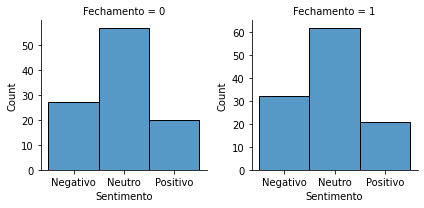

In [175]:
g = sns.FacetGrid(df_final21, col="Fechamento", sharex = True, sharey = False, )
g.map_dataframe(sns.histplot, x = "Sentimento", bins = 3)

# 7.0 Feature Engineering - Seleção do conjunto de features de dias anteriores

Selecionaremos o conjunto de features composto pelos métodos de NLP 
- Composição SentilextPT + Tradução & Vader Sentiment sem normalização e sem PCA e;

adicionaremos as features de n dias anteriores para avaliar a performance da classificação

## 7.1 Adição features de dias anteriores ao dataframe

In [138]:
df_final9 = df_final3.merge(df_final2, how = 'left', on = ['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento'])
df_final9.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,positividade,composicao,Noticias_y,score,Sentimento
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,0.00,-0.78,tcu avalia barrar venda de refinaria da petro...,-1,Negativo
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,0.00,0.00,petrobras (petr4) inicia contratação de nona ...,0,Neutro
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,0.03,-0.38,valor de venda de refinaria da petrobras é qu...,-1,Negativo
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,0.10,0.74,petrobras confirma venda da fatia na br distr...,0,Neutro
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,0.06,0.45,silva e luna 'militariza' cúpula da petrobra...,0,Neutro


In [139]:
features = ['polaridade', 'subjetividade', 'negatividade', 'neutralidade',  'positividade', 'composicao','score']
featuresd1 = [i + "d1" for i in features]
featuresd2 = [i + "d2" for i in features]
featuresd3 = [i + "d3" for i in features]
featuresd4 = [i + "d4" for i in features]

In [140]:
#Criando as colunas de features para d-1, d-2, d-3, d-4 e inicializando com valores zeros:
for i in features:
    df_final9[i+"d1"] = 0
    df_final9[i+"d2"] = 0
    df_final9[i+"d3"] = 0
    df_final9[i+"d4"] = 0
df_final9.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,...,positividaded3,positividaded4,composicaod1,composicaod2,composicaod3,composicaod4,scored1,scored2,scored3,scored4
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,...,0,0,0,0,0,0,0,0,0,0
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,...,0,0,0,0,0,0,0,0,0,0
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,...,0,0,0,0,0,0,0,0,0,0
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,...,0,0,0,0,0,0,0,0,0,0
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,...,0,0,0,0,0,0,0,0,0,0


In [141]:
df_final9[['Date','composicao','composicaod4']]

,Date,composicao,composicaod4
0,2021-01-04,-0.78,0
1,2021-01-05,0.00,0
2,2021-01-06,-0.38,0
3,2021-01-07,0.74,0
4,2021-01-11,0.45,0
...,...,...,...
214,2021-12-23,0.60,0
215,2021-12-27,0.54,0
216,2021-12-28,0.59,0
217,2021-12-29,0.88,0


In [142]:
import itertools

#atualiza as features de d-1
for a,b in itertools.zip_longest(features,featuresd1):
    df_final9[b] = df_final9.shift(periods=1)[a]
    
#atualiza as features de d-2
for a,b in itertools.zip_longest(features,featuresd2):
    df_final9[b] = df_final9.shift(periods=2)[a]
    
#atualiza as features de d-3
for a,b in itertools.zip_longest(features,featuresd3):
    df_final9[b] = df_final9.shift(periods=3)[a]
    
#atualiza as features de d-4
for a,b in itertools.zip_longest(features,featuresd4):
    df_final9[b] = df_final9.shift(periods=4)[a]


In [143]:
df_final9[['Date','composicao','composicaod4']]

,Date,composicao,composicaod4
0,2021-01-04,-0.78,nan
1,2021-01-05,0.00,nan
2,2021-01-06,-0.38,nan
3,2021-01-07,0.74,nan
4,2021-01-11,0.45,-0.78
...,...,...,...
214,2021-12-23,0.60,0.76
215,2021-12-27,0.54,0.97
216,2021-12-28,0.59,-0.25
217,2021-12-29,0.88,0.82


In [144]:
df_final9.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,...,positividaded3,positividaded4,composicaod1,composicaod2,composicaod3,composicaod4,scored1,scored2,scored3,scored4
0,2021-01-04,19.27,74719700,0.02,1,tcu evaluates barring sale of petrobras refine...,0.00,0.00,0.17,0.83,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1,2021-01-05,20.03,95181100,0.04,1,petrobras (petr4) starts contracting the ninth...,0.00,0.00,0.00,1.00,...,nan,nan,-0.78,nan,nan,nan,-1.00,nan,nan,nan
2,2021-01-06,20.07,96562500,0.00,1,value of sale of petrobras refinery is questio...,0.25,0.50,0.06,0.91,...,nan,nan,0.00,-0.78,nan,nan,0.00,-1.00,nan,nan
3,2021-01-07,20.67,56171300,0.03,1,petrobras confirms sale of stake in br distrib...,0.35,0.30,0.03,0.87,...,0.00,nan,-0.38,0.00,-0.78,nan,-1.00,0.00,-1.00,nan
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,...,0.00,0.00,0.74,-0.38,0.00,-0.78,0.00,-1.00,0.00,-1.00


In [145]:
df_final9.isnull().sum()

Date               0
Adj Close          0
Volume             0
Var%               0
Fechamento         0
Noticias_x         0
polaridade         0
subjetividade      0
negatividade       0
neutralidade       0
positividade       0
composicao         0
Noticias_y         0
score              0
Sentimento         0
polaridaded1       1
polaridaded2       2
polaridaded3       3
polaridaded4       4
subjetividaded1    1
subjetividaded2    2
subjetividaded3    3
subjetividaded4    4
negatividaded1     1
negatividaded2     2
negatividaded3     3
negatividaded4     4
neutralidaded1     1
neutralidaded2     2
neutralidaded3     3
neutralidaded4     4
positividaded1     1
positividaded2     2
positividaded3     3
positividaded4     4
composicaod1       1
composicaod2       2
composicaod3       3
composicaod4       4
scored1            1
scored2            2
scored3            3
scored4            4
dtype: int64

In [146]:
## Eliminação dos registros sem as features de dias anteriores (os primeiros 4 dias)

In [147]:
df_final9 = df_final9.dropna()
df_final9.isnull().sum()

Date               0
Adj Close          0
Volume             0
Var%               0
Fechamento         0
Noticias_x         0
polaridade         0
subjetividade      0
negatividade       0
neutralidade       0
positividade       0
composicao         0
Noticias_y         0
score              0
Sentimento         0
polaridaded1       0
polaridaded2       0
polaridaded3       0
polaridaded4       0
subjetividaded1    0
subjetividaded2    0
subjetividaded3    0
subjetividaded4    0
negatividaded1     0
negatividaded2     0
negatividaded3     0
negatividaded4     0
neutralidaded1     0
neutralidaded2     0
neutralidaded3     0
neutralidaded4     0
positividaded1     0
positividaded2     0
positividaded3     0
positividaded4     0
composicaod1       0
composicaod2       0
composicaod3       0
composicaod4       0
scored1            0
scored2            0
scored3            0
scored4            0
dtype: int64

In [148]:
df_final9.columns

Index(['Date', 'Adj Close', 'Volume', 'Var%', 'Fechamento', 'Noticias_x',
       'polaridade', 'subjetividade', 'negatividade', 'neutralidade',
       'positividade', 'composicao', 'Noticias_y', 'score', 'Sentimento',
       'polaridaded1', 'polaridaded2', 'polaridaded3', 'polaridaded4',
       'subjetividaded1', 'subjetividaded2', 'subjetividaded3',
       'subjetividaded4', 'negatividaded1', 'negatividaded2', 'negatividaded3',
       'negatividaded4', 'neutralidaded1', 'neutralidaded2', 'neutralidaded3',
       'neutralidaded4', 'positividaded1', 'positividaded2', 'positividaded3',
       'positividaded4', 'composicaod1', 'composicaod2', 'composicaod3',
       'composicaod4', 'scored1', 'scored2', 'scored3', 'scored4'],
      dtype='object')

## 7.1 Experimentos 
iterando sobre d á d-n;  1<=n<=4  
c/ s/ PCA   
c/ s/ normalização   


In [130]:
#Criando um dicionário com o conjunto de features do dia atual ao d-4:
feature_dias = {'dia atual': features, 'd-1': features+featuresd1, 'd-2':features+featuresd1+featuresd2, 'd-3':features+featuresd1+featuresd2+featuresd3, 'd-4':features+featuresd1+featuresd2+featuresd3+featuresd4}

In [131]:
df_models = pd.DataFrame()

## repetir o experimento 4x para eliminar possibilidade de outliers
for rep in range(0,4,1):
    
    ## iterar sobre o conjunto de features entre a data e o dia -n (para 1<=n<=4)
    for k in feature_dias.keys():
    
        #Lista de features consideradas e definição de X e Y:
        lista_features = feature_dias[k]
        X = df_final9[lista_features]
        y = df_final9['Fechamento']  
    
        #Holdout em treino e teste
        x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rep) ###
    
        ## iterar sobre a quantidade de reduções de dimensionalidade das features (PCA)
        for i in range(2,len(X.columns),1):
    
            #Aplicando PCA
            pca = PCA(n_components=i)
            x_train_pca = pca.fit_transform(x_train)
            x_test_pca = pca.fit_transform(x_test)
    
            #Aplicando Normalização
            scaler_train = StandardScaler()
            scaler_test = StandardScaler()

            scaler_train.fit(x_train_pca)
            scaler_test.fit(x_test_pca)

            x_train_pca_normalized = scaler_train.transform(x_train_pca)
            x_test_pca_normalized = scaler_test.transform(x_test_pca)


            #Testando PCA + normalizado
            print("Testando para conjunto de features do dia atual à %s com PCA = %s e Normalização - Rep %s!" % (k,i,rep)) 
            reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
            models, predictions = reg.fit(x_train_pca_normalized, x_test_pca_normalized, y_train, y_test)
            models['conjunto_features'] = k
            models['n_PCA'] = i
            models['Normalizado'] = True
            models['repeticao'] = rep
            # Armazenando os 5 melhores modelos (top 5 Maiores Acurácia)
            df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)
    
            #Testando PCA
            print("Testando para conjunto de features do dia atual à %s com PCA = %s! - Rep %s" % (k,i,rep))
            reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
            models, predictions = reg.fit(x_train_pca, x_test_pca, y_train, y_test)
            models['conjunto_features'] = k
            models['n_PCA'] = i 
            models['Normalizado'] = False
            models['repeticao'] = rep
            # Armazenando os 5 melhores modelos (top 5 Maiores Acurácia)
            df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)    

    
        #Testando sem PCA e sem Normalizacao
        print("Testando para conjunto de features do dia atual à %s!" % k)
        reg = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
        models, predictions = reg.fit(x_train, x_test, y_train, y_test)
        models['conjunto_features'] = k
        models['n_PCA'] = "N/A"
        models['Normalizado'] = False
        models['repeticao'] = rep
        df_models = df_models.append(models.reset_index().sort_values(by='Accuracy', ascending=False).head(5), ignore_index=True)

Testando para conjunto de features do dia atual à dia atual com PCA = 2 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.86it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.88it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.34it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.38it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.06it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.96it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.55it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.36it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.94it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.94it/s]


Testando para conjunto de features do dia atual à dia atual!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.53it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.36it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.47it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.14it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.83it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.67it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.45it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.37it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.93it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.44it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.71it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.27it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.53it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.47it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.83it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.95it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.32it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.42it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.90it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.20it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.79it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.17it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.72it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.84it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.13it/s]


Testando para conjunto de features do dia atual à d-1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.18it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.06it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.75it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.03it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.25it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.37it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.29it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.90it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.36it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.81it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.53it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.92it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.55it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.02it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.15it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.91it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.25it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.23it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.77it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.27it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.78it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.00it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.15it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.39it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.12it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.07it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.04it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.87it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.36it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.94it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.21it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.65it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.85it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.75it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.95it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.27it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.89it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.22it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.46it/s]


Testando para conjunto de features do dia atual à d-2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.66it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 33.20it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.41it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.82it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.74it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.64it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.10it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.53it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.97it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.16it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.33it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.45it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.37it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.57it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 32.23it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.60it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.82it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.22it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.29it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.24it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 31.32it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.59it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.78it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.61it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.39it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.59it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.94it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 12.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.05it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 14.38it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.94it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.49it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.98it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.68it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.68it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.69it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.50it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.78it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.71it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.07it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.31it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.73it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.31it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.98it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 13.12it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.36it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.17it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.02it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.26it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.41it/s]


Testando para conjunto de features do dia atual à d-3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.03it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.31it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.43it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 10.12it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 14.82it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.22it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.90it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.98it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 16.05it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 14.63it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 11.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.12it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.89it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.97it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.32it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.02it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.91it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.65it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.36it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.70it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.80it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.83it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.88it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.03it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.86it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.67it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.56it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.99it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.43it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.18it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.39it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.12it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.41it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.74it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.99it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.68it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.90it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.65it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.20it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.06it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.71it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.41it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 11.69it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 13.35it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.28it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.02it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.67it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.47it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.38it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.75it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.25it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.32it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.40it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34 e Normalização - Rep 0!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.89it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34! - Rep 0


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.58it/s]


Testando para conjunto de features do dia atual à d-4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.69it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.17it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.45it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.36it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.60it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.09it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.92it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.52it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.94it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.61it/s]


Testando para conjunto de features do dia atual à dia atual!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.45it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.43it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.32it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.74it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.38it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.02it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.75it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.75it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.28it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.42it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.59it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.65it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.37it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.92it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.07it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.91it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.93it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.03it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.16it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.15it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.11it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.73it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.67it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.84it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.71it/s]


Testando para conjunto de features do dia atual à d-1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.18it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.91it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 29.00it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.61it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.23it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.69it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.39it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.78it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.08it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.51it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.34it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.43it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.08it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.12it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.44it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.35it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.57it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.44it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.89it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.98it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.71it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.56it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.69it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.61it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.41it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.87it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.17it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.79it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.24it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.45it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.84it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.36it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.08it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.89it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.85it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.53it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.83it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.16it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.48it/s]


Testando para conjunto de features do dia atual à d-2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.92it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.51it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.85it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.19it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.32it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.66it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.76it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.47it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.66it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.74it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.74it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.92it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.46it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.91it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.74it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.57it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.72it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.86it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.62it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.02it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.46it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.62it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.44it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.65it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.91it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.03it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.50it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.36it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 13.01it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.40it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.26it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 11.79it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.02it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.12it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.96it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.44it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.16it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.79it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.15it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.90it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.40it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.55it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.85it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.91it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.01it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.90it/s]


Testando para conjunto de features do dia atual à d-3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.98it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.43it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.43it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.23it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.10it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.40it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.28it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.99it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.89it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.07it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.29it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.86it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.16it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.22it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.62it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.42it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.07it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.86it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.16it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.60it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.47it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.61it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.84it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.99it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.94it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.53it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.18it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 11.78it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.79it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.57it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.19it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.85it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.78it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.00it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.32it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.74it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.64it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.13it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.56it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.02it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.13it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.25it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.11it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.24it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.65it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.55it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.34it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.39it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.24it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.01it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.21it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.01it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 13.83it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34 e Normalização - Rep 1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34! - Rep 1


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.33it/s]


Testando para conjunto de features do dia atual à d-4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.82it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.03it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.58it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.44it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.86it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.28it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.14it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.59it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.59it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.75it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.56it/s]


Testando para conjunto de features do dia atual à dia atual!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.98it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.20it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.21it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.15it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.46it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.60it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.11it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.89it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.44it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.75it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.44it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.24it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.01it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.45it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.14it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.44it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.58it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.44it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.99it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.58it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.78it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.43it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.28it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.28it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.89it/s]


Testando para conjunto de features do dia atual à d-1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.29it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.21it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.22it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.21it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.99it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 30.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.76it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.15it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.57it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.90it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.72it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.75it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.24it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.39it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.88it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.13it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.87it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.34it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.32it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.12it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.14it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.62it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.89it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.75it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.02it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.54it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.37it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.93it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.50it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.97it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.72it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.66it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.49it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.54it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.02it/s]


Testando para conjunto de features do dia atual à d-2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.42it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.61it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.46it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.55it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.81it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.62it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.08it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.11it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 14.90it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.86it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.60it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.57it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.28it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.44it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.68it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.58it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.10it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.44it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.40it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.21it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.55it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.62it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.75it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.67it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.25it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.92it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.06it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.05it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.32it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.11it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.22it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.25it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.70it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.65it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.70it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.28it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.67it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.97it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.23it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.12it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.24it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.67it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.78it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.57it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.55it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.88it/s]


Testando para conjunto de features do dia atual à d-3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.00it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.88it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.84it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 29.00it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.86it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.26it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.32it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.59it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.69it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.86it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.46it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.57it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.18it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.57it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.92it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.40it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.11it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.46it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.22it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.00it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.84it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.75it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.69it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.06it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.15it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.15it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.67it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.38it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.57it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.30it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.61it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.08it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.04it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.59it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.30it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.35it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.02it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.49it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.45it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.37it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.59it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.35it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.27it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.77it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.39it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.05it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.38it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.01it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.27it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.31it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.14it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.14it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.51it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.42it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 16.13it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34 e Normalização - Rep 2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.96it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34! - Rep 2


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.13it/s]


Testando para conjunto de features do dia atual à d-4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.72it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.73it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 2! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.72it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.41it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 3! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.79it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.01it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 4! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.77it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.10it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 5! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.27it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.85it/s]


Testando para conjunto de features do dia atual à dia atual com PCA = 6! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.11it/s]


Testando para conjunto de features do dia atual à dia atual!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.13it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.72it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 2! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.00it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.88it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 3! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.85it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.75it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 4! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.10it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 5! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.98it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.38it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 6! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.11it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.83it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 7! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.51it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.67it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 8! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.88it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.35it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 9! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.34it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.51it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 10! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.33it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.97it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 11! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.73it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.68it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 12! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.12it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.96it/s]


Testando para conjunto de features do dia atual à d-1 com PCA = 13! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.77it/s]


Testando para conjunto de features do dia atual à d-1!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.57it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.29it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 2! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.86it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.87it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 3! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.84it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.29it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 4! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.48it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.19it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 5! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.75it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.14it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 6! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.01it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.51it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 7! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.83it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.35it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 8! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.40it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.67it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 9! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.72it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.66it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 10! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.03it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.59it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 11! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.84it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.30it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 12! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.39it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.78it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 13! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.37it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.52it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 14! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.89it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.58it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 15! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.14it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.84it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 16! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.55it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.90it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 17! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.66it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.53it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 18! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.32it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.12it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 19! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.32it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.59it/s]


Testando para conjunto de features do dia atual à d-2 com PCA = 20! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.16it/s]


Testando para conjunto de features do dia atual à d-2!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.76it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 2! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 29.00it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.51it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 3! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.50it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.82it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 4! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 28.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.27it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 5! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.96it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.12it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 6! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.60it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.68it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 7! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.92it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.71it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 8! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.96it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.17it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 9! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.58it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.24it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 10! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.87it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.69it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 11! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.85it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.26it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 12! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.88it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.49it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 13! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.79it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 14! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.49it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 15! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.85it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.39it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 16! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.43it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.09it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 17! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.01it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.53it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 18! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.74it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.25it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 19! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.54it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.12it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 20! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.50it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.99it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 21! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.81it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.69it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 22! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.27it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.26it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 23! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.01it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.06it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 24! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.63it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.02it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 25! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.93it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.62it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 26! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.18it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.72it/s]


Testando para conjunto de features do dia atual à d-3 com PCA = 27! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.90it/s]


Testando para conjunto de features do dia atual à d-3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.74it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.27it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 2! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.87it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.57it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 3! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.69it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.36it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 4! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.10it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 14.72it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 5! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.31it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.82it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 6! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.78it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.70it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 7! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.56it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.96it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 8! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.62it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.95it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 9! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.76it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.90it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 10! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 12.51it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 14.63it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 11! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.54it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 16.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 12! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.84it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.52it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 13! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 16.46it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.20it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 14! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.02it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.48it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 15! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 12.68it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 16! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.14it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.41it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 17! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.78it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.89it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 18! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 16.73it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.64it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 19! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.31it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.34it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 20! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.80it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.83it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 21! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.80it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.20it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 22! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 23! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 15.36it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.24it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 24! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.32it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 25! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 18.22it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.49it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 26! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.08it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 27! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.53it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 28! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.08it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 23.24it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 29! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.60it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.33it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 30! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.18it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.14it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 31! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.49it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.46it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 32! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 25.17it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.66it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 33! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.58it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34 e Normalização - Rep 3!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.49it/s]


Testando para conjunto de features do dia atual à d-4 com PCA = 34! - Rep 3


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 19.59it/s]


Testando para conjunto de features do dia atual à d-4!


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 20.71it/s]


In [256]:
df_models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken,conjunto_features,n_PCA,Normalizado,repeticao
3440,PassiveAggressiveClassifier,0.72,0.72,0.72,0.72,0.01,d-3,16,True,3
3445,PassiveAggressiveClassifier,0.71,0.70,0.70,0.70,0.01,d-3,16,False,3
2000,GaussianNB,0.69,0.71,0.71,0.69,0.02,dia atual,N/A,False,2
3100,BernoulliNB,0.69,0.69,0.69,0.69,0.02,d-1,N/A,False,3
1625,QuadraticDiscriminantAnalysis,0.69,0.66,0.66,0.66,0.01,d-4,3,True,1
3510,LGBMClassifier,0.69,0.69,0.69,0.69,0.09,d-3,23,True,3
1580,DecisionTreeClassifier,0.69,0.69,0.69,0.69,0.02,d-3,25,True,1
3490,LGBMClassifier,0.69,0.69,0.69,0.69,0.07,d-3,21,True,3
2975,RandomForestClassifier,0.69,0.69,0.69,0.69,0.23,dia atual,N/A,False,3
2585,NearestCentroid,0.69,0.71,0.71,0.69,0.03,d-3,N/A,False,2


Escolheremos o conjunto de features referente ao dia atual á 3 dias anteriores.

Os seguintes modelos serão selecionados para tunagem:

- PassiveAggressiveClassifier;  
- GaussianNB;  
- BernoulliNB;  
- QuadraticDiscriminantAnalysis;  
- LGBMClassifier;  
- RandomForestClassifier;  
- NearestCentroid;  
- NuSVC;  
- XGBClassifier;  
- SGDClassifier;  
- Perceptron;  
- DecisionTreeClassifier
- MLP
- SVC
- AdaBoostClassifier
- KNeighborsClassifier

# 8.0 Análise de Dados - Features

In [153]:
df_analise = df_final9.copy()
df_analise.head()

,Date,Adj Close,Volume,Var%,Fechamento,Noticias_x,polaridade,subjetividade,negatividade,neutralidade,...,positividaded3,positividaded4,composicaod1,composicaod2,composicaod3,composicaod4,scored1,scored2,scored3,scored4
4,2021-01-11,20.57,48744700,-0.01,0,silva and luna 'militariza' petrobras dome pet...,0.18,0.40,0.04,0.90,...,0.00,0.00,0.74,-0.38,0.00,-0.78,0.00,-1.00,0.00,-1.00
5,2021-01-12,20.42,65691900,-0.01,0,Arabs take over this fourth petrobras refinery...,-0.02,0.08,0.00,0.95,...,0.03,0.00,0.45,0.74,-0.38,0.00,0.00,0.00,-1.00,0.00
6,2021-01-13,19.43,93826600,-0.05,0,petrobras is the second largest in the world i...,-0.06,0.38,0.11,0.89,...,0.10,0.03,0.53,0.45,0.74,-0.38,0.00,0.00,0.00,-1.00
7,2021-01-18,18.71,68855700,-0.00,0,more than 100 jobs in the oil and gas sector! ...,0.22,0.31,0.06,0.84,...,0.06,0.10,-0.36,0.53,0.45,0.74,1.00,0.00,0.00,0.00
8,2021-01-19,19.13,61656000,0.02,1,proposal prohibits creation of petrobras subsi...,0.07,0.45,0.06,0.88,...,0.05,0.06,0.71,-0.36,0.53,0.45,-1.00,1.00,0.00,0.00


### Correlação

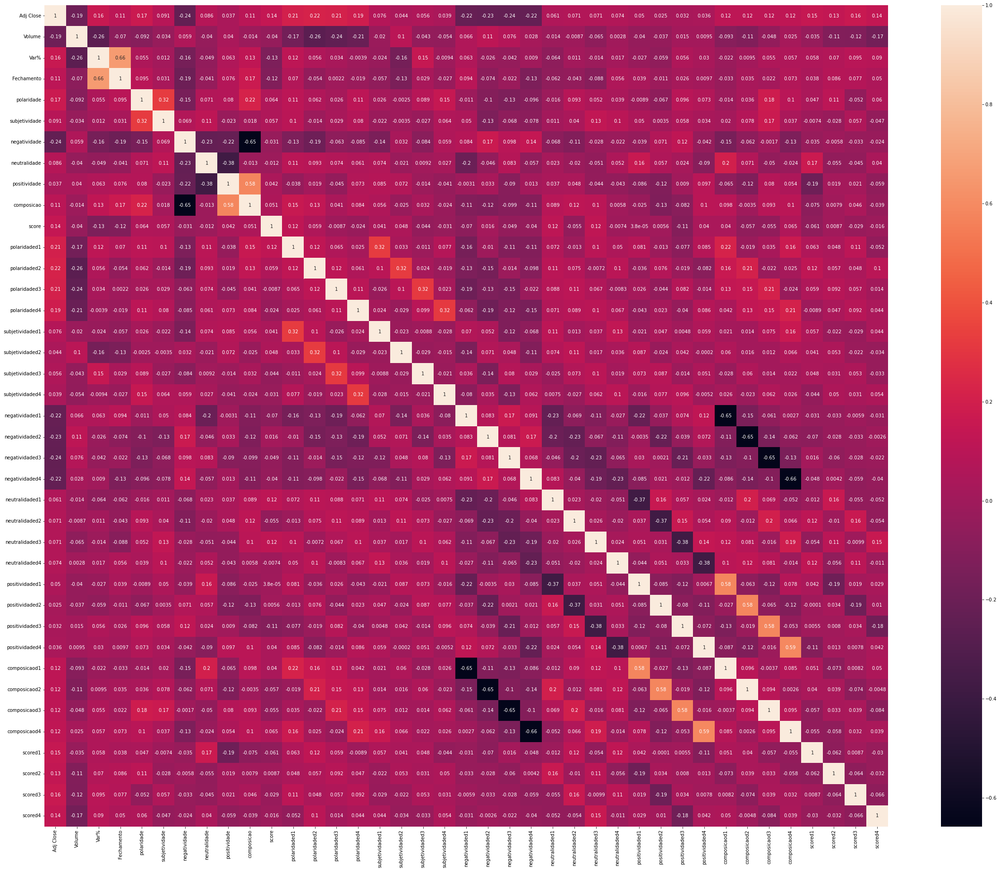

In [157]:
plt.figure(figsize=(40,32))
sns.heatmap(df_analise.corr(),annot=True)
plt.show()

- As features negatividade vs composição possui alta correlação (0.65), assim como positividade vs composição (0.58). A feature composição tenta resumir o sentimento geral da noticia é esperado que tenha alta correlação com as outras
- As features Fechamento e Var% possui alta correlação 0.66


## Analise de separabilidade das classes

In [161]:
featurefechamento = ['Fechamento']

In [171]:
conjuntofeatures = features+featuresd1+featuresd2+featuresd3

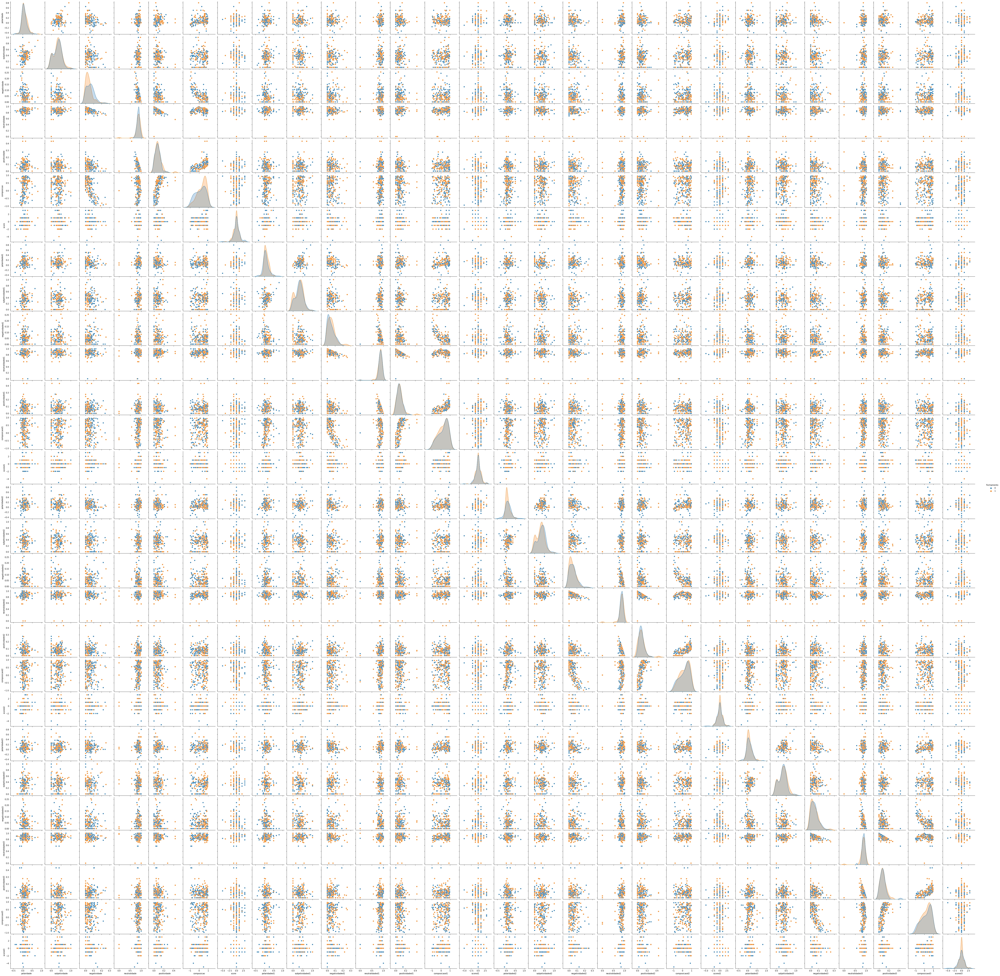

In [162]:
sns.pairplot(df_analise[featurefechamento+conjuntofeatures], hue = 'Fechamento' )

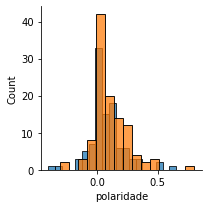

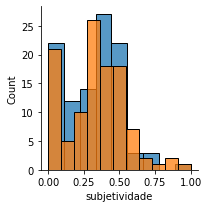

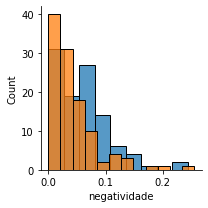

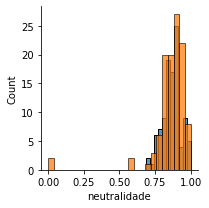

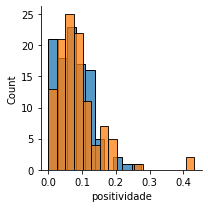

...

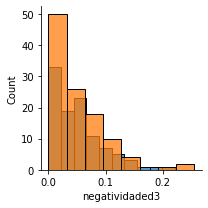

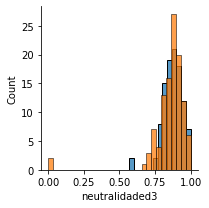

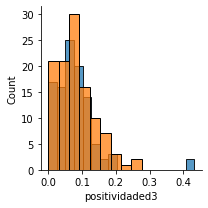

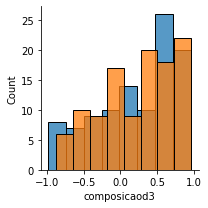

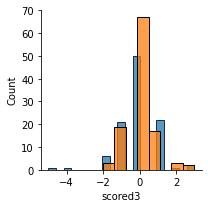

In [172]:
for i in conjuntofeatures:
    g = sns.FacetGrid(df_analise, sharex = True, sharey = False, hue = 'Fechamento',  )
    g.map_dataframe(sns.histplot, x = i)

Não há uma separabilidade evidente entre os dias com fechamento em baixa ou alta das ações da petrobras para cada feature gerada e atrelada às noticias

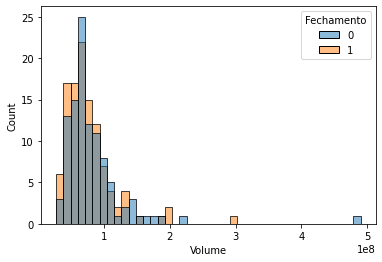

In [180]:
sns.histplot(df_analise, x = "Volume", hue = "Fechamento")

## Analise de frequência de palavras

In [186]:
a = df_final2['Noticias']
list(a)
b = a.values[0]

In [187]:
#!pip install nltk

In [188]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

In [189]:
frase = b

In [190]:
palavras = nltk.word_tokenize(frase)

In [191]:
from nltk import FreqDist
frequencia = FreqDist(frase)

### Criando uma lista com as noticias de todos os dias

In [192]:
a = df_final2['Noticias']
a = list(a)
len(a)

219

In [193]:
c = ""
for i in a:
    c += i

In [194]:
frase = c
palavras = nltk.word_tokenize(frase)

In [195]:
frequencia = FreqDist(frase)
fdist = FreqDist(palavras)
fdist.most_common(80)

[('petrobras', 1513),
 ('de', 1104),
 ('da', 713),
 ('e', 529),
 (',', 522),
 ('em', 338),
 ('...', 299),
 ('do', 296),
 ('para', 289),
 ('a', 283),
 ('no', 225),
 ('na', 224),
 ('com', 196),
 ('(', 187),
 (')', 185),
 (':', 181),
 ('que', 178),
 ('$', 178),
 ('%', 154),
 ('por', 146),
 ('diz', 135),
 ('o', 127),
 ('r', 123),
 ('venda', 119),
 ('bolsonaro', 112),
 ('petr4', 108),
 ('mais', 107),
 ('gás', 104),
 (';', 103),
 ('gasolina', 96),
 ('preço', 88),
 ('é', 87),
 ('não', 82),
 ('preços', 82),
 ('ações', 79),
 ('petróleo', 70),
 ('após', 68),
 ('combustíveis', 64),
 ('diesel', 62),
 ('refinaria', 58),
 ('sobre', 57),
 ('us', 57),
 ('dos', 54),
 ('vale', 53),
 ('vai', 53),
 ('alta', 51),
 ('política', 51),
 ('dividendos', 51),
 ('à', 51),
 ('pela', 50),
 ('anuncia', 50),
 ("'", 49),
 ('pode', 46),
 ('presidente', 45),
 ('novo', 45),
 ('bi', 44),
 ('ao', 44),
 ('os', 44),
 ('tem', 42),
 ('bilhões', 41),
 ('campos', 40),
 ('se', 39),
 ('até', 39),
 ('?', 38),
 ('milhões', 37),
 ('re

### Remoçao de stopwords

In [196]:
stopwords = nltk.corpus.stopwords.words('portuguese')

In [197]:
def Removestopwords(instancia):
    instancia = instancia.lower()
    stopwords = set(nltk.corpus.stopwords.words('portuguese'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [198]:

caracteres = [",","...", "("," )" ,":", "$",  "%",  ";", "'", "(PETR4)", "PETR4", "petr4","(petr4)" ]

In [199]:
d = Removestopwords(c)

### Remove Caracteres

In [200]:
carac = "!@#$;:,%')(?"
for i in range(0,len(carac)):
     d =d.replace(carac[i],"")

In [201]:
carac2 = "..."
for i in range(0,len(carac2)):
     d =d.replace(carac2[i],"")

In [202]:
frase = d
palavras = nltk.word_tokenize(frase)

In [203]:
frequencia = FreqDist(frase)
fdist = FreqDist(palavras)
fdist.most_common(80)

[('petrobras', 1512),
 ('diz', 135),
 ('venda', 118),
 ('r', 116),
 ('bolsonaro', 112),
 ('gás', 104),
 ('petr4', 103),
 ('gasolina', 96),
 ('preço', 88),
 ('preços', 82),
 ('ações', 79),
 ('petróleo', 70),
 ('após', 68),
 ('combustíveis', 64),
 ('diesel', 64),
 ('refinaria', 58),
 ('sobre', 57),
 ('us', 55),
 ('vale', 53),
 ('vai', 53),
 ('alta', 51),
 ('política', 51),
 ('dividendos', 51),
 ('anuncia', 50),
 ('pode', 46),
 ('presidente', 45),
 ('novo', 45),
 ('bi', 44),
 ('bilhões', 41),
 ('campos', 40),
 ('milhões', 37),
 ('reajuste', 35),
 ('refinarias', 35),
 ('campo', 33),
 ('vende', 33),
 ('aumento', 33),
 ('governo', 33),
 ('brasil', 32),
 ('lucro', 32),
 ('mercado', 31),
 ('sobe', 31),
 ('bacia', 31),
 ('privatização', 30),
 ('contrato', 30),
 ('ação', 29),
 ('bahia', 28),
 ('quer', 28),
 ('maior', 28),
 ('plataforma', 28),
 ('ibovespa', 28),
 ('contra', 27),
 ('rio', 27),
 ('fecha', 27),
 ('natural', 27),
 ('cai', 27),
 ('empresas', 27),
 ('valor', 26),
 ('conclui', 26),
 ('v

<IPython.core.display.Javascript object>


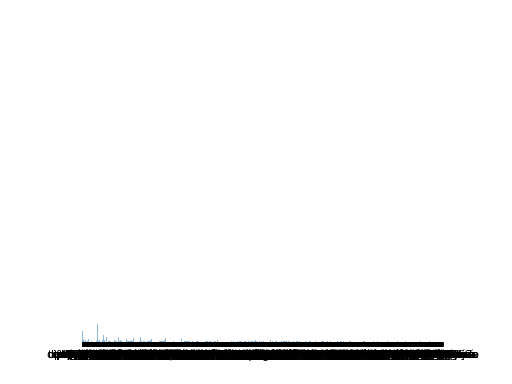

In [209]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt

palavras = fdist.keys()
y_pos = np.arange(len(palavras))
contagem = fdist.values()

plt.bar(y_pos, contagem, align='center', alpha=0.5)
plt.xticks(y_pos, palavras)
plt.ylabel('Frequencia')
plt.title('Frequencia das palavras na frase')

plt.show()

# 8.0 Treinamento e tunagem de modelos

## 8.1 PassiveAggressiveClassifier
- Gridsearch (Hiperparametros, PCA)
- CrossValidation

In [132]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [133]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)

In [134]:
scoring = {"accuracy": acuracia_dados, "f1":f1_dados}

In [198]:
resultados = []


X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento']  

#Holdout fora do loop para não variar conjunto de teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)


#Validação cruzada com 10 kfolds
kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
#Repete os experimentos 20x
for i in range(20):
    
    print("Fazendo gridsearch - Repeticao %s" % (i))
    
    gs = GridSearchCV(
        PassiveAggressiveClassifier(random_state=i),
        param_grid={"max_iter": [25,50,100,200,500,700,1000,1200,1500], "tol": [0.01, 0.001, 0.0001], "C": [0.01,0.05,0.1,0.5,1.0,1.5]},
        scoring=scoring,
        refit="f1",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
      
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    
    #calculando f1_score
    f1_teste = f1_score(y_test, y_test_pred)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    
    
    #Calculando Recall clase 1
    rec0_teste = roc_auc_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = roc_auc_score(y_test, y_test_pred, pos_label=1)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_iter'],hyperparams['tol'],hyperparams['C'],acuracy_treino,accuracy_teste,f1_teste,auc_teste]))
    

Fazendo gridsearch - Repeticao 0
Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19


In [143]:
pd.set_option('display.precision',4)

In [144]:
pd.reset_option('^display.',silent=True)

In [199]:
#transformando os resultados para dataframe:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_iter', 'tol','C','acuracy_treino','acuracia_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'f1_teste', ascending = False)

,repeticao,max_iter,tol,C,acuracy_treino,acuracia_teste,f1_teste,auc_teste
1,1.0,25.0,0.0010,0.05,0.477561,0.615385,0.712644,0.601044
19,19.0,50.0,0.0010,0.10,0.556366,0.630769,0.692308,0.622865
6,6.0,25.0,0.0010,0.01,0.498392,0.630769,0.684211,0.624288
14,14.0,25.0,0.0001,0.10,0.497819,0.538462,0.659091,0.523245
0,0.0,25.0,0.0010,0.01,0.529268,0.630769,0.657143,0.628558
17,17.0,50.0,0.0100,0.05,0.515898,0.600000,0.648649,0.594877
10,10.0,25.0,0.0100,0.05,0.532041,0.600000,0.638889,0.596300
7,7.0,25.0,0.0010,0.05,0.523775,0.646154,0.622951,0.650380
5,5.0,25.0,0.0010,0.05,0.544332,0.569231,0.611111,0.565465
9,9.0,25.0,0.0100,0.05,0.552108,0.569231,0.588235,0.568311


Resultados:

- modelos com max_iter = 25 perfomou melhor (testaremos para valores <=25)
- modelos com tol = 0.001 e 0.0001 perfomaram melhor  
- modelos com C = 0.05, 0.01 e 0.1 performaram melhor (testaremos para mais valores entre 0.05 e 0.1)

Refinando a solução para os hiperparâmetros e aumentando as repetições:

In [200]:
resultados = []


X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento']  

#Holdout fora do loop para não variar conjunto de teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)


#Validação cruzada com 10 kfolds
kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
#Repete os experimentos 20x
for i in range(20):
    
    print("Fazendo gridsearch - Repeticao %s" % (i))
    
    gs = GridSearchCV(
        PassiveAggressiveClassifier(random_state=i),
        param_grid={"max_iter": [6,8,10,12,14,16,18,20], "tol": [0.001, 0.0001], "C": [0.01,0.03,0.05,0.07,0.09,0.1]},
        scoring=scoring,
        refit="f1",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
      
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    
    #calculando f1_score
    f1_teste = f1_score(y_test, y_test_pred)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_iter'],hyperparams['tol'],hyperparams['C'],acuracy_treino,accuracy_teste,f1_teste,auc_teste]))
    

Fazendo gridsearch - Repeticao 0
Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19


In [201]:
#transformando os resultados para dataframe:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_iter', 'tol','C','acuracy_treino','acuracia_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'f1_teste', ascending = False)

,repeticao,max_iter,tol,C,acuracy_treino,acuracia_teste,f1_teste,auc_teste
1,1.0,8.0,0.001,0.09,0.565412,0.600000,0.711111,0.583491
8,8.0,14.0,0.001,0.09,0.592268,0.661538,0.685714,0.659393
18,18.0,20.0,0.001,0.01,0.548286,0.646154,0.676056,0.643264
6,6.0,10.0,0.001,0.03,0.607632,0.630769,0.675676,0.625712
12,12.0,10.0,0.001,0.03,0.625811,0.630769,0.647059,0.629981
5,5.0,12.0,0.001,0.03,0.520818,0.600000,0.638889,0.596300
4,4.0,10.0,0.001,0.03,0.592883,0.600000,0.628571,0.597723
17,17.0,8.0,0.001,0.09,0.533763,0.646154,0.622951,0.650380
10,10.0,14.0,0.001,0.05,0.591159,0.584615,0.619718,0.581594
7,7.0,18.0,0.001,0.03,0.591026,0.600000,0.617647,0.599146


Resultados

-  Modelos com max_iter = 8,10,14,20 performaram melhor
-  Modelos com tol = 0.001 perfomaram melhor

Refinando a solução para os hiperparâmetros:

In [202]:
resultados = []


X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento']  

#Holdout fora do loop para não variar conjunto de teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)


#Validação cruzada com 10 kfolds
kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
#Repete os experimentos 30x
for i in range(30):
    
    print("Fazendo gridsearch - Repeticao %s" % (i))
    
    gs = GridSearchCV(
        PassiveAggressiveClassifier(random_state=i),
        param_grid={"max_iter": [8,10,14,20], "tol": [0.001], "C": [0.01,0.03,0.05,0.07,0.09,0.1]},
        scoring=scoring,
        refit="f1",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
      
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    
    #calculando f1_score
    f1_teste = f1_score(y_test, y_test_pred)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_iter'],hyperparams['tol'],hyperparams['C'],acuracy_treino,accuracy_teste,f1_teste,auc_teste]))
    

Fazendo gridsearch - Repeticao 0
Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Rep

In [203]:
#transformando os resultados para dataframe:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_iter', 'tol','C','acuracy_treino','acuracia_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'f1_teste', ascending = False)

,repeticao,max_iter,tol,C,acuracy_treino,acuracia_teste,f1_teste,auc_teste
1,1.0,8.0,0.001,0.09,0.565412,0.600000,0.711111,0.583491
5,5.0,14.0,0.001,0.03,0.457158,0.615385,0.691358,0.605313
28,28.0,14.0,0.001,0.03,0.505193,0.661538,0.685714,0.659393
8,8.0,14.0,0.001,0.09,0.592268,0.661538,0.685714,0.659393
18,18.0,20.0,0.001,0.01,0.548286,0.646154,0.676056,0.643264
6,6.0,10.0,0.001,0.03,0.607632,0.630769,0.675676,0.625712
25,25.0,20.0,0.001,0.01,0.575142,0.630769,0.666667,0.627135
20,20.0,10.0,0.001,0.03,0.568004,0.600000,0.648649,0.594877
15,15.0,8.0,0.001,0.01,0.501768,0.615385,0.647887,0.612429
12,12.0,10.0,0.001,0.03,0.625811,0.630769,0.647059,0.629981


Resultados

- Modelos com max_iter = 14 performaram melhor; 
- Modelos com tol = 0.001 performaram melhor;  
- Modelos com C = 0.03 e 0.09 performaram melhor; 

Refinando a solução para os hiperparâmetros:



In [204]:
resultados = []


X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento']  

#Holdout fora do loop para não variar conjunto de teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)


#Validação cruzada com 10 kfolds
kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
#Repete os experimentos 30x
for i in range(30):
    
    print("Fazendo gridsearch - Repeticao %s" % (i))
    
    gs = GridSearchCV(
        PassiveAggressiveClassifier(random_state=i),
        param_grid={"max_iter": [14], "tol": [0.001], "C": [0.03,0.09]},
        scoring=scoring,
        refit="f1",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
      
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    
    #calculando f1_score
    f1_teste = f1_score(y_test, y_test_pred)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_iter'],hyperparams['tol'],hyperparams['C'],acuracy_treino,accuracy_teste,f1_teste,auc_teste]))
    

Fazendo gridsearch - Repeticao 0
Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Rep

In [205]:
#transformando os resultados para dataframe:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_iter', 'tol','C','acuracy_treino','acuracia_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'f1_teste', ascending = False)

,repeticao,max_iter,tol,C,acuracy_treino,acuracia_teste,f1_teste,auc_teste
6,6.0,14.0,0.001,0.03,0.502157,0.661538,0.725000,0.652277
17,17.0,14.0,0.001,0.03,0.450990,0.646154,0.716049,0.636148
1,1.0,14.0,0.001,0.09,0.470949,0.600000,0.711111,0.583491
26,26.0,14.0,0.001,0.03,0.483802,0.630769,0.700000,0.621442
15,15.0,14.0,0.001,0.03,0.435369,0.615385,0.691358,0.605313
5,5.0,14.0,0.001,0.03,0.473864,0.615385,0.691358,0.605313
0,0.0,14.0,0.001,0.09,0.521977,0.600000,0.690476,0.587761
2,2.0,14.0,0.001,0.03,0.402503,0.584615,0.682353,0.571632
3,3.0,14.0,0.001,0.03,0.494896,0.584615,0.682353,0.571632
11,11.0,14.0,0.001,0.09,0.451907,0.538462,0.680851,0.518975


Hiperparâmetros

max_iter = 14  
tol = 0.001  
C = 0.03   

### 8.1.1 Avaliação do PassiveAgressiveClassifier

In [335]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

passagress = PassiveAggressiveClassifier(random_state=1, max_iter = 14, tol = 0.001, C = 0.03)
passagress.fit(X_train,y_train)

PassiveAggressiveClassifier(C=0.03, max_iter=14, random_state=1)

In [336]:
#Predizendo y
y_pred = passagress.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.71      0.39      0.50        31
           1       0.60      0.85      0.71        34

    accuracy                           0.63        65
   macro avg       0.66      0.62      0.60        65
weighted avg       0.65      0.63      0.61        65


Confusion Matrix Dados de Producao:
 [[12 19]
 [ 5 29]]



In [337]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#calculando f1_score
f1 = f1_score(y_test, y_pred)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("F1_Score: %s" % (f1))
print("AUC: %s" % (auc))

Recall_0: 0.3870967741935484
Recall_1: 0.8529411764705882
Acuracia: 0.6307692307692307
F1_Score: 0.7073170731707317
AUC: 0.6200189753320683


O Modelo aprendeu a classificar bem quando há aumento nos valores das ações mas erra bastante quando há queda nos valores embora os dados estejam balanceados.

### 8.1.2 Hyperparâmetros PassiveAggressiveClassifier + balanceamento

In [368]:
resultados = []


X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  


## Balanceamento dos dados:
nr = NearMiss()
X, y = nr.fit_resample(X_todos, y_todos)
    
 #Holdout:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
    
    
#Repete os experimentos 10x
for i in range(30):
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        PassiveAggressiveClassifier(random_state=i),
        param_grid={"max_iter": [25,50,100,200,500,700,1000,1200,1500], "tol": [0.01, 0.001, 0.0001], "C": [0.01,0.05,0.1,0.5,1.0,1.5]},
        scoring=scoring,
        refit="f1",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score
    f1_teste = f1_score(y_test, y_test_pred)
    f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_iter'],hyperparams['tol'],hyperparams['C'],acuracy_treino,accuracy_teste,accuracy_todos,rec0_teste,rec0_todos,rec1_teste,rec1_todos,f1_teste,f1_todos,auc_teste,auc_todos]))
    

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [370]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_iter', 'tol','C','acuracy_treino','acuracia_teste','acuracia_df','rec_0_teste','rec_0_df','rec_1_teste','rec_1_df','f1_teste','f1_df','auc_teste','auc_df'])
resultados.sort_values(by = 'f1_teste', ascending = False)

,repeticao,max_iter,tol,C,acuracy_treino,acuracia_teste,acuracia_df,rec_0_teste,rec_0_df,rec_1_teste,rec_1_df,f1_teste,f1_df,auc_teste,auc_df
21,21.0,50.0,0.0100,0.10,0.578755,0.571429,0.604651,0.322581,0.317308,0.81250,0.873874,0.658228,0.695341,0.567540,0.595591
14,14.0,25.0,0.0100,0.50,0.582428,0.523810,0.567442,0.161290,0.182692,0.87500,0.927928,0.651163,0.688963,0.518145,0.555310
12,12.0,25.0,0.0010,1.00,0.617705,0.476190,0.530233,0.000000,0.067308,0.93750,0.963964,0.645161,0.679365,0.468750,0.515636
8,8.0,25.0,0.0010,0.05,0.603912,0.539683,0.655814,0.387097,0.509615,0.68750,0.792793,0.602740,0.704000,0.537298,0.651204
15,15.0,25.0,0.0010,0.01,0.576162,0.587302,0.641860,0.612903,0.586538,0.56250,0.693694,0.580645,0.666667,0.587702,0.640116
26,26.0,25.0,0.0010,0.01,0.593842,0.571429,0.613953,0.580645,0.509615,0.56250,0.711712,0.571429,0.655602,0.571573,0.610664
18,18.0,50.0,0.0010,0.01,0.579129,0.555556,0.604651,0.548387,0.480769,0.56250,0.720721,0.562500,0.653061,0.555444,0.600745
24,24.0,50.0,0.0010,0.01,0.551923,0.555556,0.618605,0.548387,0.519231,0.56250,0.711712,0.562500,0.658333,0.555444,0.615471
22,22.0,25.0,0.0100,0.01,0.572735,0.571429,0.600000,0.612903,0.567308,0.53125,0.630631,0.557377,0.619469,0.572077,0.598969
10,10.0,25.0,0.0010,0.01,0.557846,0.539683,0.618605,0.516129,0.519231,0.56250,0.711712,0.553846,0.658333,0.539315,0.615471


Mesmo após balancear os exemplos em 50/50%  os valores de recall não ficaram equilibrados para o maior valor de f1-score.

Recall 0: 32.2%; 
Recall 1: 81.25% 

materemos o modelo final:

In [371]:
passagress

PassiveAggressiveClassifier(C=0.03, max_iter=14, random_state=1)

In [369]:
print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("F1_Score: %s" % (f1))
print("AUC: %s" % (auc))

Recall_0: 0.3870967741935484
Recall_1: 0.8529411764705882
Acuracia: 0.6307692307692307
F1_Score: 0.7073170731707317
AUC: 0.6200189753320683


## 8.2 GaussianNB

In [140]:
from sklearn.metrics import balanced_accuracy_score

In [142]:
from sklearn.naive_bayes import GaussianNB

In [203]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)

scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [205]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        GaussianNB(),
        param_grid={"var_smoothing": [0.0000000000000001,0.000000000000001,0.00000000000001,0.0000000000001,0.000000000001,0.00000000001,0.0000000001,0.000000001,0.00000001,0.0000001,0.000001,0.00001]}, #var_smoothing=1e-09 é o padrão
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['var_smoothing'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [166]:
pd.set_option('display.precision',10)
pd.reset_option('^display.',silent=True)

In [206]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','var_smoothing','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'acuracia_balanceada_teste', ascending = False)

,repeticao,var_smoothing,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
22,22.0,1.000000e-16,0.497679,0.615385,0.628083,0.903226,0.352941,0.489796,0.628083
12,12.0,1.000000e-16,0.591225,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
1,1.0,1.000000e-16,0.486528,0.600000,0.610531,0.838710,0.382353,0.500000,0.610531
23,23.0,1.000000e-16,0.494782,0.584615,0.583017,0.548387,0.617647,0.608696,0.583017
24,24.0,1.000000e-16,0.489187,0.569231,0.582543,0.870968,0.294118,0.416667,0.582543
29,29.0,1.000000e-16,0.574174,0.569231,0.578273,0.774194,0.382353,0.481481,0.578273
11,11.0,1.000000e-05,0.512500,0.553846,0.562144,0.741935,0.382353,0.472727,0.562144
3,3.0,1.000000e-16,0.476198,0.553846,0.560721,0.709677,0.411765,0.491228,0.560721
7,7.0,1.000000e-16,0.528671,0.553846,0.559298,0.677419,0.441176,0.508475,0.559298
13,13.0,1.000000e-16,0.467520,0.538462,0.550285,0.806452,0.294118,0.400000,0.550285


Houve sempre a ocorrencia do mesmo hiperparâmetro e uma variância enorme nos resultados. Talvez esse não seja o melhor modelo!

Hiperparâmetros

- var_smoothing = 0.0000000000000001

### 8.2.1 GaussianNB Final

In [338]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=22, stratify=y)

gaussianb = GaussianNB(var_smoothing=0.0000000000000001)
gaussianb.fit(X_train,y_train)

GaussianNB(var_smoothing=1e-16)

In [339]:
#Predizendo y
y_pred = gaussianb.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.56      0.90      0.69        31
           1       0.80      0.35      0.49        34

    accuracy                           0.62        65
   macro avg       0.68      0.63      0.59        65
weighted avg       0.69      0.62      0.59        65


Confusion Matrix Dados de Producao:
 [[28  3]
 [22 12]]



O modelo acerta muito as classes 0 e erra as classes 1. É o comportamento inverso ao modelo PassiveAgressive

In [214]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.9032258064516129
Recall_1: 0.35294117647058826
Acuracia: 0.6153846153846154
Acuracia Balanceada: 0.6280834914611005
F1_Score_0: 0.691358024691358
F1_Score_1: 0.489795918367347
AUC: 0.6280834914611007


## 8.3 BernoulliNB

In [138]:
from sklearn.naive_bayes import BernoulliNB

In [340]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)

scoring = {"accuracy": acuracia_dados, "f1":f1_dados}

In [302]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        BernoulliNB(),
        param_grid={"alpha": [0,1,10,20,30,40,50], "binarize": np.linspace(0,1,11)}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['alpha'],hyperparams['binarize'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [303]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','alpha','binarize','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,alpha,binarize,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
15,15.0,50.0,0.1,0.548736,0.600000,0.592030,0.419355,0.764706,0.666667,0.592030
16,16.0,0.0,0.1,0.575489,0.553846,0.553605,0.548387,0.558824,0.567164,0.553605
10,10.0,0.0,0.4,0.566349,0.553846,0.552182,0.516129,0.588235,0.579710,0.552182
19,19.0,10.0,0.5,0.579165,0.553846,0.546490,0.387097,0.705882,0.623377,0.546490
3,3.0,30.0,0.1,0.570539,0.553846,0.545066,0.354839,0.735294,0.632911,0.545066
20,20.0,0.0,0.4,0.609345,0.538462,0.540323,0.580645,0.500000,0.531250,0.540323
13,13.0,0.0,0.4,0.561567,0.538462,0.540323,0.580645,0.500000,0.531250,0.540323
7,7.0,0.0,0.1,0.589563,0.538462,0.537476,0.516129,0.558824,0.558824,0.537476
12,12.0,30.0,0.5,0.529614,0.553846,0.536528,0.161290,0.911765,0.681319,0.536528
23,23.0,20.0,0.6,0.550337,0.538462,0.528937,0.322581,0.735294,0.625000,0.528937


Hiperparâmetros:

Alpha = 0 
Binarize = 0.1

### 8.3.1 BernoulliNB - Modelo Final

In [341]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

bernoullinb = BernoulliNB(alpha=0,binarize=0.1)
bernoullinb.fit(X_train,y_train)

BernoulliNB(alpha=0, binarize=0.1)

In [342]:
#Predizendo y
y_pred = bernoullinb.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.66      0.61      0.63        31
           1       0.67      0.71      0.69        34

    accuracy                           0.66        65
   macro avg       0.66      0.66      0.66        65
weighted avg       0.66      0.66      0.66        65


Confusion Matrix Dados de Producao:
 [[19 12]
 [10 24]]



In [343]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.6129032258064516
Recall_1: 0.7058823529411765
Acuracia: 0.6615384615384615
Acuracia Balanceada: 0.6593927893738141
F1_Score_0: 0.6333333333333333
F1_Score_1: 0.6857142857142857
AUC: 0.6593927893738141


Obs: Quando inputamos valores de Binazire tendendo á 1 o algorítmo tende a errar todas as classes 0 e acertar todas as classes 1. Como um dado viciado ou uma moeda de uma cara só.

## 8.4 QuadraticDiscriminantAnalysis

In [346]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [244]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)

scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [286]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        QuadraticDiscriminantAnalysis(),
        param_grid={"reg_param": np.linspace(0.1,1,10), "store_covariance":[True,False], "tol":[1000,100,10,1,0.1,0.01,0.001,0.0001]}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['reg_param'],hyperparams['store_covariance'],hyperparams['tol'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [287]:
pd.set_option('display.precision',4)

In [288]:
pd.reset_option('^display.',silent=True)

In [289]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','reg_param','store_covariance','tol','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,reg_param,store_covariance,tol,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
10,10.0,0.1,1.0,1000.0,0.551468,0.661538,0.657970,0.580645,0.735294,0.694444,0.657970
21,21.0,0.8,1.0,1000.0,0.535896,0.646154,0.640417,0.516129,0.764706,0.693333,0.640417
24,24.0,0.8,1.0,1000.0,0.559226,0.646154,0.637571,0.451613,0.823529,0.708861,0.637571
3,3.0,0.1,1.0,1000.0,0.525224,0.630769,0.621442,0.419355,0.823529,0.700000,0.621442
20,20.0,1.0,1.0,1000.0,0.524444,0.600000,0.594877,0.483871,0.705882,0.648649,0.594877
9,9.0,0.1,1.0,1000.0,0.627897,0.600000,0.590607,0.387097,0.794118,0.675000,0.590607
1,1.0,0.1,1.0,1000.0,0.559206,0.584615,0.585863,0.612903,0.558824,0.584615,0.585863
16,16.0,0.2,1.0,1000.0,0.583537,0.584615,0.578748,0.451613,0.705882,0.640000,0.578748
26,26.0,0.9,1.0,1000.0,0.559394,0.584615,0.578748,0.451613,0.705882,0.640000,0.578748
13,13.0,0.1,1.0,1000.0,0.557123,0.584615,0.578748,0.451613,0.705882,0.640000,0.578748


Hiperparâmetros

- reg_param: entre 0.1 e 0.8 
- store_covarianve: true  
- tol: >=1000

In [290]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        QuadraticDiscriminantAnalysis(),
        param_grid={"reg_param": [0.1,0.8], "store_covariance":[True,False], "tol":[10000,1000,100]}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['reg_param'],hyperparams['store_covariance'],hyperparams['tol'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [291]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','reg_param','store_covariance','tol','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,reg_param,store_covariance,tol,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
10,10.0,0.1,1.0,10000.0,0.551468,0.661538,0.657970,0.580645,0.735294,0.694444,0.657970
15,15.0,0.1,1.0,10000.0,0.523382,0.646154,0.641841,0.548387,0.735294,0.684932,0.641841
21,21.0,0.8,1.0,10000.0,0.535896,0.646154,0.640417,0.516129,0.764706,0.693333,0.640417
24,24.0,0.8,1.0,10000.0,0.559226,0.646154,0.637571,0.451613,0.823529,0.708861,0.637571
3,3.0,0.1,1.0,10000.0,0.525224,0.630769,0.621442,0.419355,0.823529,0.700000,0.621442
7,7.0,0.1,1.0,10000.0,0.565635,0.615385,0.608159,0.451613,0.764706,0.675325,0.608159
0,0.0,0.8,1.0,10000.0,0.443079,0.615385,0.606736,0.419355,0.794118,0.683544,0.606736
26,26.0,0.8,1.0,10000.0,0.548323,0.600000,0.593454,0.451613,0.735294,0.657895,0.593454
22,22.0,0.1,1.0,10000.0,0.583373,0.600000,0.593454,0.451613,0.735294,0.657895,0.593454
9,9.0,0.1,1.0,10000.0,0.627897,0.600000,0.590607,0.387097,0.794118,0.675000,0.590607


Hiperparâmetros

- reg_param: 0.1
- store_covarianve: true  
- tol: 10000

### 8.4.1 QuadraticDiscriminantAnalysis Modelo Final

In [348]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

quadratic = QuadraticDiscriminantAnalysis(reg_param = 0.1, store_covariance= True, tol = 10000)
quadratic.fit(X_train,y_train)


QuadraticDiscriminantAnalysis(reg_param=0.1, store_covariance=True, tol=10000)

In [349]:
#Predizendo y
y_pred = quadratic.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.69      0.58      0.63        31
           1       0.67      0.76      0.71        34

    accuracy                           0.68        65
   macro avg       0.68      0.67      0.67        65
weighted avg       0.68      0.68      0.67        65


Confusion Matrix Dados de Producao:
 [[18 13]
 [ 8 26]]



In [350]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.5806451612903226
Recall_1: 0.7647058823529411
Acuracia: 0.676923076923077
Acuracia Balanceada: 0.6726755218216318
F1_Score_0: 0.631578947368421
F1_Score_1: 0.7123287671232877
AUC: 0.6726755218216318


## 8.5 LGBMClassifier

In [351]:
from lightgbm import LGBMClassifier

In [152]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [315]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        LGBMClassifier(random_state=i),
        param_grid={"max_depth": [-1,100], 
                    "learning_rate": [0.1,0.2,0.3], 
                    "n_estimators": [100,50,150], 
                    "num_leaves": [31,10,50]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [316]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,-1.0,0.3,50.0,0.535904,0.661538,0.665085,0.741935,0.588235,0.645161,0.665085
20,20.0,-1.0,0.1,100.0,0.582540,0.646154,0.648956,0.709677,0.588235,0.634921,0.648956
23,23.0,-1.0,0.3,50.0,0.524901,0.646154,0.640417,0.516129,0.764706,0.693333,0.640417
15,15.0,-1.0,0.3,150.0,0.555227,0.630769,0.634250,0.709677,0.558824,0.612903,0.634250
19,19.0,-1.0,0.3,50.0,0.546530,0.630769,0.629981,0.612903,0.647059,0.647059,0.629981
22,22.0,-1.0,0.3,150.0,0.564484,0.615385,0.619545,0.709677,0.529412,0.590164,0.619545
27,27.0,-1.0,0.3,100.0,0.525694,0.615385,0.613852,0.580645,0.647059,0.637681,0.613852
11,11.0,-1.0,0.2,150.0,0.575496,0.584615,0.588710,0.677419,0.500000,0.557377,0.588710
28,28.0,-1.0,0.2,100.0,0.532830,0.584615,0.578748,0.451613,0.705882,0.640000,0.578748
10,10.0,-1.0,0.2,100.0,0.556171,0.569231,0.571157,0.612903,0.529412,0.562500,0.571157


Hiperparâmetros

- max_depth: -1 (sem limite)
- learning_rate	: >=0.3
- num_estimator <=100
- num_leaves ?

In [153]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        LGBMClassifier(random_state=i),
        param_grid={"max_depth": [-1,100], 
                    "learning_rate": [0.3,0.5,0.7], 
                    "n_estimators": [20,30,40,50,60,70,80,90,100], 
                    "num_leaves": [31,10,50]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],hyperparams['num_leaves'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [157]:
pd.set_option('display.precision',4)

In [158]:
pd.reset_option('^display.',silent=True)

In [159]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','num_leaves','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,num_leaves,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
11,11.0,-1.0,0.7,20.0,31.0,0.614048,0.646154,0.647533,0.677419,0.617647,0.646154,0.647533
21,21.0,-1.0,0.5,90.0,31.0,0.533418,0.646154,0.646110,0.645161,0.647059,0.656716,0.646110
29,29.0,-1.0,0.5,70.0,31.0,0.591614,0.630769,0.634250,0.709677,0.558824,0.612903,0.634250
20,20.0,-1.0,0.5,30.0,31.0,0.585437,0.630769,0.632827,0.677419,0.588235,0.625000,0.632827
15,15.0,-1.0,0.7,80.0,31.0,0.588281,0.615385,0.620968,0.741935,0.500000,0.576271,0.620968
22,22.0,-1.0,0.7,90.0,31.0,0.619583,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
19,19.0,-1.0,0.3,40.0,31.0,0.586868,0.615385,0.615275,0.612903,0.617647,0.626866,0.615275
10,10.0,-1.0,0.7,90.0,31.0,0.549147,0.600000,0.597723,0.548387,0.647059,0.628571,0.597723
23,23.0,-1.0,0.5,80.0,31.0,0.557421,0.600000,0.596300,0.516129,0.676471,0.638889,0.596300
24,24.0,-1.0,0.3,30.0,31.0,0.640972,0.584615,0.584440,0.580645,0.588235,0.597015,0.584440


Hiperparâmetros

- max_depth: -1 (sem limite)
- learning_rate	: entre 0.7 e 0.5
- num_estimator entre 90 e 70
- num_leaves próximo a 31 (>10 e <50)

In [169]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
auc_dados = make_scorer(roc_auc_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [170]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 20x
for i in range(20):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        LGBMClassifier(random_state=i),
        param_grid={"max_depth": [-1], 
                    "learning_rate": [0.5,0.6,0.7,0.8], 
                    "n_estimators": [70,75,80,85,90], 
                    "num_leaves": [15,20,25,30,31,35,40,45]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],hyperparams['num_leaves'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20


In [171]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','num_leaves','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,num_leaves,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
19,19.0,-1.0,0.6,85.0,15.0,0.530914,0.646154,0.643264,0.580645,0.705882,0.676056,0.643264
15,15.0,-1.0,0.7,80.0,15.0,0.588281,0.615385,0.620968,0.741935,0.500000,0.576271,0.620968
16,16.0,-1.0,0.6,80.0,15.0,0.614490,0.615385,0.613852,0.580645,0.647059,0.637681,0.613852
11,11.0,-1.0,0.7,90.0,15.0,0.596687,0.600000,0.603416,0.677419,0.529412,0.580645,0.603416
10,10.0,-1.0,0.7,90.0,15.0,0.549147,0.600000,0.597723,0.548387,0.647059,0.628571,0.597723
3,3.0,-1.0,0.7,75.0,15.0,0.560563,0.584615,0.583017,0.548387,0.617647,0.608696,0.583017
4,4.0,-1.0,0.6,85.0,15.0,0.601091,0.584615,0.581594,0.516129,0.647059,0.619718,0.581594
1,1.0,-1.0,0.7,75.0,15.0,0.566230,0.584615,0.580171,0.483871,0.676471,0.630137,0.580171
12,12.0,-1.0,0.6,70.0,15.0,0.548344,0.569231,0.564042,0.451613,0.676471,0.621622,0.564042
8,8.0,-1.0,0.7,70.0,15.0,0.590768,0.553846,0.550759,0.483871,0.617647,0.591549,0.550759


Hiperparâmetros

- max_depth: -1 (sem limite)
- learning_rate	: 0,6
- num_estimator entre 80 e 85
- num_leaves próximo a <=15

In [176]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 20x
for i in range(20):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        LGBMClassifier(random_state=i),
        param_grid={"max_depth": [-1], 
                    "learning_rate": [0.6], 
                    "n_estimators": [76,77,78,79,80,81,82,83,84,85], 
                    "num_leaves": [2,4,6,8,10,11,12,13,14,15]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],hyperparams['num_leaves'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20


In [177]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','num_leaves','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,num_leaves,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
3,3.0,-1.0,0.6,78.0,4.0,0.564477,0.646154,0.647533,0.677419,0.617647,0.646154,0.647533
19,19.0,-1.0,0.6,79.0,4.0,0.540591,0.646154,0.641841,0.548387,0.735294,0.684932,0.641841
11,11.0,-1.0,0.6,78.0,6.0,0.572937,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
15,15.0,-1.0,0.6,77.0,4.0,0.572747,0.600000,0.603416,0.677419,0.529412,0.580645,0.603416
16,16.0,-1.0,0.6,84.0,2.0,0.626600,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146
10,10.0,-1.0,0.6,81.0,6.0,0.523889,0.584615,0.583017,0.548387,0.617647,0.608696,0.583017
12,12.0,-1.0,0.6,76.0,2.0,0.572413,0.584615,0.578748,0.451613,0.705882,0.640000,0.578748
9,9.0,-1.0,0.6,78.0,6.0,0.561872,0.584615,0.575901,0.387097,0.764706,0.658228,0.575901
7,7.0,-1.0,0.6,84.0,4.0,0.606587,0.569231,0.565465,0.483871,0.647059,0.611111,0.565465
6,6.0,-1.0,0.6,79.0,6.0,0.612592,0.538462,0.537476,0.516129,0.558824,0.558824,0.537476


Hiperparâmetros

- max_depth: -1 (sem limite)
- learning_rate	: 0,6
- num_estimator: 78
- num_leaves: 4

### 8.5.1 LGBM Modelo final

In [352]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

lgbm = LGBMClassifier(max_depth = -1,learning_rate = 0.6, num_estimator = 78, num_leaves = 4,  random_state=3)
lgbm.fit(X_train,y_train)

LGBMClassifier(learning_rate=0.6, num_estimator=78, num_leaves=4,
               random_state=3)

In [353]:
#Predizendo y
y_pred = lgbm.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.58      0.58      0.58        31
           1       0.62      0.62      0.62        34

    accuracy                           0.60        65
   macro avg       0.60      0.60      0.60        65
weighted avg       0.60      0.60      0.60        65


Confusion Matrix Dados de Producao:
 [[18 13]
 [13 21]]



In [354]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.5806451612903226
Recall_1: 0.6176470588235294
Acuracia: 0.6
Acuracia Balanceada: 0.599146110056926
F1_Score_0: 0.5806451612903226
F1_Score_1: 0.6176470588235294
AUC: 0.599146110056926


## 8.6 RandomForestClassifier

In [355]:
from sklearn.ensemble import RandomForestClassifier

In [209]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [212]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        RandomForestClassifier(random_state=i) ,
        param_grid={"max_depth": [10,20,30], 
                    "min_samples_leaf": [1,2,5,10,15], 
                    "min_samples_split": [2,5,10,15],
                    "criterion": ['gini','entropy','log_loss']}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['min_samples_leaf'],hyperparams['min_samples_split'],hyperparams['criterion'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [213]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','min_samples_leaf','min_samples_split','criterion','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,min_samples_leaf,min_samples_split,criterion,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,10,2,5,entropy,0.5775396825396825,0.6461538461538462,0.644686907020873,0.6129032258064516,0.6764705882352942,0.6666666666666666,0.644686907020873
7,7,20,1,15,entropy,0.5838492063492063,0.6307692307692307,0.6242884250474383,0.4838709677419355,0.7647058823529411,0.6842105263157895,0.6242884250474383
9,9,10,15,2,gini,0.6439321789321789,0.5846153846153846,0.5773244781783682,0.41935483870967744,0.7352941176470589,0.6493506493506493,0.5773244781783682
2,2,10,1,10,entropy,0.6380465367965368,0.5692307692307692,0.562618595825427,0.41935483870967744,0.7058823529411765,0.6315789473684211,0.562618595825427
3,3,10,15,2,entropy,0.6163546176046177,0.5692307692307692,0.5597722960151803,0.3548387096774194,0.7647058823529411,0.65,0.5597722960151803
6,6,10,1,15,gini,0.6521753246753248,0.5538461538461539,0.5536053130929791,0.5483870967741935,0.5588235294117647,0.5671641791044776,0.5536053130929791
5,5,10,10,2,gini,0.6603174603174603,0.5384615384615384,0.5332068311195446,0.41935483870967744,0.6470588235294118,0.5945945945945946,0.5332068311195446
8,8,10,1,2,gini,0.6304130591630592,0.5230769230769231,0.5185009487666035,0.41935483870967744,0.6176470588235294,0.5753424657534247,0.5185009487666035
0,0,10,2,10,entropy,0.6162752525252526,0.47692307692307695,0.47722960151802657,0.4838709677419355,0.47058823529411764,0.48484848484848486,0.4772296015180266
4,4,10,15,2,gini,0.6762301587301588,0.47692307692307695,0.4715370018975332,0.3548387096774194,0.5882352941176471,0.5405405405405405,0.4715370018975332


Hiperparâmetros

- max_depth: entre 10 e 20
- min_samples_leaf	: entre 2 e 1
- min_samples_split: entre 5 e 15 ou >=15
- criterion: entropy

In [216]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        RandomForestClassifier(random_state=i) ,
        param_grid={"max_depth": [10,12,14,16,18,20], 
                    "min_samples_leaf": [1,2], 
                    "min_samples_split": [5,15,20,25,30],
                    "criterion": ['entropy']}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['min_samples_leaf'],hyperparams['min_samples_split'],hyperparams['criterion'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [217]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','min_samples_leaf','min_samples_split','criterion','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,min_samples_leaf,min_samples_split,criterion,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,10,2,5,entropy,0.5775396825396825,0.6461538461538462,0.644686907020873,0.6129032258064516,0.6764705882352942,0.6666666666666666,0.644686907020873
7,7,12,1,15,entropy,0.5838492063492063,0.6307692307692307,0.6242884250474383,0.4838709677419355,0.7647058823529411,0.6842105263157895,0.6242884250474383
3,3,10,1,30,entropy,0.6273069985569986,0.6,0.599146110056926,0.5806451612903226,0.6176470588235294,0.6176470588235294,0.599146110056926
0,0,14,2,5,entropy,0.5956024531024531,0.5230769230769231,0.5241935483870968,0.5483870967741935,0.5,0.5230769230769231,0.5241935483870968
5,5,10,1,30,entropy,0.6546626984126984,0.5230769230769231,0.5199240986717267,0.45161290322580644,0.5882352941176471,0.5633802816901409,0.5199240986717268
2,2,10,1,30,entropy,0.6514592352092352,0.5076923076923077,0.5037950664136622,0.41935483870967744,0.5882352941176471,0.5555555555555555,0.5037950664136622
4,4,10,1,15,entropy,0.6600396825396826,0.5076923076923077,0.5009487666034156,0.3548387096774194,0.6470588235294118,0.5789473684210527,0.5009487666034156
6,6,12,2,15,entropy,0.6465602453102453,0.49230769230769234,0.49051233396584437,0.45161290322580644,0.5294117647058824,0.5217391304347826,0.49051233396584437
8,8,10,2,20,entropy,0.608387445887446,0.49230769230769234,0.4876660341555977,0.3870967741935484,0.5882352941176471,0.547945205479452,0.4876660341555977
9,9,12,1,5,entropy,0.6393488455988455,0.47692307692307695,0.47011385199240985,0.3225806451612903,0.6176470588235294,0.5526315789473685,0.47011385199240996


Hiperparâmetros

- max_depth: 10
- min_samples_leaf	: entre 2 e 1
- min_samples_split: entre 5 e 15
- criterion: entropy

In [218]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        RandomForestClassifier(random_state=i) ,
        param_grid={"max_depth": [10], 
                    "min_samples_leaf": [1,2], 
                    "min_samples_split": [5,7,9,11,13,15],
                    "criterion": ['entropy']}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['min_samples_leaf'],hyperparams['min_samples_split'],hyperparams['criterion'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [219]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','min_samples_leaf','min_samples_split','criterion','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,min_samples_leaf,min_samples_split,criterion,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,10,2,5,entropy,0.5775396825396825,0.6461538461538462,0.644686907020873,0.6129032258064516,0.6764705882352942,0.6666666666666666,0.644686907020873
7,7,10,2,13,entropy,0.5902976190476191,0.6461538461538462,0.6418406072106262,0.5483870967741935,0.7352941176470589,0.6849315068493151,0.6418406072106262
3,3,10,1,7,entropy,0.6129834054834055,0.6,0.599146110056926,0.5806451612903226,0.6176470588235294,0.6176470588235294,0.599146110056926
2,2,10,2,9,entropy,0.6565782828282829,0.5538461538461539,0.5493358633776091,0.45161290322580644,0.6470588235294118,0.6027397260273972,0.5493358633776091
0,0,10,2,11,entropy,0.6184181096681097,0.5076923076923077,0.5080645161290323,0.5161290322580645,0.5,0.5151515151515151,0.5080645161290323
6,6,10,1,13,entropy,0.6555501443001444,0.5076923076923077,0.5066413662239089,0.4838709677419355,0.5294117647058824,0.5294117647058824,0.5066413662239089
4,4,10,1,15,entropy,0.6600396825396826,0.5076923076923077,0.5009487666034156,0.3548387096774194,0.6470588235294118,0.5789473684210527,0.5009487666034156
5,5,10,1,7,entropy,0.6606150793650792,0.49230769230769234,0.49193548387096775,0.4838709677419355,0.5,0.5074626865671642,0.49193548387096775
8,8,10,1,7,entropy,0.5826136363636364,0.47692307692307695,0.47296015180265655,0.3870967741935484,0.5588235294117647,0.5277777777777778,0.47296015180265655
9,9,10,1,7,entropy,0.6415494227994227,0.47692307692307695,0.47011385199240985,0.3225806451612903,0.6176470588235294,0.5526315789473685,0.47011385199240996


Hiperparâmetros

- max_depth = 10
- min_samples_leaf	= 2 
- min_samples_split = 5
- criterion = entropy

In [440]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

rf = RandomForestClassifier(random_state=1, max_depth = 10, min_samples_leaf = 2, 
                            min_samples_split = 5, criterion = 'entropy')
rf.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=5, random_state=1)

In [443]:
#Predizendo y
y_pred = rf.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.62      0.65      0.63        31
           1       0.67      0.65      0.66        34

    accuracy                           0.65        65
   macro avg       0.65      0.65      0.65        65
weighted avg       0.65      0.65      0.65        65


Confusion Matrix Dados de Producao:
 [[20 11]
 [12 22]]



In [444]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)


#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.6451612903225806
Recall_1: 0.6470588235294118
Acuracia: 0.6461538461538462
Acuracia Balanceada: 0.6461100569259962
F1_Score_0: 0.634920634920635
F1_Score_1: 0.6567164179104478
AUC: 0.6461100569259961


## 8.7 NearestCentroid

In [134]:
from sklearn.neighbors import NearestCentroid

In [135]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}


In [141]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        NearestCentroid() ,
        param_grid={"metric": ['euclidean','manhattan'], 
                    "shrink_threshold": [None,0.2,0.5,1]}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['metric'],hyperparams['shrink_threshold'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [143]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','metric','shrink_threshold','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

TypeError: '<' not supported between instances of 'numpy.ndarray' and 'str'

In [144]:
resultados

,repeticao,metric,shrink_threshold,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
0,0,euclidean,None,0.51,0.58,0.58,0.58,0.59,0.60,0.58
1,1,euclidean,1,0.4331944444444444,0.5692307692307692,0.5654648956356736,0.4838709677419355,0.6470588235294118,0.6111111111111113,0.5654648956356736
2,2,manhattan,1,0.522092352092352,0.4461538461538462,0.44212523719165087,0.3548387096774194,0.5294117647058824,0.5,0.44212523719165087
3,3,manhattan,0.2,0.5468759018759017,0.5076923076923077,0.510910815939279,0.5806451612903226,0.4411764705882353,0.4838709677419355,0.5109108159392789
4,4,euclidean,1,0.548452380952381,0.5230769230769231,0.5156546489563567,0.3548387096774194,0.6764705882352942,0.5974025974025974,0.5156546489563568
5,5,manhattan,1,0.5743055555555555,0.47692307692307695,0.47722960151802657,0.4838709677419355,0.47058823529411764,0.48484848484848486,0.4772296015180266
6,6,manhattan,1,0.5955122655122654,0.49230769230769234,0.4947817836812144,0.5483870967741935,0.4411764705882353,0.47619047619047616,0.4947817836812144
7,7,euclidean,1,0.6084325396825397,0.5538461538461539,0.5536053130929791,0.5483870967741935,0.5588235294117647,0.5671641791044776,0.5536053130929791
8,8,euclidean,0.5,0.5694155844155845,0.4,0.39943074003795065,0.3870967741935484,0.4117647058823529,0.41791044776119407,0.39943074003795065
9,9,manhattan,0.2,0.5660732323232324,0.6,0.5948766603415561,0.4838709677419355,0.7058823529411765,0.6486486486486486,0.5948766603415561


Hiperparâmetros

- metric = 'euclidean'
- shrink_threshold = None 

In [365]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

nearestcentroid = NearestCentroid(metric = 'euclidean', shrink_threshold = None )
nearestcentroid.fit(X_train,y_train)

NearestCentroid()

In [366]:
#Predizendo y
y_pred = nearestcentroid.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.56      0.65      0.60        31
           1       0.62      0.53      0.57        34

    accuracy                           0.58        65
   macro avg       0.59      0.59      0.58        65
weighted avg       0.59      0.58      0.58        65


Confusion Matrix Dados de Producao:
 [[20 11]
 [16 18]]



In [367]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.6451612903225806
Recall_1: 0.5294117647058824
Acuracia: 0.5846153846153846
Acuracia Balanceada: 0.5872865275142315
F1_Score_0: 0.5970149253731343
F1_Score_1: 0.5714285714285715
AUC: 0.5872865275142314


## 8.8 NuSVC

In [152]:
from sklearn.svm import NuSVC

In [153]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [165]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        NuSVC(random_state=i) ,
        param_grid={"nu": [0.2,0.4,0.5,0.6,0.8,1], 
                    "kernel": ['linear', 'poly', 'rbf','sigmoid'],
                    "gamma": ['scale','auto']}, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['nu'],hyperparams['kernel'],hyperparams['gamma'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [166]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','nu','kernel','gamma','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,nu,kernel,gamma,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
10,10,0.8,rbf,auto,0.6056349206349207,0.6,0.5920303605313093,0.41935483870967744,0.7647058823529411,0.6666666666666667,0.5920303605313093
3,3,0.4,poly,scale,0.5880483405483405,0.5538461538461539,0.5550284629981025,0.5806451612903226,0.5294117647058824,0.5538461538461539,0.5550284629981024
27,27,0.2,linear,scale,0.609265873015873,0.5538461538461539,0.5507590132827325,0.4838709677419355,0.6176470588235294,0.5915492957746479,0.5507590132827325
24,24,0.4,rbf,auto,0.5733134920634921,0.5384615384615384,0.5374762808349146,0.5161290322580645,0.5588235294117647,0.5588235294117647,0.5374762808349146
16,16,0.4,rbf,auto,0.6524494949494951,0.5384615384615384,0.5374762808349146,0.5161290322580645,0.5588235294117647,0.5588235294117647,0.5374762808349146
29,29,0.8,linear,scale,0.5892784992784993,0.5384615384615384,0.5360531309297913,0.4838709677419355,0.5882352941176471,0.5714285714285715,0.5360531309297913
20,20,0.2,sigmoid,scale,0.593015873015873,0.5384615384615384,0.5360531309297913,0.4838709677419355,0.5882352941176471,0.5714285714285715,0.5360531309297913
5,5,0.5,rbf,auto,0.6165674603174603,0.5384615384615384,0.5332068311195446,0.41935483870967744,0.6470588235294118,0.5945945945945946,0.5332068311195446
2,2,0.8,rbf,auto,0.6427507215007214,0.5384615384615384,0.5317836812144212,0.3870967741935484,0.6764705882352942,0.605263157894737,0.5317836812144212
28,28,0.2,sigmoid,auto,0.5517135642135643,0.5384615384615384,0.5317836812144212,0.3870967741935484,0.6764705882352942,0.605263157894737,0.5317836812144212


Hiperparâmetros

- nu = 0.8
- kernel = 'rbf'
- gamma = 'auto'

In [168]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10, stratify=y)

nusvc = NuSVC(random_state=10, nu = 0.8, kernel = 'rbf', gamma = 'auto')
nusvc.fit(X_train,y_train)

NuSVC(gamma='auto', nu=0.8, random_state=10)

In [169]:
#Predizendo y
y_pred = nusvc.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.62      0.42      0.50        31
           1       0.59      0.76      0.67        34

    accuracy                           0.60        65
   macro avg       0.60      0.59      0.58        65
weighted avg       0.60      0.60      0.59        65


Confusion Matrix Dados de Producao:
 [[13 18]
 [ 8 26]]



In [170]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Recall_0: 0.6451612903225806
Recall_1: 0.5294117647058824
Acuracia: 0.6
Acuracia Balanceada: 0.5920303605313093
F1_Score_0: 0.5
F1_Score_1: 0.6666666666666667
AUC: 0.5920303605313093


## 8.9 XGBClassifier

In [174]:
from xgboost import XGBClassifier

In [181]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}


In [191]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        XGBClassifier(random_state=i) ,
        param_grid={"max_depth": [-1,10,20,50],  #-1 is no limit
                    "learning_rate": [0.1,0.5,0.8], #0.1 is standard
                    "n_estimators": [70,100,150,200] ## 100 is standard
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [192]:
pd.set_option('display.precision',4)

In [193]:
pd.reset_option('^display.',silent=True)

In [194]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,10.0,0.5,100.0,0.518660,0.676923,0.676945,0.677419,0.676471,0.686567,0.676945
20,20.0,10.0,0.1,100.0,0.526071,0.646154,0.647533,0.677419,0.617647,0.646154,0.647533
3,3.0,10.0,0.5,100.0,0.559150,0.646154,0.646110,0.645161,0.647059,0.656716,0.646110
28,28.0,10.0,0.1,100.0,0.628207,0.646154,0.641841,0.548387,0.735294,0.684932,0.641841
11,11.0,10.0,0.1,150.0,0.579385,0.630769,0.635674,0.741935,0.529412,0.600000,0.635674
12,12.0,10.0,0.1,200.0,0.565207,0.630769,0.625712,0.516129,0.735294,0.675676,0.625712
10,10.0,10.0,0.8,70.0,0.572341,0.615385,0.616698,0.645161,0.588235,0.615385,0.616698
25,25.0,10.0,0.5,200.0,0.541726,0.615385,0.616698,0.645161,0.588235,0.615385,0.616698
16,16.0,10.0,0.5,200.0,0.603840,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146
27,27.0,10.0,0.8,150.0,0.615933,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146


Hiperparâmetros

- max_depth <=10
- learning_rate entre 0.5 e 0.1
- n_estimators >70 e <150 (próximo a 100)

In [195]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        XGBClassifier(random_state=i) ,
        param_grid={"max_depth": [-1,2,4,6,8,10],  #-1 is no limit
                    "learning_rate": [0.1,0.2,0.3,0.4,0.5], #0.1 is standard
                    "n_estimators": [80,90,100,110,120,130] ## 100 is standard
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [196]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,4.0,0.4,120.0,0.579793,0.707692,0.710626,0.774194,0.647059,0.698413,0.710626
15,15.0,2.0,0.3,80.0,0.586553,0.661538,0.663662,0.709677,0.617647,0.656250,0.663662
10,10.0,4.0,0.4,90.0,0.581905,0.661538,0.662239,0.677419,0.647059,0.666667,0.662239
28,28.0,10.0,0.1,90.0,0.628207,0.630769,0.627135,0.548387,0.705882,0.666667,0.627135
14,14.0,2.0,0.4,110.0,0.628880,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
23,23.0,2.0,0.5,120.0,0.531984,0.615385,0.613852,0.580645,0.647059,0.637681,0.613852
24,24.0,6.0,0.4,90.0,0.646627,0.600000,0.601992,0.645161,0.558824,0.593750,0.601992
3,3.0,2.0,0.5,90.0,0.628640,0.600000,0.600569,0.612903,0.588235,0.606061,0.600569
8,8.0,2.0,0.1,100.0,0.628683,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146
27,27.0,6.0,0.3,90.0,0.600218,0.584615,0.584440,0.580645,0.588235,0.597015,0.584440


In [ ]:
Hiperparâmetros

- max_depth >=2 e <=5
- learning_rate entre 0.4 e 0.3
- n_estimators >=90 e <=120 

In [197]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        XGBClassifier(random_state=i) ,
        param_grid={"max_depth": [2,3,4,5],  
                    "learning_rate": [0.3,0.35,0.4], #0.1 is standard
                    "n_estimators": [90,95,100,105,110,115,120] ## 100 is standard
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [198]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,4.0,0.40,115.0,0.579793,0.692308,0.694497,0.741935,0.647059,0.687500,0.694497
10,10.0,4.0,0.40,95.0,0.587262,0.661538,0.662239,0.677419,0.647059,0.666667,0.662239
23,23.0,5.0,0.35,100.0,0.541389,0.630769,0.629981,0.612903,0.647059,0.647059,0.629981
14,14.0,2.0,0.40,105.0,0.641380,0.615385,0.619545,0.709677,0.529412,0.590164,0.619545
3,3.0,2.0,0.35,95.0,0.599015,0.600000,0.600569,0.612903,0.588235,0.606061,0.600569
25,25.0,3.0,0.40,95.0,0.589940,0.584615,0.588710,0.677419,0.500000,0.557377,0.588710
20,20.0,2.0,0.40,90.0,0.576607,0.584615,0.587287,0.645161,0.529412,0.571429,0.587287
8,8.0,2.0,0.35,115.0,0.615489,0.584615,0.585863,0.612903,0.558824,0.584615,0.585863
19,19.0,4.0,0.40,95.0,0.557400,0.584615,0.585863,0.612903,0.558824,0.584615,0.585863
28,28.0,2.0,0.40,100.0,0.593088,0.584615,0.581594,0.516129,0.647059,0.619718,0.581594


Hiperparâmetros

- max_depth = 4
- learning_rate = 0.4
- n_estimators entre >=80 e <=90 ou >= 95 e <=115

In [199]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        XGBClassifier(random_state=i) ,
        param_grid={"max_depth": [4],  
                    "learning_rate": [0.4], #0.1 is standard
                    "n_estimators": [80,82,84,86,88,90,92,94,95,96,98,100,102,104,106,108,110,112,114,115] ## 100 is standard
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [200]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,4.0,0.4,115.0,0.579793,0.692308,0.694497,0.741935,0.647059,0.687500,0.694497
10,10.0,4.0,0.4,88.0,0.594405,0.661538,0.662239,0.677419,0.647059,0.666667,0.662239
11,11.0,4.0,0.4,98.0,0.529187,0.646154,0.651803,0.774194,0.529412,0.610169,0.651803
1,1.0,4.0,0.4,110.0,0.541310,0.630769,0.631404,0.645161,0.617647,0.636364,0.631404
23,23.0,4.0,0.4,94.0,0.464425,0.630769,0.628558,0.580645,0.676471,0.657143,0.628558
15,15.0,4.0,0.4,110.0,0.478855,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
25,25.0,4.0,0.4,84.0,0.561825,0.615385,0.616698,0.645161,0.588235,0.615385,0.616698
28,28.0,4.0,0.4,90.0,0.568447,0.615385,0.609583,0.483871,0.735294,0.666667,0.609583
14,14.0,4.0,0.4,98.0,0.601441,0.600000,0.606262,0.741935,0.470588,0.551724,0.606262
8,8.0,4.0,0.4,88.0,0.592374,0.600000,0.600569,0.612903,0.588235,0.606061,0.600569


Hiperparâmetros

- max_depth = 4
- learning_rate = 0.4
- n_estimators >=115


In [202]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        XGBClassifier(random_state=i) ,
        param_grid={"max_depth": [4],  
                    "learning_rate": [0.4], #0.1 is standard
                    "n_estimators": range(115,131,1) ## 100 is standard
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['max_depth'],hyperparams['learning_rate'],hyperparams['n_estimators'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [203]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','max_depth','learning_rate','n_estimators','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,max_depth,learning_rate,n_estimators,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
29,29.0,4.0,0.4,115.0,0.579793,0.692308,0.694497,0.741935,0.647059,0.687500,0.694497
10,10.0,4.0,0.4,121.0,0.571012,0.661538,0.662239,0.677419,0.647059,0.666667,0.662239
8,8.0,4.0,0.4,115.0,0.579874,0.630769,0.631404,0.645161,0.617647,0.636364,0.631404
11,11.0,4.0,0.4,115.0,0.529187,0.615385,0.620968,0.741935,0.500000,0.576271,0.620968
25,25.0,4.0,0.4,115.0,0.561131,0.615385,0.616698,0.645161,0.588235,0.615385,0.616698
1,1.0,4.0,0.4,125.0,0.549643,0.615385,0.615275,0.612903,0.617647,0.626866,0.615275
28,28.0,4.0,0.4,125.0,0.550114,0.615385,0.609583,0.483871,0.735294,0.666667,0.609583
19,19.0,4.0,0.4,115.0,0.547400,0.600000,0.600569,0.612903,0.588235,0.606061,0.600569
27,27.0,4.0,0.4,130.0,0.526885,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146
23,23.0,4.0,0.4,124.0,0.464425,0.600000,0.599146,0.580645,0.617647,0.617647,0.599146


Hiperparâmetros

- max_depth = 4
- learning_rate = 0.4
- n_estimators = 115

Durante a procura por hyperparâmetros outro modelo se destacou com n_estimator = 120, vamos armazená-lo também para verificar qual possui maior desempenho posteriormente


In [368]:

X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=29, stratify=y)

xgb = XGBClassifier(random_state=29, max_depth = 4, learning_rate = 0.4, n_estimators = 115)
xgb.fit(X_train,y_train)

xgb_2 = XGBClassifier(random_state=29, max_depth = 4, learning_rate = 0.4, n_estimators = 120)  ##Modelo2
xgb_2.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.4, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=120, n_jobs=0, num_parallel_tree=1, random_state=29,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [369]:
#Predizendo y
y_pred = xgb.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.66      0.74      0.70        31
           1       0.73      0.65      0.69        34

    accuracy                           0.69        65
   macro avg       0.70      0.69      0.69        65
weighted avg       0.70      0.69      0.69        65


Confusion Matrix Dados de Producao:
 [[23  8]
 [12 22]]



In [370]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Desempenho modelo 1")
print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Desempenho modelo 1
Recall_0: 0.7419354838709677
Recall_1: 0.6470588235294118
Acuracia: 0.6923076923076923
Acuracia Balanceada: 0.6944971537001898
F1_Score_0: 0.6969696969696969
F1_Score_1: 0.6875
AUC: 0.6944971537001897


In [371]:
#Predizendo y
y_pred = xgb_2.predict(X_test)
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Desempenho modelo 2")
print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Desempenho modelo 2
Recall_0: 0.7741935483870968
Recall_1: 0.6470588235294118
Acuracia: 0.7076923076923077
Acuracia Balanceada: 0.7106261859582543
F1_Score_0: 0.7164179104477612
F1_Score_1: 0.6984126984126984
AUC: 0.7106261859582543


## 8.10 SGDClassifier;

In [372]:
from sklearn.linear_model import SGDClassifier

In [234]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [248]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        SGDClassifier(random_state=i) ,
        param_grid={"loss": ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive'],   #Hinge is default, modified huber é robusto a outliers
                    "max_iter": [500,800,900,1000,1100,1200,1500], #1000 is default
                    "learning_rate": ['optimal']
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['loss'],hyperparams['max_iter'],hyperparams['learning_rate'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [249]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','loss','max_iter','learning_rate','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,loss,max_iter,learning_rate,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,squared_epsilon_insensitive,500,optimal,0.5551587301587302,0.6461538461538462,0.6503795066413662,0.7419354838709677,0.5588235294117647,0.6229508196721312,0.6503795066413662
7,7,squared_epsilon_insensitive,500,optimal,0.5895238095238095,0.6307692307692307,0.6342504743833017,0.7096774193548387,0.5588235294117647,0.6129032258064516,0.6342504743833018
15,15,hinge,500,optimal,0.5337590187590188,0.6153846153846154,0.6252371916508539,0.8387096774193549,0.4117647058823529,0.5283018867924528,0.6252371916508539
2,2,modified_huber,500,optimal,0.5944155844155844,0.5846153846153846,0.5673624288425048,0.1935483870967742,0.9411764705882353,0.7032967032967032,0.5673624288425048
11,11,squared_hinge,500,optimal,0.5282539682539682,0.5230769230769231,0.5370018975332068,0.8387096774193549,0.23529411764705882,0.3404255319148936,0.5370018975332068
12,12,huber,500,optimal,0.5378300865800866,0.5230769230769231,0.5370018975332068,0.8387096774193549,0.23529411764705882,0.3404255319148936,0.5370018975332068
21,21,squared_epsilon_insensitive,500,optimal,0.5579816017316017,0.5076923076923077,0.5294117647058824,1.0,0.058823529411764705,0.1111111111111111,0.5294117647058824
16,16,squared_hinge,500,optimal,0.5533441558441559,0.5076923076923077,0.523719165085389,0.8709677419354839,0.17647058823529413,0.2727272727272727,0.523719165085389
28,28,perceptron,500,optimal,0.5498304473304473,0.5230769230769231,0.5185009487666035,0.41935483870967744,0.6176470588235294,0.5753424657534247,0.5185009487666035
3,3,perceptron,500,optimal,0.5292153679653679,0.49230769230769234,0.5147058823529411,1.0,0.029411764705882353,0.05714285714285715,0.5147058823529411


Hiperparâmetros

- loss entre squared_epsilon_insensitive e hinge
- max_iter <= 500
- learning_rate = optimal

In [250]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        SGDClassifier(random_state=i) ,
        param_grid={"loss": ['hinge','squared_epsilon_insensitive'],   #Hinge is default, modified huber é robusto a outliers
                    "max_iter": [50,60,70,80,90,100,150,200,250,300,350,400,450,500], 
                    "learning_rate": ['optimal']
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['loss'],hyperparams['max_iter'],hyperparams['learning_rate'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [251]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','loss','max_iter','learning_rate','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,loss,max_iter,learning_rate,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
14,14,squared_epsilon_insensitive,70,optimal,0.5795256132756134,0.6461538461538462,0.6532258064516129,0.8064516129032258,0.5,0.5964912280701754,0.6532258064516128
1,1,squared_epsilon_insensitive,100,optimal,0.5790674603174603,0.6461538461538462,0.6503795066413662,0.7419354838709677,0.5588235294117647,0.6229508196721312,0.6503795066413662
7,7,squared_epsilon_insensitive,150,optimal,0.5895238095238095,0.6307692307692307,0.6342504743833017,0.7096774193548387,0.5588235294117647,0.6129032258064516,0.6342504743833018
5,5,hinge,50,optimal,0.5392857142857144,0.5692307692307692,0.5782732447817837,0.7741935483870968,0.38235294117647056,0.48148148148148157,0.5782732447817837
6,6,squared_epsilon_insensitive,80,optimal,0.5631475468975469,0.5846153846153846,0.5773244781783682,0.41935483870967744,0.7352941176470589,0.6493506493506493,0.5773244781783682
13,13,squared_epsilon_insensitive,70,optimal,0.5623412698412699,0.5538461538461539,0.5621442125237192,0.7419354838709677,0.38235294117647056,0.4727272727272727,0.5621442125237192
25,25,hinge,60,optimal,0.5512301587301588,0.5538461538461539,0.5578747628083491,0.6451612903225806,0.47058823529411764,0.5245901639344261,0.5578747628083491
16,16,hinge,50,optimal,0.5199206349206349,0.5538461538461539,0.5564516129032258,0.6129032258064516,0.5,0.5396825396825397,0.5564516129032259
27,27,hinge,60,optimal,0.535734126984127,0.5384615384615384,0.5445920303605313,0.6774193548387096,0.4117647058823529,0.4827586206896552,0.5445920303605313
22,22,hinge,50,optimal,0.527718253968254,0.5384615384615384,0.5388994307400379,0.5483870967741935,0.5294117647058824,0.5454545454545455,0.5388994307400379


Hiperparâmetros

- loss = squared_epsilon_insensitive
- max_iter <= 150
- learning_rate = optimal

In [256]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        SGDClassifier(random_state=i) ,
        param_grid={"loss": ['squared_epsilon_insensitive'],   #Hinge is default, modified huber é robusto a outliers
                    "max_iter": range(5,155,5), 
                    "learning_rate": ['optimal']
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['loss'],hyperparams['max_iter'],hyperparams['learning_rate'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [257]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','loss','max_iter','learning_rate','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,loss,max_iter,learning_rate,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
7,7,squared_epsilon_insensitive,135,optimal,0.6034126984126984,0.6307692307692307,0.6342504743833017,0.7096774193548387,0.5588235294117647,0.6129032258064516,0.6342504743833018
8,8,squared_epsilon_insensitive,55,optimal,0.5379184704184705,0.5846153846153846,0.5901328273244781,0.7096774193548387,0.47058823529411764,0.5423728813559322,0.5901328273244782
6,6,squared_epsilon_insensitive,80,optimal,0.5631475468975469,0.5846153846153846,0.5773244781783682,0.41935483870967744,0.7352941176470589,0.6493506493506493,0.5773244781783682
14,14,squared_epsilon_insensitive,75,optimal,0.5945652958152958,0.5538461538461539,0.5635673624288425,0.7741935483870968,0.35294117647058826,0.45283018867924524,0.5635673624288424
4,4,squared_epsilon_insensitive,30,optimal,0.5546626984126984,0.5692307692307692,0.5512333965844403,0.16129032258064516,0.9411764705882353,0.6956521739130435,0.5512333965844403
11,11,squared_epsilon_insensitive,30,optimal,0.5491666666666667,0.5230769230769231,0.5412713472485768,0.9354838709677419,0.14705882352941177,0.24390243902439024,0.5412713472485768
2,2,squared_epsilon_insensitive,5,optimal,0.5989538239538239,0.5076923076923077,0.5294117647058824,1.0,0.058823529411764705,0.1111111111111111,0.5294117647058824
29,29,squared_epsilon_insensitive,60,optimal,0.6153553391053391,0.5384615384615384,0.5175521821631879,0.06451612903225806,0.9705882352941176,0.6875,0.5175521821631879
12,12,squared_epsilon_insensitive,110,optimal,0.5478571428571428,0.5230769230769231,0.5170777988614801,0.3870967741935484,0.6470588235294118,0.5866666666666668,0.5170777988614801
3,3,squared_epsilon_insensitive,55,optimal,0.5752615440115441,0.5384615384615384,0.5161290322580645,0.03225806451612903,1.0,0.6938775510204082,0.5161290322580645


A repetição 7 está inviesada sempre prioriza valores altos de max_iter, o primeiro registro de acurácia 63% pode ser ignorado!

Hiperparâmetros

- loss = squared_epsilon_insensitive
- max_iter <= 80 e >=55
- learning_rate = optimal

In [264]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        SGDClassifier(random_state=i) ,
        param_grid={"loss": ['squared_epsilon_insensitive'],   #Hinge is default, modified huber é robusto a outliers
                    "max_iter": [55,60,65,70,75,80], 
                    "learning_rate": ['optimal']
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['loss'],hyperparams['max_iter'],hyperparams['learning_rate'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [265]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','loss','max_iter','learning_rate','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,loss,max_iter,learning_rate,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
8,8,squared_epsilon_insensitive,55,optimal,0.5379184704184705,0.5846153846153846,0.5901328273244781,0.7096774193548387,0.47058823529411764,0.5423728813559322,0.5901328273244782
6,6,squared_epsilon_insensitive,80,optimal,0.5631475468975469,0.5846153846153846,0.5773244781783682,0.41935483870967744,0.7352941176470589,0.6493506493506493,0.5773244781783682
14,14,squared_epsilon_insensitive,75,optimal,0.5945652958152958,0.5538461538461539,0.5635673624288425,0.7741935483870968,0.35294117647058826,0.45283018867924524,0.5635673624288424
13,13,squared_epsilon_insensitive,70,optimal,0.5623412698412699,0.5538461538461539,0.5621442125237192,0.7419354838709677,0.38235294117647056,0.4727272727272727,0.5621442125237192
9,9,squared_epsilon_insensitive,80,optimal,0.5562031024531026,0.5538461538461539,0.5592979127134725,0.6774193548387096,0.4411764705882353,0.5084745762711865,0.5592979127134725
1,1,squared_epsilon_insensitive,70,optimal,0.568531746031746,0.5538461538461539,0.5521821631878558,0.5161290322580645,0.5882352941176471,0.5797101449275363,0.5521821631878558
27,27,squared_epsilon_insensitive,70,optimal,0.4926785714285714,0.5384615384615384,0.5332068311195446,0.41935483870967744,0.6470588235294118,0.5945945945945946,0.5332068311195446
2,2,squared_epsilon_insensitive,80,optimal,0.538327922077922,0.5538461538461539,0.532258064516129,0.06451612903225806,1.0,0.7010309278350516,0.532258064516129
10,10,squared_epsilon_insensitive,75,optimal,0.5455158730158731,0.5384615384615384,0.5218216318785579,0.16129032258064516,0.8823529411764706,0.6666666666666667,0.5218216318785578
29,29,squared_epsilon_insensitive,60,optimal,0.6153553391053391,0.5384615384615384,0.5175521821631879,0.06451612903225806,0.9705882352941176,0.6875,0.5175521821631879


Hiperparâmetros

- loss = squared_epsilon_insensitive
- max_iter <= 80 e >=70
- learning_rate = optimal

In [267]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        SGDClassifier(random_state=i) ,
        param_grid={"loss": ['squared_epsilon_insensitive'],   #Hinge is default, modified huber é robusto a outliers
                    "max_iter": [70,72,74,76,78,80], 
                    "learning_rate": ['optimal']
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['loss'],hyperparams['max_iter'],hyperparams['learning_rate'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [268]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','loss','max_iter','learning_rate','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,loss,max_iter,learning_rate,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
14,14,squared_epsilon_insensitive,70,optimal,0.5795256132756134,0.6461538461538462,0.6532258064516129,0.8064516129032258,0.5,0.5964912280701754,0.6532258064516128
1,1,squared_epsilon_insensitive,78,optimal,0.5881150793650793,0.6307692307692307,0.6200189753320683,0.3870967741935484,0.8529411764705882,0.7073170731707317,0.6200189753320683
6,6,squared_epsilon_insensitive,80,optimal,0.5631475468975469,0.5846153846153846,0.5773244781783682,0.41935483870967744,0.7352941176470589,0.6493506493506493,0.5773244781783682
13,13,squared_epsilon_insensitive,70,optimal,0.5623412698412699,0.5538461538461539,0.5621442125237192,0.7419354838709677,0.38235294117647056,0.4727272727272727,0.5621442125237192
29,29,squared_epsilon_insensitive,78,optimal,0.49669552669552675,0.5230769230769231,0.5370018975332068,0.8387096774193549,0.23529411764705882,0.3404255319148936,0.5370018975332068
18,18,squared_epsilon_insensitive,72,optimal,0.5588708513708514,0.5538461538461539,0.536527514231499,0.16129032258064516,0.9117647058823529,0.6813186813186813,0.536527514231499
2,2,squared_epsilon_insensitive,78,optimal,0.5462049062049062,0.5384615384615384,0.5232447817836812,0.1935483870967742,0.8529411764705882,0.6590909090909091,0.5232447817836812
12,12,squared_epsilon_insensitive,80,optimal,0.5435353535353535,0.5230769230769231,0.5170777988614801,0.3870967741935484,0.6470588235294118,0.5866666666666668,0.5170777988614801
15,15,squared_epsilon_insensitive,76,optimal,0.5343362193362193,0.5384615384615384,0.5161290322580645,0.03225806451612903,1.0,0.6938775510204082,0.5161290322580645
11,11,squared_epsilon_insensitive,70,optimal,0.5459920634920634,0.49230769230769234,0.5118595825426945,0.9354838709677419,0.08823529411764706,0.15384615384615385,0.5118595825426945


Hiperparâmetros

- loss = squared_epsilon_insensitive
- max_iter = 78
- learning_rate = optimal

In [373]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

sgd = SGDClassifier(random_state=1,loss = 'squared_epsilon_insensitive',max_iter = 78,learning_rate = 'optimal')
sgd.fit(X_train,y_train)


SGDClassifier(loss='squared_epsilon_insensitive', max_iter=78, random_state=1)

In [374]:
#Predizendo y
y_pred = sgd.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.71      0.39      0.50        31
           1       0.60      0.85      0.71        34

    accuracy                           0.63        65
   macro avg       0.66      0.62      0.60        65
weighted avg       0.65      0.63      0.61        65


Confusion Matrix Dados de Producao:
 [[12 19]
 [ 5 29]]



In [375]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.3870967741935484
Recall_1: 0.8529411764705882
Acuracia: 0.6307692307692307
Acuracia Balanceada: 0.6200189753320683
F1_Score_0: 0.5
F1_Score_1: 0.7073170731707317
AUC: 0.6200189753320683


## 8.11 Perceptron

In [376]:
from sklearn.linear_model import Perceptron

In [275]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [276]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None,'l2','l1','elasticnet'],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001,0.001,0.01,0.00001], ## 0.0001 is default
                    "max_iter": [500,600,900,1000,1100,1200] ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [289]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,None,0.0001,500,0.547877,0.615385,0.608159,0.451613,0.764706,0.675325,0.608159
14,14,l1,0.0001,500,0.5661507936507937,0.6,0.6048387096774194,0.7096774193548387,0.5,0.5666666666666668,0.604839
20,20,l1,0.0001,500,0.5761904761904763,0.6,0.5834914611005693,0.22580645161290322,0.9411764705882353,0.7111111111111111,0.583491
28,28,l2,0.001,500,0.5603084415584416,0.5692307692307692,0.5654648956356736,0.4838709677419355,0.6470588235294118,0.6111111111111113,0.565465
21,21,l2,0.0001,500,0.514606782106782,0.5692307692307692,0.5611954459203037,0.3870967741935484,0.7352941176470589,0.641025641025641,0.561195
7,7,l2,0.001,500,0.5477182539682539,0.5538461538461539,0.5479127134724858,0.41935483870967744,0.6764705882352942,0.6133333333333334,0.547913
19,19,l1,0.001,500,0.5943137418137419,0.5538461538461539,0.5450664136622392,0.3548387096774194,0.7352941176470589,0.6329113924050633,0.545066
23,23,None,0.0001,500,0.538433,0.538462,0.538899,0.548387,0.529412,0.545455,0.538899
15,15,l2,0.01,500,0.5248106060606061,0.5538461538461539,0.536527514231499,0.16129032258064516,0.9117647058823529,0.6813186813186813,0.536528
29,29,l1,0.01,500,0.5533189033189032,0.5384615384615384,0.5317836812144212,0.3870967741935484,0.6764705882352942,0.605263157894737,0.531784


Hiperparâmetros

- penalty entre None e l1
- alpha = 0.0001
- max_iter <=500

In [290]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None,'l1'],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": [50,100,150,200,250,300,350,400,450,500] ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

In [291]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
15,15,l1,0.0001,50,0.5086814574314574,0.6307692307692307,0.6328273244781784,0.6774193548387096,0.5882352941176471,0.625,0.632827
4,4,None,0.0001,50,0.493433,0.630769,0.628558,0.580645,0.676471,0.657143,0.628558
1,1,None,0.0001,50,0.547877,0.615385,0.608159,0.451613,0.764706,0.675325,0.608159
14,14,l1,0.0001,50,0.5661507936507937,0.6,0.6048387096774194,0.7096774193548387,0.5,0.5666666666666668,0.604839
20,20,l1,0.0001,50,0.5761904761904763,0.6,0.5834914611005693,0.22580645161290322,0.9411764705882353,0.7111111111111111,0.583491
29,29,None,0.0001,50,0.513398,0.6,0.582068,0.193548,0.970588,0.717391,0.582068
10,10,None,0.0001,50,0.532302,0.584615,0.574478,0.354839,0.794118,0.666667,0.574478
6,6,l1,0.0001,50,0.534767316017316,0.5846153846153846,0.5702087286527514,0.25806451612903225,0.8823529411764706,0.6896551724137931,0.570209
28,28,None,0.0001,50,0.52474,0.553846,0.567837,0.870968,0.264706,0.382979,0.567837
25,25,l1,0.0001,50,0.5580753968253969,0.5384615384615384,0.5531309297912713,0.8709677419354839,0.23529411764705882,0.3478260869565218,0.553131


Hiperparâmetros

- penalty entre None e l1
- alpha = 0.0001
- max_iter <=100

In [296]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None,'l1'],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": range(5,105,5) ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
15,15,l1,0.0001,15,0.5339790764790764,0.6307692307692307,0.6328273244781784,0.6774193548387096,0.5882352941176471,0.625,0.632827
27,27,None,0.0001,5,0.537321,0.630769,0.628558,0.580645,0.676471,0.657143,0.628558
1,1,None,0.0001,15,0.547877,0.615385,0.608159,0.451613,0.764706,0.675325,0.608159
14,14,l1,0.0001,20,0.5661507936507937,0.6,0.6048387096774194,0.7096774193548387,0.5,0.5666666666666668,0.604839
20,20,l1,0.0001,20,0.5877976190476191,0.6,0.5834914611005693,0.22580645161290322,0.9411764705882353,0.7111111111111111,0.583491
29,29,None,0.0001,10,0.534291,0.6,0.582068,0.193548,0.970588,0.717391,0.582068
3,3,l1,0.0001,5,0.5349945887445886,0.5692307692307692,0.5782732447817837,0.7741935483870968,0.38235294117647056,0.48148148148148157,0.578273
10,10,None,0.0001,20,0.532302,0.584615,0.574478,0.354839,0.794118,0.666667,0.574478
26,26,None,0.0001,10,0.512585,0.569231,0.556926,0.290323,0.823529,0.666667,0.556926
25,25,l1,0.0001,20,0.5580753968253969,0.5384615384615384,0.5531309297912713,0.8709677419354839,0.23529411764705882,0.3478260869565218,0.553131


Hiperparâmetros

- penalty entre None e l1
- alpha = 0.0001
- max_iter <=15

In [297]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None,'l1'],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": range(2,16,1) ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
16,16,None,0.0001,2,0.618054,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
24,24,None,0.0001,8,0.534127,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
15,15,l1,0.0001,3,0.5581782106782107,0.6,0.5920303605313093,0.41935483870967744,0.7647058823529411,0.6666666666666667,0.592030
20,20,l1,0.0001,14,0.6031150793650795,0.6,0.5834914611005693,0.22580645161290322,0.9411764705882353,0.7111111111111111,0.583491
4,4,l1,0.0001,4,0.5866071428571429,0.5692307692307692,0.5597722960151803,0.3548387096774194,0.7647058823529411,0.65,0.559772
7,7,l1,0.0001,4,0.5858730158730159,0.5538461538461539,0.5578747628083491,0.6451612903225806,0.47058823529411764,0.5245901639344261,0.557875
10,10,None,0.0001,2,0.554821,0.538462,0.546015,0.709677,0.382353,0.464286,0.546015
9,9,None,0.0001,4,0.621463,0.553846,0.539374,0.225806,0.852941,0.666667,0.539374
23,23,None,0.0001,11,0.565218,0.538462,0.538899,0.548387,0.529412,0.545455,0.538899
6,6,None,0.0001,2,0.554338,0.523077,0.531309,0.709677,0.352941,0.436364,0.531309


Hiperparâmetros

- penalty = None
- alpha = 0.0001
- max_iter <=8

In [302]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": [2,3,4,5,6,7,8] ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
16,16,None,0.0001,2,0.618054,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
24,24,None,0.0001,8,0.534127,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
15,15,None,0.0001,3,0.55171,0.615385,0.602467,0.322581,0.882353,0.705882,0.602467
3,3,None,0.0001,7,0.525451,0.584615,0.590133,0.709677,0.470588,0.542373,0.590133
28,28,None,0.0001,5,0.484024,0.569231,0.574004,0.677419,0.470588,0.533333,0.574004
7,7,None,0.0001,4,0.569405,0.553846,0.557875,0.645161,0.470588,0.52459,0.557875
1,1,None,0.0001,2,0.520774,0.553846,0.556452,0.612903,0.5,0.539683,0.556452
10,10,None,0.0001,2,0.554821,0.538462,0.546015,0.709677,0.382353,0.464286,0.546015
9,9,None,0.0001,4,0.621463,0.553846,0.539374,0.225806,0.852941,0.666667,0.539374
4,4,None,0.0001,4,0.582837,0.553846,0.539374,0.225806,0.852941,0.666667,0.539374


Hiperparâmetros

- penalty = None
- alpha = 0.0001
- max_iter 2,3 ou 8

In [303]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": [2,3,8] ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
16,16,None,0.0001,2,0.618054,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
24,24,None,0.0001,8,0.534127,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
15,15,None,0.0001,3,0.55171,0.615385,0.602467,0.322581,0.882353,0.705882,0.602467
1,1,None,0.0001,2,0.520774,0.553846,0.556452,0.612903,0.5,0.539683,0.556452
14,14,None,0.0001,8,0.540722,0.538462,0.550285,0.806452,0.294118,0.4,0.550285
2,2,None,0.0001,2,0.497992,0.553846,0.54649,0.387097,0.705882,0.623377,0.546490
10,10,None,0.0001,2,0.554821,0.538462,0.546015,0.709677,0.382353,0.464286,0.546015
6,6,None,0.0001,2,0.554338,0.523077,0.531309,0.709677,0.352941,0.436364,0.531309
23,23,None,0.0001,8,0.544504,0.523077,0.52277,0.516129,0.529412,0.537313,0.522770
28,28,None,0.0001,3,0.474645,0.507692,0.506641,0.483871,0.529412,0.529412,0.506641


Hiperparâmetros

- penalty = None
- alpha = 0.0001
- max_iter 2 ou 3

In [307]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        Perceptron(random_state=i) ,
        param_grid={"penalty": [None],   #None is default, modified huber é robusto a outliers
                    "alpha": [0.0001], ## 0.0001 is default
                    "max_iter": [2,3] ## 1000 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['penalty'],hyperparams['alpha'],hyperparams['max_iter'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','penalty','alpha','max_iter','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,penalty,alpha,max_iter,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
16,16,None,0.0001,2,0.618054,0.630769,0.618596,0.354839,0.882353,0.714286,0.618596
15,15,None,0.0001,3,0.55171,0.615385,0.602467,0.322581,0.882353,0.705882,0.602467
5,5,None,0.0001,3,0.522917,0.615385,0.602467,0.322581,0.882353,0.705882,0.602467
24,24,None,0.0001,3,0.522123,0.6,0.584915,0.258065,0.911765,0.704545,0.584915
14,14,None,0.0001,3,0.475976,0.569231,0.566888,0.516129,0.617647,0.6,0.566888
17,17,None,0.0001,3,0.508633,0.553846,0.556452,0.612903,0.5,0.539683,0.556452
1,1,None,0.0001,2,0.520774,0.553846,0.556452,0.612903,0.5,0.539683,0.556452
2,2,None,0.0001,2,0.497992,0.553846,0.54649,0.387097,0.705882,0.623377,0.546490
10,10,None,0.0001,2,0.554821,0.538462,0.546015,0.709677,0.382353,0.464286,0.546015
6,6,None,0.0001,2,0.554338,0.523077,0.531309,0.709677,0.352941,0.436364,0.531309


Hiperparâmetros

- penalty = None
- alpha = 0.0001
- max_iter 3

In [377]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=15, stratify=y)

perceptron = Perceptron(random_state=15,penalty = None,alpha = 0.0001, max_iter = 3)
perceptron.fit(X_train,y_train)

Perceptron(max_iter=3, random_state=15)

In [378]:
#Predizendo y
y_pred = perceptron.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.71      0.32      0.44        31
           1       0.59      0.88      0.71        34

    accuracy                           0.62        65
   macro avg       0.65      0.60      0.58        65
weighted avg       0.65      0.62      0.58        65


Confusion Matrix Dados de Producao:
 [[10 21]
 [ 4 30]]



In [379]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Recall_0: 0.3225806451612903
Recall_1: 0.8823529411764706
Acuracia: 0.6153846153846154
Acuracia Balanceada: 0.6024667931688804
F1_Score_0: 0.4444444444444444
F1_Score_1: 0.7058823529411764
AUC: 0.6024667931688805


## 8.12 DecisionTreeClassifier

In [380]:
from sklearn.tree import DecisionTreeClassifier

In [321]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [326]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        DecisionTreeClassifier(random_state=i) ,
        param_grid={"criterion": ['gini', 'entropy','log_loss'],   #gini is default, modified huber é robusto a outliers
                    "splitter": ['best', 'random'], ## best is default
                    "max_depth": [None,10,50,100], ## None is default
                    "min_samples_split": [1,10,50], ##1 is default
                    "min_samples_leaf": [2,10,50] ##2 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['criterion'],hyperparams['splitter'],hyperparams['max_depth'],hyperparams['min_samples_split'],hyperparams['min_samples_leaf'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','criterion','splitter','max_depth','min_samples_split','min_samples_leaf','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
15,15,gini,best,None,10,50,0.539596,0.676923,0.674099,0.612903,0.735294,0.704225,0.674099
17,17,gini,random,None,10,50,0.606439,0.646154,0.644687,0.612903,0.676471,0.666667,0.644687
23,23,gini,best,None,10,50,0.627302,0.646154,0.638994,0.483871,0.794118,0.701299,0.638994
10,10,gini,best,None,10,50,0.649544,0.630769,0.622865,0.451613,0.794118,0.692308,0.622865
14,14,entropy,random,None,10,2,0.570402,0.615385,0.622391,0.774194,0.470588,0.561404,0.622391
22,22,gini,best,None,10,50,0.604206,0.615385,0.612429,0.548387,0.676471,0.647887,0.612429
18,18,gini,best,None,10,50,0.641199,0.615385,0.611006,0.516129,0.705882,0.657534,0.611006
28,28,gini,best,None,10,10,0.579935,0.615385,0.609583,0.483871,0.735294,0.666667,0.609583
1,1,gini,best,None,10,50,0.582063,0.6,0.604839,0.709677,0.5,0.566667,0.604839
29,29,gini,best,None,10,50,0.595096,0.6,0.597723,0.548387,0.647059,0.628571,0.597723


Hiperparâmetros

- criterion = 'gini'
- splitter = 'best'
- max_depth = None
- min_samples_split por volta de 10 (>=2 e <=50)
- min_samples_leaf >=50

In [327]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        DecisionTreeClassifier(random_state=i) ,
        param_grid={"criterion": ['gini'],   #gini is default, modified huber é robusto a outliers
                    "splitter": ['best'], ## best is default
                    "max_depth": [None], ## None is default
                    "min_samples_split": [1,5,10,15,20,25,30,35,40,45,50], ##1 is default
                    "min_samples_leaf": [50,100,150,200] ##2 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['criterion'],hyperparams['splitter'],hyperparams['max_depth'],hyperparams['min_samples_split'],hyperparams['min_samples_leaf'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','criterion','splitter','max_depth','min_samples_split','min_samples_leaf','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
28,28,gini,best,None,5,50,0.516952,0.723077,0.719639,0.645161,0.794118,0.75,0.719639
20,20,gini,best,None,5,50,0.528016,0.707692,0.70351,0.612903,0.794118,0.739726,0.703510
2,2,gini,best,None,5,50,0.512951,0.707692,0.702087,0.580645,0.823529,0.746667,0.702087
15,15,gini,best,None,5,50,0.539596,0.676923,0.674099,0.612903,0.735294,0.704225,0.674099
7,7,gini,best,None,5,50,0.589821,0.676923,0.671252,0.548387,0.794118,0.72,0.671252
11,11,gini,best,None,5,50,0.504405,0.646154,0.647533,0.677419,0.617647,0.646154,0.647533
23,23,gini,best,None,5,50,0.627302,0.646154,0.638994,0.483871,0.794118,0.701299,0.638994
10,10,gini,best,None,5,50,0.649544,0.630769,0.622865,0.451613,0.794118,0.692308,0.622865
27,27,gini,best,None,5,50,0.569206,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
21,21,gini,best,None,5,50,0.64511,0.615385,0.613852,0.580645,0.647059,0.637681,0.613852


Hiperparâmetros

- criterion = 'gini'
- splitter = 'best'
- max_depth = None
- min_samples_split por volta de 5 (<=10)
- min_samples_leaf por volta de 50 (<=100 e >=50)

In [328]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        DecisionTreeClassifier(random_state=i) ,
        param_grid={"criterion": ['gini'],   #gini is default, modified huber é robusto a outliers
                    "splitter": ['best'], ## best is default
                    "max_depth": [None], ## None is default
                    "min_samples_split": [1,2,3,4,5,6,7,8,9,10], ##1 is default
                    "min_samples_leaf": [50,55,60,65,70,75,80,85,90,95,100] ##2 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['criterion'],hyperparams['splitter'],hyperparams['max_depth'],hyperparams['min_samples_split'],hyperparams['min_samples_leaf'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','criterion','splitter','max_depth','min_samples_split','min_samples_leaf','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
2,2,gini,best,None,2,55,0.533487,0.707692,0.702087,0.580645,0.823529,0.746667,0.702087
15,15,gini,best,None,2,55,0.55134,0.676923,0.674099,0.612903,0.735294,0.704225,0.674099
7,7,gini,best,None,2,50,0.589821,0.676923,0.671252,0.548387,0.794118,0.72,0.671252
20,20,gini,best,None,2,65,0.615694,0.661538,0.660816,0.645161,0.676471,0.676471,0.660816
11,11,gini,best,None,2,55,0.561944,0.646154,0.647533,0.677419,0.617647,0.646154,0.647533
23,23,gini,best,None,2,50,0.627302,0.646154,0.638994,0.483871,0.794118,0.701299,0.638994
26,26,gini,best,None,2,65,0.61612,0.630769,0.625712,0.516129,0.735294,0.675676,0.625712
10,10,gini,best,None,2,50,0.649544,0.630769,0.622865,0.451613,0.794118,0.692308,0.622865
27,27,gini,best,None,2,60,0.597262,0.615385,0.618121,0.677419,0.558824,0.603175,0.618121
6,6,gini,best,None,2,65,0.507927,0.615385,0.613852,0.580645,0.647059,0.637681,0.613852


Hiperparâmetros

- criterion = 'gini'
- splitter = 'best'
- max_depth = None
- min_samples_split = 2
- min_samples_leaf <= 55 e >=50

In [330]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 50x
for i in range(50):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        DecisionTreeClassifier(random_state=i) ,
        param_grid={"criterion": ['gini'],   #gini is default, modified huber é robusto a outliers
                    "splitter": ['best'], ## best is default
                    "max_depth": [None], ## None is default
                    "min_samples_split": [2], ##1 is default
                    "min_samples_leaf": [50,51,52,53,54,55] ##2 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['criterion'],hyperparams['splitter'],hyperparams['max_depth'],hyperparams['min_samples_split'],hyperparams['min_samples_leaf'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','criterion','splitter','max_depth','min_samples_split','min_samples_leaf','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
28,28,gini,best,None,2,50,0.516952,0.723077,0.719639,0.645161,0.794118,0.75,0.719639
20,20,gini,best,None,2,54,0.547659,0.707692,0.70351,0.612903,0.794118,0.739726,0.703510
2,2,gini,best,None,2,52,0.533487,0.707692,0.702087,0.580645,0.823529,0.746667,0.702087
41,41,gini,best,None,2,55,0.462731,0.692308,0.691651,0.677419,0.705882,0.705882,0.691651
15,15,gini,best,None,2,52,0.566044,0.676923,0.674099,0.612903,0.735294,0.704225,0.674099
7,7,gini,best,None,2,51,0.604107,0.676923,0.671252,0.548387,0.794118,0.72,0.671252
1,1,gini,best,None,2,51,0.590397,0.661538,0.659393,0.612903,0.705882,0.685714,0.659393
44,44,gini,best,None,2,50,0.595139,0.661538,0.656546,0.548387,0.764706,0.702703,0.656546
46,46,gini,best,None,2,50,0.604167,0.661538,0.656546,0.548387,0.764706,0.702703,0.656546
32,32,gini,best,None,2,50,0.57373,0.661538,0.6537,0.483871,0.823529,0.717949,0.653700


Hiperparâmetros

- criterion = 'gini'
- splitter = 'best'
- max_depth = None
- min_samples_split = 2
- min_samples_leaf entre 50, 54 e 52

In [331]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 50x
for i in range(50):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        DecisionTreeClassifier(random_state=i) ,
        param_grid={"criterion": ['gini'],   #gini is default, modified huber é robusto a outliers
                    "splitter": ['best'], ## best is default
                    "max_depth": [None], ## None is default
                    "min_samples_split": [2], ##1 is default
                    "min_samples_leaf": [50,52,54] ##2 is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['criterion'],hyperparams['splitter'],hyperparams['max_depth'],hyperparams['min_samples_split'],hyperparams['min_samples_leaf'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','criterion','splitter','max_depth','min_samples_split','min_samples_leaf','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
28,28,gini,best,None,2,50,0.516952,0.723077,0.719639,0.645161,0.794118,0.75,0.719639
41,41,gini,best,None,2,50,0.448651,0.707692,0.706357,0.677419,0.735294,0.724638,0.706357
20,20,gini,best,None,2,54,0.547659,0.707692,0.70351,0.612903,0.794118,0.739726,0.703510
2,2,gini,best,None,2,52,0.533487,0.707692,0.702087,0.580645,0.823529,0.746667,0.702087
15,15,gini,best,None,2,52,0.566044,0.676923,0.674099,0.612903,0.735294,0.704225,0.674099
7,7,gini,best,None,2,52,0.604107,0.676923,0.671252,0.548387,0.794118,0.72,0.671252
1,1,gini,best,None,2,52,0.590397,0.661538,0.659393,0.612903,0.705882,0.685714,0.659393
44,44,gini,best,None,2,50,0.595139,0.661538,0.656546,0.548387,0.764706,0.702703,0.656546
46,46,gini,best,None,2,50,0.604167,0.661538,0.656546,0.548387,0.764706,0.702703,0.656546
32,32,gini,best,None,2,50,0.57373,0.661538,0.6537,0.483871,0.823529,0.717949,0.653700


Hiperparâmetros

- criterion = 'gini'
- splitter = 'best'
- max_depth = None
- min_samples_split = 2
- min_samples_leaf = 50

In [381]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=28, stratify=y)

dt = DecisionTreeClassifier(random_state=28, criterion = 'gini', splitter = 'best', max_depth = None, min_samples_split = 2,min_samples_leaf = 50 )
dt.fit(X_train,y_train)


DecisionTreeClassifier(min_samples_leaf=50, random_state=28)

In [382]:
#Predizendo y
y_pred = dt.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")

Classification Report Dados:
               precision    recall  f1-score   support

           0       0.74      0.65      0.69        31
           1       0.71      0.79      0.75        34

    accuracy                           0.72        65
   macro avg       0.73      0.72      0.72        65
weighted avg       0.72      0.72      0.72        65


Confusion Matrix Dados de Producao:
 [[20 11]
 [ 7 27]]



In [383]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Recall_0: 0.6451612903225806
Recall_1: 0.7941176470588235
Acuracia: 0.7230769230769231
Acuracia Balanceada: 0.719639468690702
F1_Score_0: 0.689655172413793
F1_Score_1: 0.7499999999999999
AUC: 0.719639468690702


## 8.13 MLP

In [384]:
from sklearn.neural_network import MLPClassifier 

In [188]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [192]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        MLPClassifier(random_state=i) ,
        param_grid={"hidden_layer_sizes": [10], 
                    "max_iter": [200], 
                    "activation": ['identity','logistic','tanh','relu'],
                    "learning_rate_init": [0.001],
                    "solver": ['lbfgs','sgd','adam'],
                    "alpha": [0.0001]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['hidden_layer_sizes'],hyperparams['max_iter'],hyperparams['activation'],hyperparams['learning_rate_init'],hyperparams['solver'],hyperparams['alpha'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [193]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','hidden_layer_sizes','max_iter','activation','learning_rate_init','solver','alpha','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,hidden_layer_sizes,max_iter,activation,learning_rate_init,solver,alpha,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
1,1,10,200,identity,0.001,adam,0.0001,0.5217857142857143,0.6461538461538462,0.6389943074003794,0.4838709677419355,0.7941176470588235,0.7012987012987012,0.6389943074003794
7,7,10,200,relu,0.001,sgd,0.0001,0.5888492063492065,0.6153846153846154,0.605313092979127,0.3870967741935484,0.8235294117647058,0.691358024691358,0.605313092979127
3,3,10,200,identity,0.001,sgd,0.0001,0.5333766233766235,0.5846153846153846,0.5830170777988615,0.5483870967741935,0.6176470588235294,0.608695652173913,0.5830170777988615
5,5,10,200,identity,0.001,adam,0.0001,0.560515873015873,0.5384615384615384,0.5403225806451613,0.5806451612903226,0.5,0.53125,0.5403225806451613
2,2,10,200,relu,0.001,lbfgs,0.0001,0.6113780663780665,0.49230769230769234,0.49051233396584437,0.45161290322580644,0.5294117647058824,0.5217391304347826,0.49051233396584437
4,4,10,200,identity,0.001,sgd,0.0001,0.5864285714285714,0.4461538461538462,0.44212523719165087,0.3548387096774194,0.5294117647058824,0.5,0.44212523719165087
9,9,10,200,identity,0.001,lbfgs,0.0001,0.6040620490620491,0.4461538461538462,0.4407020872865275,0.3225806451612903,0.5588235294117647,0.5135135135135136,0.44070208728652754
6,6,10,200,relu,0.001,lbfgs,0.0001,0.5843759018759019,0.4307692307692308,0.43168880455407965,0.45161290322580644,0.4117647058823529,0.4307692307692308,0.43168880455407965
0,0,10,200,identity,0.001,lbfgs,0.0001,0.5545111832611833,0.4307692307692308,0.4274193548387097,0.3548387096774194,0.5,0.47887323943661975,0.42741935483870963
8,8,10,200,identity,0.001,adam,0.0001,0.5982846320346321,0.4307692307692308,0.42599620493358636,0.3225806451612903,0.5294117647058824,0.4931506849315069,0.42599620493358636


Hiperparâmetros

- hidden_layer_sizes = 
- max_iter =
- activation = entre identity e relu
- learning_rate_init = 
- solver = entre adam e sgd
- alpha = 

In [194]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        MLPClassifier(random_state=i) ,
        param_grid={"hidden_layer_sizes": [10,20,30], 
                    "max_iter": [100,200,300], 
                    "activation": ['identity','relu'],
                    "learning_rate_init": [0.001,0.01,0.0001],
                    "solver": ['sgd','adam'],
                    "alpha": [0.0001, 0.001, 0.00001]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['hidden_layer_sizes'],hyperparams['max_iter'],hyperparams['activation'],hyperparams['learning_rate_init'],hyperparams['solver'],hyperparams['alpha'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [195]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','hidden_layer_sizes','max_iter','activation','learning_rate_init','solver','alpha','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,hidden_layer_sizes,max_iter,activation,learning_rate_init,solver,alpha,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
3,3,20,300,relu,0.01,sgd,0.0001,0.5667316017316019,0.6153846153846154,0.6110056925996206,0.5161290322580645,0.7058823529411765,0.6575342465753424,0.6110056925996206
1,1,20,200,relu,0.01,adam,0.0001,0.5377579365079365,0.5384615384615384,0.5403225806451613,0.5806451612903226,0.5,0.53125,0.5403225806451613
7,7,10,300,relu,0.01,adam,0.0001,0.6312301587301586,0.5230769230769231,0.5199240986717267,0.45161290322580644,0.5882352941176471,0.5633802816901409,0.5199240986717268
2,2,10,200,relu,0.01,adam,1e-05,0.6434830447330449,0.5230769230769231,0.5185009487666035,0.41935483870967744,0.6176470588235294,0.5753424657534247,0.5185009487666035
9,9,20,200,relu,0.01,adam,1e-05,0.6243109668109668,0.49230769230769234,0.4862428842504744,0.3548387096774194,0.6176470588235294,0.56,0.48624288425047446
6,6,20,300,relu,0.01,adam,0.0001,0.6218217893217894,0.47692307692307695,0.47438330170777987,0.41935483870967744,0.5294117647058824,0.5142857142857143,0.47438330170777987
5,5,30,200,relu,0.01,adam,0.0001,0.6223214285714285,0.46153846153846156,0.45967741935483875,0.41935483870967744,0.5,0.49275362318840576,0.45967741935483863
0,0,20,100,identity,0.01,adam,0.0001,0.5967748917748918,0.46153846153846156,0.45825426944971537,0.3870967741935484,0.5294117647058824,0.5070422535211269,0.4582542694497153
4,4,30,200,identity,0.001,adam,0.0001,0.6224801587301587,0.46153846153846156,0.45683111954459205,0.3548387096774194,0.5588235294117647,0.5205479452054794,0.4568311195445921
8,8,10,100,relu,0.001,sgd,0.0001,0.6099368686868687,0.35384615384615387,0.35531309297912717,0.3870967741935484,0.3235294117647059,0.34375,0.35531309297912717


Hiperparâmetros

- hidden_layer_sizes = entre 10 e 20
- max_iter = entre 200 e 300
- activation = relu
- learning_rate_init = 0.01
- solver = entre adam e sgd
- alpha = 0.0001

In [196]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 10x
for i in range(10):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        MLPClassifier(random_state=i) ,
        param_grid={"hidden_layer_sizes": [10,12,14,16,18,20], 
                    "max_iter": [200,220,240,260,280,300], 
                    "activation": ['relu'],
                    "learning_rate_init": [0.1,0.01],
                    "solver": ['sgd','adam'],
                    "alpha": [0.001]   }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['hidden_layer_sizes'],hyperparams['max_iter'],hyperparams['activation'],hyperparams['learning_rate_init'],hyperparams['solver'],hyperparams['alpha'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10


In [197]:
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','hidden_layer_sizes','max_iter','activation','learning_rate_init','solver','alpha','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados.sort_values(by = 'auc_teste', ascending = False)

,repeticao,hidden_layer_sizes,max_iter,activation,learning_rate_init,solver,alpha,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
3,3,20,280,relu,0.01,sgd,0.001,0.5667316017316019,0.6,0.5948766603415561,0.4838709677419355,0.7058823529411765,0.6486486486486486,0.5948766603415561
1,1,20,220,relu,0.01,adam,0.001,0.5363690476190477,0.5692307692307692,0.571157495256167,0.6129032258064516,0.5294117647058824,0.5625,0.571157495256167
7,7,10,300,relu,0.01,adam,0.001,0.624345238095238,0.5538461538461539,0.5507590132827325,0.4838709677419355,0.6176470588235294,0.5915492957746479,0.5507590132827325
2,2,20,200,relu,0.1,adam,0.001,0.6726118326118325,0.5076923076923077,0.5009487666034156,0.3548387096774194,0.6470588235294118,0.5789473684210527,0.5009487666034156
4,4,14,280,relu,0.01,sgd,0.001,0.6166468253968255,0.49230769230769234,0.4876660341555977,0.3870967741935484,0.5882352941176471,0.547945205479452,0.4876660341555977
8,8,14,300,relu,0.01,sgd,0.001,0.6118614718614719,0.49230769230769234,0.4862428842504744,0.3548387096774194,0.6176470588235294,0.56,0.48624288425047446
0,0,20,220,relu,0.1,adam,0.001,0.6111616161616161,0.47692307692307695,0.47438330170777987,0.41935483870967744,0.5294117647058824,0.5142857142857143,0.47438330170777987
9,9,12,200,relu,0.1,adam,0.001,0.6713023088023087,0.47692307692307695,0.47011385199240985,0.3225806451612903,0.6176470588235294,0.5526315789473685,0.47011385199240996
5,5,10,200,relu,0.1,adam,0.001,0.6464285714285715,0.4461538461538462,0.4463946869070209,0.45161290322580644,0.4411764705882353,0.45454545454545453,0.4463946869070209
6,6,12,220,relu,0.1,adam,0.001,0.6282521645021645,0.4307692307692308,0.4274193548387097,0.3548387096774194,0.5,0.47887323943661975,0.42741935483870963


Hiperparâmetros

- hidden_layer_sizes = 20
- max_iter = 280
- activation = relu
- learning_rate_init = 0.01
- solver = sgd
- alpha = 0.0001

### 8.13.1 MLP Modelo Final

In [385]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=3, stratify=y)

mlp = MLPClassifier(random_state=i, hidden_layer_sizes = 20,  max_iter = 280, activation = 'relu', 
                    learning_rate_init = 0.01, solver = 'sgd', alpha = 0.0001 )
mlp.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=20, learning_rate_init=0.01, max_iter=280,
              random_state=30, solver='sgd')

In [386]:
#Predizendo y
y_pred = mlp.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.57      0.52      0.54        31
           1       0.59      0.65      0.62        34

    accuracy                           0.58        65
   macro avg       0.58      0.58      0.58        65
weighted avg       0.58      0.58      0.58        65


Confusion Matrix Dados de Producao:
 [[16 15]
 [12 22]]



In [387]:
#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))

Recall_0: 0.6451612903225806
Recall_1: 0.7941176470588235
Acuracia: 0.5846153846153846
Acuracia Balanceada: 0.5815939278937381
F1_Score_0: 0.5423728813559322
F1_Score_1: 0.619718309859155
AUC: 0.5815939278937381


## 8.14 KNN

In [406]:
from sklearn.neighbors import KNeighborsClassifier

In [408]:
acuracia_dados = make_scorer(accuracy_score)
f1_dados = make_scorer(f1_score)
balanced_acc_dados = make_scorer(balanced_accuracy_score)
scoring = {"accuracy": acuracia_dados, "f1":f1_dados, "bacuracy":balanced_acc_dados}

In [410]:
resultados = []

#Definição dos dados
X_todos = df_final9[features+featuresd1+featuresd2+featuresd3]
y_todos = df_final9['Fechamento']  

    
#Repete os experimentos 30x
for i in range(30):
    
    #Holdout:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
        
    #Validação cruzada com 10 kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    print("Fazendo gridsearch - Repeticao %s" % (i+1))
    
    gs = GridSearchCV(
        KNeighborsClassifier() ,
        param_grid={"n_neighbors": [1,2,3,4,5,6,7],   ## 5 is default
                    "weights": ['uniform', 'distance'], ## uniform is default
                    "algorithm": ['auto', 'ball_tree', 'kd_tree', 'brute'], ## Auto is default
                    "metric": ['euclidean','manhattan','minkowski'], ## minkowski is default
                    }, 
        scoring=scoring,
        refit="bacuracy",
        n_jobs=2,
        return_train_score=True,
        cv = kfold
            )
        
    #Treinando o modelo com dados de treino c/ 9 folds e utilizando 1 fold para teste
    gs.fit(X_train, y_train)
    
    #Melhores resultados e hiperparâmetros encontrados
    acuracy_treino = gs.best_score_
    hyperparams = gs.best_params_
    
    ##Predizendo as classes nos dados de teste e todos dados, utilizando os melhores parâmetros
    y_test_pred = gs.predict(X_test)
    #y_test_pred_todos = gs.predict(X_todos)
        
    #Calculando acurácia 
    accuracy_teste = accuracy_score(y_test, y_test_pred)
    #accuracy_todos = accuracy_score(y_todos, y_test_pred_todos)
        
    #calculando f1_score da classe 1
    f1_teste = f1_score(y_test, y_test_pred)
    #f1_todos = f1_score(y_todos, y_test_pred_todos)
    
    #calculando área sobre a curva ROC_AUC:
    auc_teste = roc_auc_score(y_test, y_test_pred)
    #auc_todos = roc_auc_score(y_todos, y_test_pred_todos)
        
    #Calculando Recall clase 1
    rec0_teste = recall_score(y_test, y_test_pred, pos_label=0)
    rec1_teste = recall_score(y_test, y_test_pred, pos_label=1)
    
    #rec0_todos = recall_score(y_todos, y_test_pred_todos, pos_label=0)
    #rec1_todos = recall_score(y_todos, y_test_pred_todos, pos_label=1)
    
    #Calculando a acurácia balanceada
    accuracy_teste_balanced = balanced_accuracy_score(y_test, y_test_pred)
    
    # Adicionando todos resultados em uma única lista
    resultados.append(np.array([i,hyperparams['n_neighbors'],hyperparams['weights'],hyperparams['algorithm'],hyperparams['metric'],acuracy_treino,accuracy_teste,accuracy_teste_balanced,rec0_teste,rec1_teste,f1_teste,auc_teste]))
    
    
#transformando os resultados para dataframe e ordenando por recall da classe 0:
resultados = pd.DataFrame(np.array(resultados), columns=['repeticao','n_neighbors','weights','algorithm','metric','acuracy_treino','acuracia_teste','acuracia_balanceada_teste','rec_0_teste','rec_1_teste','f1_teste','auc_teste'])
resultados['auc_teste'] = resultados['auc_teste'].astype(float, errors = 'raise')
resultados.sort_values(by = 'auc_teste', ascending = False)

Fazendo gridsearch - Repeticao 1
Fazendo gridsearch - Repeticao 2
Fazendo gridsearch - Repeticao 3
Fazendo gridsearch - Repeticao 4
Fazendo gridsearch - Repeticao 5
Fazendo gridsearch - Repeticao 6
Fazendo gridsearch - Repeticao 7
Fazendo gridsearch - Repeticao 8
Fazendo gridsearch - Repeticao 9
Fazendo gridsearch - Repeticao 10
Fazendo gridsearch - Repeticao 11
Fazendo gridsearch - Repeticao 12
Fazendo gridsearch - Repeticao 13
Fazendo gridsearch - Repeticao 14
Fazendo gridsearch - Repeticao 15
Fazendo gridsearch - Repeticao 16
Fazendo gridsearch - Repeticao 17
Fazendo gridsearch - Repeticao 18
Fazendo gridsearch - Repeticao 19
Fazendo gridsearch - Repeticao 20
Fazendo gridsearch - Repeticao 21
Fazendo gridsearch - Repeticao 22
Fazendo gridsearch - Repeticao 23
Fazendo gridsearch - Repeticao 24
Fazendo gridsearch - Repeticao 25
Fazendo gridsearch - Repeticao 26
Fazendo gridsearch - Repeticao 27
Fazendo gridsearch - Repeticao 28
Fazendo gridsearch - Repeticao 29
Fazendo gridsearch - Re

,repeticao,n_neighbors,weights,algorithm,metric,acuracy_treino,acuracia_teste,acuracia_balanceada_teste,rec_0_teste,rec_1_teste,f1_teste,auc_teste
21,21,1,uniform,auto,manhattan,0.5462409812409812,0.6,0.5977229601518026,0.5483870967741935,0.6470588235294118,0.6285714285714287,0.597723
20,20,1,uniform,auto,manhattan,0.5437301587301587,0.5692307692307692,0.566888045540797,0.5161290322580645,0.6176470588235294,0.6,0.566888
11,11,5,uniform,auto,manhattan,0.5567857142857143,0.5692307692307692,0.5640417457305503,0.45161290322580644,0.6764705882352942,0.6216216216216216,0.564042
16,16,1,uniform,auto,manhattan,0.5481403318903318,0.5538461538461539,0.5550284629981025,0.5806451612903226,0.5294117647058824,0.5538461538461539,0.555028
28,28,1,uniform,auto,manhattan,0.5357431457431459,0.5538461538461539,0.5493358633776091,0.45161290322580644,0.6470588235294118,0.6027397260273972,0.549336
23,23,7,uniform,auto,manhattan,0.5091269841269841,0.5538461538461539,0.5422201138519924,0.2903225806451613,0.7941176470588235,0.6506024096385542,0.542220
7,7,4,uniform,auto,euclidean,0.5473809523809523,0.5384615384615384,0.5417457305502846,0.6129032258064516,0.47058823529411764,0.5161290322580646,0.541746
26,26,1,uniform,auto,manhattan,0.5342766955266957,0.5384615384615384,0.5388994307400379,0.5483870967741935,0.5294117647058824,0.5454545454545455,0.538899
13,13,1,uniform,auto,manhattan,0.5761507936507937,0.5384615384615384,0.534629981024668,0.45161290322580644,0.6176470588235294,0.5833333333333334,0.534630
1,1,2,uniform,auto,manhattan,0.5065277777777778,0.5230769230769231,0.5313092979127135,0.7096774193548387,0.35294117647058826,0.43636363636363634,0.531309


Hiperparâmetros

- n_neighbors = 1
- weights = uniform
- algorithm = auto
- metric = manhattan

In [462]:
X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=21, stratify=y)

knn = KNeighborsClassifier( n_neighbors = 1, weights = 'uniform', algorithm = 'auto',metric = 'manhattan' )
knn.fit(X_train,y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=1)

In [463]:
#Predizendo y
y_pred = knn.predict(X_test)

#Relatórios e matriz de confusao
print("Classification Report Dados:\n",classification_report(y_test,y_pred))
print("")
print("Confusion Matrix Dados de Producao:\n",confusion_matrix(y_test,y_pred))
print("")


Classification Report Dados:
               precision    recall  f1-score   support

           0       0.59      0.55      0.57        31
           1       0.61      0.65      0.63        34

    accuracy                           0.60        65
   macro avg       0.60      0.60      0.60        65
weighted avg       0.60      0.60      0.60        65


Confusion Matrix Dados de Producao:
 [[17 14]
 [12 22]]



In [464]:
#Calculando o recall
recall_0 = recall_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=1)

#Calculando acurácia 
accuracy = accuracy_score(y_test, y_pred)

#Calculando acurácia balanceada
accuracy_balanced = balanced_accuracy_score(y_test, y_pred)

#calculando f1_score
f1_0 = f1_score(y_test, y_pred,pos_label=0)
f1_1 = f1_score(y_test, y_pred,pos_label=1)

#Calculando AUC
auc = roc_auc_score(y_test, y_pred)

print("Recall_0: %s" % (recall_0))
print("Recall_1: %s" % (recall_1))
print("Acuracia: %s" % (accuracy))
print("Acuracia Balanceada: %s" % (accuracy_balanced))
print("F1_Score_0: %s" % (f1_0))
print("F1_Score_1: %s" % (f1_1))
print("AUC: %s" % (auc))


Recall_0: 0.5483870967741935
Recall_1: 0.6470588235294118
Acuracia: 0.6
Acuracia Balanceada: 0.5977229601518026
F1_Score_0: 0.5666666666666665
F1_Score_1: 0.6285714285714287
AUC: 0.5977229601518026


# 9.0 Avaliação estatística dos melhores algorítmos

Rodaremos 30 experimentos com 10 kfolds cada para cada algorítmo testado (14). (4200 experimentos no total)

- passagress
- gaussianb
- bernoullinb
- quadratic
- lgbm
- rf
- nearestcentroid
- nusvc
- xgb
- xgb_2
- sgd
- perceptron
- dt
- mlp
- knn

In [470]:
resultados_passagress = []
resultados_gaussianb = []
resultados_bernoullinb = []
resultados_quadratic = []
resultados_lgbm = []
resultados_rf = []
resultados_nearestcentroid = []
resultados_nusvc = []
resultados_xgb = []
resultados_xgb_2 = []
resultados_sgd = []
resultados_perceptron = []
resultados_dt = []
resultados_mlp = []
resultados_knn = []

X = df_final9[features+featuresd1+featuresd2+featuresd3]
y = df_final9['Fechamento'] 

for i in range(30):

    #Holdout
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i, stratify=y)
    
    # 10 Kfolds
    kfold = KFold(n_splits = 10, shuffle = True, random_state = i)
    
    
    # Aplicação dos kfolds para avaliação estatística
    scores1 = cross_val_score(passagress, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores2 = cross_val_score(gaussianb, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores3 = cross_val_score(bernoullinb, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores4 = cross_val_score(quadratic, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores5 = cross_val_score(lgbm, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores6 = cross_val_score(rf, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores7 = cross_val_score(nearestcentroid, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores8 = cross_val_score(nusvc, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores9 = cross_val_score(xgb, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores10 = cross_val_score(xgb_2, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores11 = cross_val_score(sgd, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores12 = cross_val_score(perceptron, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores13 = cross_val_score(dt, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores14 = cross_val_score(mlp, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    scores15 = cross_val_score(knn, X_train, y_train, cv = kfold, scoring = "balanced_accuracy")
    
    #Armazenando os resultados de cada algoritmo
    resultados_passagress.append(scores1.mean())   
    resultados_gaussianb.append(scores2.mean()) 
    resultados_bernoullinb.append(scores3.mean()) 
    resultados_quadratic.append(scores4.mean()) 
    resultados_lgbm.append(scores5.mean()) 
    resultados_rf.append(scores6.mean()) 
    resultados_nearestcentroid.append(scores7.mean()) 
    resultados_nusvc.append(scores8.mean()) 
    resultados_xgb.append(scores9.mean()) 
    resultados_xgb_2.append(scores10.mean()) 
    resultados_sgd.append(scores11.mean()) 
    resultados_perceptron.append(scores12.mean()) 
    resultados_dt.append(scores13.mean()) 
    resultados_mlp.append(scores14.mean()) 
    resultados_knn.append(scores15.mean()) 
    

In [467]:
print("Results passagress: %.4f (%.4f) balanced_accuracy" % (scores1.mean(), scores1.std()))
print("Results gaussianb: %.4f (%.4f) balanced_accuracy" % (scores2.mean(), scores2.std()))
print("Results bernoullinb: %.4f (%.4f) balanced_accuracy" % (scores3.mean(), scores3.std()))
print("Results quadratic: %.4f (%.4f) balanced_accuracy" % (scores4.mean(), scores4.std()))
print("Results lgbm: %.4f (%.4f) balanced_accuracy" % (scores5.mean(), scores5.std()))
print("Results rf: %.4f (%.4f) balanced_accuracy" % (scores6.mean(), scores6.std()))
print("Results nearestcentroid: %.4f (%.4f) balanced_accuracy" % (scores7.mean(), scores7.std()))
print("Results nusvc: %.4f (%.4f) balanced_accuracy" % (scores8.mean(), scores8.std()))
print("Results xgb: %.4f (%.4f) balanced_accuracy" % (scores9.mean(), scores9.std()))
print("Results xgb_2: %.4f (%.4f) balanced_accuracy" % (scores10.mean(), scores10.std()))
print("Results sgd: %.4f (%.4f) balanced_accuracy" % (scores11.mean(), scores11.std()))
print("Results perceptron: %.4f (%.4f) balanced_accuracy" % (scores12.mean(), scores12.std()))
print("Results dt: %.4f (%.4f) balanced_accuracy" % (scores13.mean(), scores13.std()))
print("Results mlp: %.4f (%.4f) balanced_accuracy" % (scores14.mean(), scores14.std()))
print("Results knn: %.4f (%.4f) balanced_accuracy" % (scores15.mean(), scores15.std()))

Results passagress: 0.5474 (0.0720) balanced_accuracy
Results gaussianb: 0.5670 (0.0653) balanced_accuracy
Results bernoullinb: 0.4922 (0.1082) balanced_accuracy
Results quadratic: 0.5481 (0.1241) balanced_accuracy
Results lgbm: 0.5233 (0.1201) balanced_accuracy
Results rf: 0.5263 (0.1012) balanced_accuracy
Results nearestcentroid: 0.6122 (0.0798) balanced_accuracy
Results nusvc: 0.5553 (0.0984) balanced_accuracy
Results xgb: 0.5798 (0.1466) balanced_accuracy
Results xgb_2: 0.5798 (0.1466) balanced_accuracy
Results sgd: 0.4467 (0.1085) balanced_accuracy
Results perceptron: 0.5107 (0.0690) balanced_accuracy
Results dt: 0.5951 (0.1648) balanced_accuracy
Results mlp: 0.5944 (0.1035) balanced_accuracy
Results knn: 0.4993 (0.1385) balanced_accuracy


In [403]:
import matplotlib.pyplot as plt

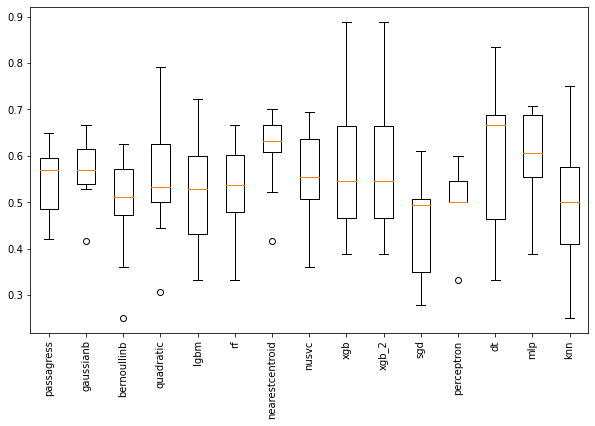

In [472]:
algoritmos = ['passagress', 'gaussianb', 'bernoullinb','quadratic','lgbm','rf','nearestcentroid','nusvc','xgb','xgb_2','sgd','perceptron','dt','mlp','knn']
resultados = [scores1,scores2,scores3,scores4,scores5,scores6,scores7,scores8,scores9,scores10,scores11,scores12,scores13,scores14,scores15]
# Comparando as performances nos conjunto de treinament/validacao
plt.figure(figsize=(10,6))
box_data = resultados
plt.boxplot(box_data, widths = 0.5)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15], algoritmos, rotation='vertical')
# ax7.boxplot(box_data)
plt.show()

## 9.1 Testes de normalidade

In [471]:
from scipy.stats import shapiro

In [481]:
for i,results in enumerate(resultados):
    
    algor = algoritmos[i]
    _, p = shapiro(results)
    p
    alpha = 0.01
    if p > alpha:
      print('%s - p-value = %s - Distribuição normal' %(algor, str(p)))
    else:
      print('%s - p-value = %s - Distribuição não normal' %(algor, str(p)))

passagress - p-value = 0.6175488233566284 - Distribuição normal
gaussianb - p-value = 0.48742640018463135 - Distribuição normal
bernoullinb - p-value = 0.2745133340358734 - Distribuição normal
quadratic - p-value = 0.926814079284668 - Distribuição normal
lgbm - p-value = 0.9434764385223389 - Distribuição normal
rf - p-value = 0.7911560535430908 - Distribuição normal
nearestcentroid - p-value = 0.03355512395501137 - Distribuição normal
nusvc - p-value = 0.8836442828178406 - Distribuição normal
xgb - p-value = 0.6112481355667114 - Distribuição normal
xgb_2 - p-value = 0.6112481355667114 - Distribuição normal
sgd - p-value = 0.3221961259841919 - Distribuição normal
perceptron - p-value = 0.015905873849987984 - Distribuição normal
dt - p-value = 0.02135140635073185 - Distribuição normal
mlp - p-value = 0.20899733901023865 - Distribuição normal
knn - p-value = 0.999994695186615 - Distribuição normal


Todas distribuições de acurácia balanceada são normais iremos aplicar testes estatísticos paramétricos ANOVA para verificar se há diferença estatística significante entre os algorítmos

- nearestcentroid
- 

In [483]:
from scipy.stats import f_oneway

In [490]:
_, p = f_oneway(scores1,scores13)


alpha = 0.05
if p <= alpha:
  print('Hipótese nula rejeitada. Os dados possuem diferença estatística significante')
else:
  print('Hipótese alternativa rejeitada')

Hipótese alternativa rejeitada
